In [ ]:
#Importer les modules:

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
import colorama
from colorama import Fore
from colorama import Style
import os, sys
import matplotlib
from matplotlib import cm
from matplotlib.patches import Circle, Wedge, Rectangle
from math import log10

import scipy.stats as stats

import statsmodels.api as sm
from statsmodels.formula.api import ols

import ast
import scipy.stats as stats
import re
from sklearn.preprocessing import StandardScaler
import math

In [2]:
print(pd.__version__)

1.3.4


In [ ]:
#A. IMPORTER LES DONNÉES:

In [3]:
cd Desktop\Data Science candidature\Projets\Projet 4\Data\

C:\Users\'titite\Desktop\Data Science candidature\Projets\Projet 4\Data


In [4]:
ls

 Le volume dans le lecteur C s'appelle OS
 Le num‚ro de s‚rie du volume est 609B-8774

 R‚pertoire de C:\Users\'titite\Desktop\Data Science candidature\Projets\Projet 4\Data

12/06/2022  11:32    <DIR>          .
12/06/2022  11:32    <DIR>          ..
01/07/2021  00:01         1ÿ588ÿ303 2015-building-energy-benchmarking.csv
01/07/2021  00:01         1ÿ235ÿ434 2016-building-energy-benchmarking.csv
26/03/2022  18:13           770ÿ246 archive.zip
13/06/2022  19:47           391ÿ478 Data_clean.csv
13/06/2022  19:47           466ÿ450 Data_clean_bins.csv
13/06/2022  19:48           271ÿ956 Data_clean_E.csv
01/07/2021  00:01            54ÿ630 socrata_metadata_2015-building-energy-benchmarking.json
01/07/2021  00:01            45ÿ816 socrata_metadata_2016-building-energy-benchmarking.json
               8 fichier(s)        4ÿ824ÿ313 octets
               2 R‚p(s)  152ÿ547ÿ414ÿ016 octets libres


In [ ]:
#-----------------------------------------------------------------------------------------------------------------------

#B. Création d'un seul tableau comportant les données de 2015 et 2016.

#B.1 Lectures des 2 tableaux de donnée 2015 e 2016:

In [5]:
df_2015=pd.read_csv('2015-building-energy-benchmarking.csv')

In [6]:
pd.set_option('display.max_columns', None)
df_2015.head(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,"{'latitude': '47.61421585', 'longitude': '-122...",7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,"{'latitude': '47.6137544', 'longitude': '-122....",7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576


In [7]:
df_2016=pd.read_csv('2016-building-energy-benchmarking.csv')

In [8]:
df_2016.head(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.00,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.00,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.00,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19
3,5,2016,NonResidential,Hotel,HOTEL MAX,620 STEWART ST,Seattle,WA,98101.0,0659000640,7,DOWNTOWN,47.61412,-122.33664,1926,1.0,10,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,56.0,110.800003,113.300003,216.199997,224.000000,6794584.0,6946800.5,2214446.25,8.115253e+05,2768924.0,18112.13086,1811213.0,False,NaN,Compliant,NaN,286.43,4.67
4,8,2016,NonResidential,Hotel,WARWICK SEATTLE HOTEL (ID8),401 LENORA ST,Seattle,WA,98121.0,0659000970,7,DOWNTOWN,47.61375,-122.34047,1980,1.0,18,175580,62000,113580,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.00,1.573449e+06,5368607.0,88039.98438,8803998.0,False,NaN,Compliant,NaN,505.01,2.88


In [ ]:
#------------------------------

#B.2 Caractéristiques des deux tableaux:

#B.2.1 Caractéristiques des données de 2015:

In [9]:
df_2015.count()

OSEBuildingID                                                    3340
DataYear                                                         3340
BuildingType                                                     3340
PrimaryPropertyType                                              3340
PropertyName                                                     3340
TaxParcelIdentificationNumber                                    3338
Location                                                         3340
CouncilDistrictCode                                              3340
Neighborhood                                                     3340
YearBuilt                                                        3340
NumberofBuildings                                                3340
NumberofFloors                                                   3332
PropertyGFATotal                                                 3340
PropertyGFAParking                                               3340
PropertyGFABuilding(

In [10]:
df_2015.shape

(3340, 47)

In [11]:
df_2015.dtypes

OSEBuildingID                                                      int64
DataYear                                                           int64
BuildingType                                                      object
PrimaryPropertyType                                               object
PropertyName                                                      object
TaxParcelIdentificationNumber                                     object
Location                                                          object
CouncilDistrictCode                                                int64
Neighborhood                                                      object
YearBuilt                                                          int64
NumberofBuildings                                                  int64
NumberofFloors                                                   float64
PropertyGFATotal                                                   int64
PropertyGFAParking                                 

In [ ]:
#Colonnes et pourcentage de données NON nulles pour 2015:

In [12]:
(100*(len(df_2015)-df_2015.isna().sum()))/len(df_2015)

OSEBuildingID                                                    100.000000
DataYear                                                         100.000000
BuildingType                                                     100.000000
PrimaryPropertyType                                              100.000000
PropertyName                                                     100.000000
TaxParcelIdentificationNumber                                     99.940120
Location                                                         100.000000
CouncilDistrictCode                                              100.000000
Neighborhood                                                     100.000000
YearBuilt                                                        100.000000
NumberofBuildings                                                100.000000
NumberofFloors                                                    99.760479
PropertyGFATotal                                                 100.000000
PropertyGFAP

In [ ]:
#B.2.2 Caractéristiques des données de 2016:

In [13]:
df_2016.count()

OSEBuildingID                      3376
DataYear                           3376
BuildingType                       3376
PrimaryPropertyType                3376
PropertyName                       3376
Address                            3376
City                               3376
State                              3376
ZipCode                            3360
TaxParcelIdentificationNumber      3376
CouncilDistrictCode                3376
Neighborhood                       3376
Latitude                           3376
Longitude                          3376
YearBuilt                          3376
NumberofBuildings                  3368
NumberofFloors                     3376
PropertyGFATotal                   3376
PropertyGFAParking                 3376
PropertyGFABuilding(s)             3376
ListOfAllPropertyUseTypes          3367
LargestPropertyUseType             3356
LargestPropertyUseTypeGFA          3356
SecondLargestPropertyUseType       1679
SecondLargestPropertyUseTypeGFA    1679


In [14]:
df_2016.shape

(3376, 46)

In [15]:
df_2016.dtypes

OSEBuildingID                        int64
DataYear                             int64
BuildingType                        object
PrimaryPropertyType                 object
PropertyName                        object
Address                             object
City                                object
State                               object
ZipCode                            float64
TaxParcelIdentificationNumber       object
CouncilDistrictCode                  int64
Neighborhood                        object
Latitude                           float64
Longitude                          float64
YearBuilt                            int64
NumberofBuildings                  float64
NumberofFloors                       int64
PropertyGFATotal                     int64
PropertyGFAParking                   int64
PropertyGFABuilding(s)               int64
ListOfAllPropertyUseTypes           object
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
SecondLarge

In [ ]:
#Colonnes et pourcentage de données NON nulles pour 2016:

In [16]:
(100*(len(df_2016)-df_2016.isna().sum()))/len(df_2016)

OSEBuildingID                      100.000000
DataYear                           100.000000
BuildingType                       100.000000
PrimaryPropertyType                100.000000
PropertyName                       100.000000
Address                            100.000000
City                               100.000000
State                              100.000000
ZipCode                             99.526066
TaxParcelIdentificationNumber      100.000000
CouncilDistrictCode                100.000000
Neighborhood                       100.000000
Latitude                           100.000000
Longitude                          100.000000
YearBuilt                          100.000000
NumberofBuildings                   99.763033
NumberofFloors                     100.000000
PropertyGFATotal                   100.000000
PropertyGFAParking                 100.000000
PropertyGFABuilding(s)             100.000000
ListOfAllPropertyUseTypes           99.733412
LargestPropertyUseType            

In [ ]:
#------------------------------

#B.3 Comparaison des variables disponibles dans chaque année:

#On n'a pas les mêmes variables entre les 2 années.

In [17]:
same=[]
diff_16_15=[]
diff_15_16=[]

for col in list(df_2016.columns):
        if col in list(df_2015.columns):
            same.append(col)
        else:
            diff_16_15.append(col)
for col in list(df_2015.columns):
        if col not in list(df_2016.columns):
            diff_15_16.append(col)


In [18]:
same

['OSEBuildingID',
 'DataYear',
 'BuildingType',
 'PrimaryPropertyType',
 'PropertyName',
 'TaxParcelIdentificationNumber',
 'CouncilDistrictCode',
 'Neighborhood',
 'YearBuilt',
 'NumberofBuildings',
 'NumberofFloors',
 'PropertyGFATotal',
 'PropertyGFAParking',
 'PropertyGFABuilding(s)',
 'ListOfAllPropertyUseTypes',
 'LargestPropertyUseType',
 'LargestPropertyUseTypeGFA',
 'SecondLargestPropertyUseType',
 'SecondLargestPropertyUseTypeGFA',
 'ThirdLargestPropertyUseType',
 'ThirdLargestPropertyUseTypeGFA',
 'YearsENERGYSTARCertified',
 'ENERGYSTARScore',
 'SiteEUI(kBtu/sf)',
 'SiteEUIWN(kBtu/sf)',
 'SourceEUI(kBtu/sf)',
 'SourceEUIWN(kBtu/sf)',
 'SiteEnergyUse(kBtu)',
 'SiteEnergyUseWN(kBtu)',
 'SteamUse(kBtu)',
 'Electricity(kWh)',
 'Electricity(kBtu)',
 'NaturalGas(therms)',
 'NaturalGas(kBtu)',
 'DefaultData',
 'ComplianceStatus',
 'Outlier']

In [19]:
diff_16_15

['Address',
 'City',
 'State',
 'ZipCode',
 'Latitude',
 'Longitude',
 'Comments',
 'TotalGHGEmissions',
 'GHGEmissionsIntensity']

In [20]:
diff_15_16

['Location',
 'OtherFuelUse(kBtu)',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Comment',
 '2010 Census Tracts',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'City Council Districts',
 'SPD Beats',
 'Zip Codes']

In [ ]:
#Dans la colonne "Location", qui existe pour l'année 2015 il y a plusieurs données inclues:

In [21]:
df_2015_Loc=df_2015['Location']
pd. set_option('display.max_colwidth', 199)
df_2015_Loc

0         {'latitude': '47.61219025', 'longitude': '-122.33799744', 'human_address': '{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}
1           {'latitude': '47.61310583', 'longitude': '-122.33335756', 'human_address': '{"address": "724 PINE ST", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}
2          {'latitude': '47.61334897', 'longitude': '-122.33769944', 'human_address': '{"address": "1900 5TH AVE", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}
3        {'latitude': '47.61421585', 'longitude': '-122.33660889', 'human_address': '{"address": "620 STEWART ST", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}
4           {'latitude': '47.6137544', 'longitude': '-122.3409238', 'human_address': '{"address": "401 LENORA ST", "city": "SEATTLE", "state": "WA", "zip": "98121"}'}
                                                                                     ...                                                                             

In [ ]:
#Il faut extraire ces données car par exemple les donnée de la colonne Zip Codes' en 2015 ne correspondent pas à celle 
#de la colonne "Zip Code" de 2016, qui eux oui correspondent avec le "Zip" inclus dans la colonne "Location" de 2015.
#Ou encore, notez que cette variable renferme les valeurs de 'Latitude', 'Longitude', 'Adress', 'City' et 'State'
#inexistantes comme colonnes individuelles pour 2015  et existantes comme colonnes individuelles en 2016.

In [22]:
df_2015['Location'] = [ast.literal_eval(str(item)) for index, item in df_2015.Location.iteritems()]

In [23]:
df_2015['Location'][0]

{'latitude': '47.61219025',
 'longitude': '-122.33799744',
 'human_address': '{"address": "405 OLIVE WAY", "city": "SEATTLE", "state": "WA", "zip": "98101"}'}

In [24]:
df_2015 = pd.concat([df_2015.drop(['Location'], axis=1), df_2015['Location'].apply(pd.Series)], axis=1)

In [25]:
df_2015.head(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,latitude,longitude,human_address
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61219025,-122.33799744,"{""address"": ""405 OLIVE WAY"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}"
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61310583,-122.33335756,"{""address"": ""724 PINE ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}"
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081,47.61334897,-122.33769944,"{""address"": ""1900 5TH AVE"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}"
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081,47.61421585,-122.33660889,"{""address"": ""620 STEWART ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98101""}"
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576,47.6137544,-122.3409238,"{""address"": ""401 LENORA ST"", ""city"": ""SEATTLE"", ""state"": ""WA"", ""zip"": ""98121""}"


In [26]:
df_2015['human_address'] = [ast.literal_eval(str(item)) for index, item in df_2015.human_address.iteritems()]

In [27]:
df_2015 = pd.concat([df_2015.drop(['human_address'], axis=1), df_2015['human_address'].apply(pd.Series)], axis=1)

In [28]:
df_2015.head(5)

,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes,latitude,longitude,address,city,state,zip
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61219025,-122.33799744,405 OLIVE WAY,SEATTLE,WA,98101
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081,47.61310583,-122.33335756,724 PINE ST,SEATTLE,WA,98101
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081,47.61334897,-122.33769944,1900 5TH AVE,SEATTLE,WA,98101
3,5,2015,NonResidential,Hotel,HOTEL MAX,659000640,7,DOWNTOWN,1926,1,10.0,61320,0,61320,Hotel,Hotel,61320.0,NaN,NaN,NaN,NaN,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,0.0,1936.34,31.38,No,NaN,Compliant,High Outlier,NaN,56.0,NaN,31.0,18081,47.61421585,-122.33660889,620 STEWART ST,SEATTLE,WA,98101
4,8,2015,NonResidential,Hotel,WARWICK SEATTLE HOTEL,659000970,7,DOWNTOWN,1980,1,18.0,119890,12460,107430,"Hotel, Parking, Swimming Pool",Hotel,123445.0,Parking,68009.0,Swimming Pool,0.0,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,0.0,507.70,4.02,No,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,19576,47.6137544,-122.3409238,401 LENORA ST,SEATTLE,WA,98121


In [ ]:
#------------------------------

#B.4 Homogénéisation des colonnes:

#Changement de nom pour faire coïncider les nouvelles colonnes de 2015 avec les colonnes déjà existantes de 2016.

In [29]:
df_2015=df_2015.rename(columns={'latitude':'Latitude', 'longitude':'Longitude','address':'Address', 'city':'City', 'state':'State', 'zip':'ZipCode'})

In [ ]:
#On vérifie de nouveau les colonnes communes entre les deux années 2015 et 2016:

In [30]:
diff_16_15=[]
diff_15_16=[]

for col in list(df_2016.columns):
        if col not in list(df_2015.columns):
            diff_16_15.append(col)
for col in list(df_2015.columns):
        if col not in list(df_2016.columns):
            diff_15_16.append(col)


In [31]:
diff_16_15

['Comments', 'TotalGHGEmissions', 'GHGEmissionsIntensity']

In [32]:
diff_15_16

['OtherFuelUse(kBtu)',
 'GHGEmissions(MetricTonsCO2e)',
 'GHGEmissionsIntensity(kgCO2e/ft2)',
 'Comment',
 '2010 Census Tracts',
 'Seattle Police Department Micro Community Policing Plan Areas',
 'City Council Districts',
 'SPD Beats',
 'Zip Codes']

In [ ]:
#Les colonne "Comments" en 2016 et "Comment" en 2015 sont la même chose.
#'GHGEmissionsIntensity(kgCO2e/ft2)' en 2015 et 'GHGEmissionsIntensity' en 2016 représentent strictement la même chose.
#'GHGEmissions(MetricTonsCO2e)' en 2015 et 'TotalGHGEmissions' semblent représenter la même chose (cf. ordres de grandeurs
#ci-dessous).

In [33]:
df_2015['GHGEmissions(MetricTonsCO2e)'].describe()

count     3330.000000
mean       110.094102
std        409.450179
min          0.000000
25%          9.265000
50%         32.740000
75%         88.642500
max      11824.890000
Name: GHGEmissions(MetricTonsCO2e), dtype: float64

In [34]:
df_2016['TotalGHGEmissions'].describe()

count     3367.000000
mean       119.723971
std        538.832227
min         -0.800000
25%          9.495000
50%         33.920000
75%         93.940000
max      16870.980000
Name: TotalGHGEmissions, dtype: float64

In [ ]:
#On va donc homogénéiser les noms de ces colonnes entre les deux années, de sorte à avoir toutes les colonnes de 2016 
#inclues dans la data de 2015. 
#En même temps on éliminera les colonnes "extra" qui apparaissent pour 2015: 'OtherFuelUse(kBtu)','2010 Census Tracts',
#'Seattle Police Department Micro Community Policing Plan Areas','City Council Districts','SPD Beats', et 'Zip Codes'.

In [35]:
df_2015 = df_2015.rename(columns={'GHGEmissions(MetricTonsCO2e)':'TotalGHGEmissions','GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity','Comment':'Comments'})
df_2015.drop(['OtherFuelUse(kBtu)','2010 Census Tracts','Seattle Police Department Micro Community Policing Plan Areas','City Council Districts','SPD Beats', 'Zip Codes'], axis=1, inplace=True)

In [ ]:
#Vérification qu'on a les même colonnes à la fin dans nos deux sets de données. 

In [36]:
diff_16_15=[]
diff_15_16=[]

for col in list(df_2016.columns):
        if col not in list(df_2015.columns):
            diff_16_15.append(col)
for col in list(df_2015.columns):
        if col not in list(df_2016.columns):
            diff_15_16.append(col)

In [37]:
diff_16_15

[]

In [38]:
diff_15_16

[]

In [ ]:
#Ordonnons les colonnes des 2 data set pareil.

In [39]:
df_2015= df_2015.reindex(columns=sorted(df_2015.columns))

In [40]:
df_2016= df_2016.reindex(columns=sorted(df_2016.columns))

In [41]:
df_2015.dtypes==df_2016.dtypes

Address                             True
BuildingType                        True
City                                True
Comments                           False
ComplianceStatus                    True
CouncilDistrictCode                 True
DataYear                            True
DefaultData                        False
ENERGYSTARScore                     True
Electricity(kBtu)                   True
Electricity(kWh)                    True
GHGEmissionsIntensity               True
LargestPropertyUseType              True
LargestPropertyUseTypeGFA           True
Latitude                           False
ListOfAllPropertyUseTypes           True
Longitude                          False
NaturalGas(kBtu)                    True
NaturalGas(therms)                  True
Neighborhood                        True
NumberofBuildings                  False
NumberofFloors                     False
OSEBuildingID                       True
Outlier                             True
PrimaryPropertyT

In [ ]:
#Notez qu'on n'a les mêmes dtypes dans toutes les variables, il y en a 7 qui ne matchent pas. Avant de regrouper il faut 
#homogénéiser les dtypes suivants:

#Comments
#DefaultData 
#Latitude
#Longitude
#NumberofBuildings
#NumberofFloors
#ZipCode

In [42]:
df_2015.dtypes

Address                             object
BuildingType                        object
City                                object
Comments                            object
ComplianceStatus                    object
CouncilDistrictCode                  int64
DataYear                             int64
DefaultData                         object
ENERGYSTARScore                    float64
Electricity(kBtu)                  float64
Electricity(kWh)                   float64
GHGEmissionsIntensity              float64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                            object
ListOfAllPropertyUseTypes           object
Longitude                           object
NaturalGas(kBtu)                   float64
NaturalGas(therms)                 float64
Neighborhood                        object
NumberofBuildings                    int64
NumberofFloors                     float64
OSEBuildingID                        int64
Outlier    

In [43]:
df_2016.dtypes

Address                             object
BuildingType                        object
City                                object
Comments                           float64
ComplianceStatus                    object
CouncilDistrictCode                  int64
DataYear                             int64
DefaultData                           bool
ENERGYSTARScore                    float64
Electricity(kBtu)                  float64
Electricity(kWh)                   float64
GHGEmissionsIntensity              float64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                           float64
ListOfAllPropertyUseTypes           object
Longitude                          float64
NaturalGas(kBtu)                   float64
NaturalGas(therms)                 float64
Neighborhood                        object
NumberofBuildings                  float64
NumberofFloors                       int64
OSEBuildingID                        int64
Outlier    

In [44]:
df_2016['Comments']=df_2016['Comments'].astype(str)
df_2016['DefaultData']=df_2016['DefaultData'].astype(str)
df_2016['Latitude']=df_2016['Latitude'].astype(str)
df_2016['Longitude']=df_2016['Longitude'].astype(str)
df_2015['NumberofBuildings']=df_2015['NumberofBuildings'].astype(float)
df_2016['NumberofFloors']=df_2016['NumberofFloors'].astype(float)
df_2016['ZipCode']=df_2016['ZipCode'].astype(str)

In [ ]:
#------------------------------

#B.5 Regroupement des tableaux des deux années:

#On regroupe les deux années dans un même jeu de données pour faciliter l'analyse des mêmes.
#En fait quand on y réfléchit pour un même bâtiments toutes les variables peuvent changer d'une année à l'autre (ie. on 
#peut construire un étage, acheté le terrain d'à côté et augmenter la surface au sol, réduire ou augmenter les consommations,
#...). Ainsi chaque bâtiment de chaque année peut être vu comme une entité nouvelle et indépendante, ce qui nous permets
#donc de considérer une seule base de donnée pour les deux années inclues.

#Bien sûr, ceci en sachant que la variable 'DataYear' présente dans les deux sets nous permettra de distinguer entre l'année 
#2015 et l'année 2016, et que on a certaines variables qui permettent d'identifier les bâtiments au cas ou on veuille voir 
#leur évolution dans le temps.

In [45]:
data = pd.concat([df_2015,df_2016], axis=0,ignore_index=True)

In [46]:
data.shape

(6716, 46)

In [47]:
data.dtypes

Address                             object
BuildingType                        object
City                                object
Comments                            object
ComplianceStatus                    object
CouncilDistrictCode                  int64
DataYear                             int64
DefaultData                         object
ENERGYSTARScore                    float64
Electricity(kBtu)                  float64
Electricity(kWh)                   float64
GHGEmissionsIntensity              float64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                            object
ListOfAllPropertyUseTypes           object
Longitude                           object
NaturalGas(kBtu)                   float64
NaturalGas(therms)                 float64
Neighborhood                        object
NumberofBuildings                  float64
NumberofFloors                     float64
OSEBuildingID                        int64
Outlier    

In [ ]:
#-----------------------------------------------------------------------------------------------------------------------
#C. Analyse et nettoyage des données:

In [48]:
data.count()

Address                            6716
BuildingType                       6716
City                               6716
Comments                           3389
ComplianceStatus                   6716
CouncilDistrictCode                6716
DataYear                           6716
DefaultData                        6715
ENERGYSTARScore                    5093
Electricity(kBtu)                  6697
Electricity(kWh)                   6697
GHGEmissionsIntensity              6697
LargestPropertyUseType             6560
LargestPropertyUseTypeGFA          6560
Latitude                           6716
ListOfAllPropertyUseTypes          6580
Longitude                          6716
NaturalGas(kBtu)                   6697
NaturalGas(therms)                 6697
Neighborhood                       6716
NumberofBuildings                  6708
NumberofFloors                     6708
OSEBuildingID                      6716
Outlier                             116
PrimaryPropertyType                6716


In [ ]:
#------------------------------

#C.1 Comprendre les variables:
#Nous avons 46 variables et 6716 lignes (en prenant les 2 années ensemble, soit 3340 en 2015 et 3376 en 2016 ). 
#Parmi les variables on a:

        #- Les suffixes WN : "Weather Normalized" qui sont les mesures normalisées avec les conditions climatiques. Pour,
        #nous la météo n'est pas à considérer.

        #- GHG → Greenhouse gases → mesurés en 'équivalentes de dioxyde de carbone' (CO2e).

        #- GFA → Gross floor area (GFA) → La surface totale au sol du bâtiment mesurée à la face externe des murs 
        #        extérieurs.

        #- EUI(kBtu/sf) → Energy use intensity → L'intensité de la consommation d'énergie est exprimée en énergie par pied  
        #carré par an, et est calculée en divisant l'énergie totale consommée par le bâtiment en un an (mesurée en kBtu ou 
        #GJ) par la surface de plancher brute totale du bâtiment (mesurée en pieds carrés ou en mètres carrés).

        #- kBtu → Kilo-British thermal unit.

        #- Site Energy → représente la quantité de chaleur et d'électricité consommée par un bâtiment telle que reflétée 
        #dans les factures de services publics.

        #- Source Energy → représente la quantité totale de combustible brut nécessaire au fonctionnement du bâtiment. Il 
        #intègre toutes les pertes de transport, de livraison et de production. En prenant en compte toute la consommation 
        #d'énergie, le score fournit une évaluation complète de l'efficacité énergétique d'un bâtiment.

In [ ]:
#------------------------------
#C.2 Élimination des variables avec les suffixes 'WN':

In [49]:
def search_componant(data, suffix=None):
  componant = []
  for col in data.columns:
      if suffix in col: 
        componant.append(col)
  return componant


data0=data.drop(search_componant(data,'WN'), axis=1)
data0.shape

(6716, 43)

In [ ]:
#------------------------------
#C.3 Élimination des lignes 'Outliers': 

#Notez qu'on a pour les 2 années une variable 'Outlier'.
#Ne sachant pas à quoi ça fait référence, afin d'éviter des erreur il faut éliminer ces lignes (en fait on ne sait pas à 
#quelle variable sont associées les outliers, ce qui explique qu'il vaille mieux les supprimer).

In [50]:
data1 = data0[~data0['Outlier'].isna()==False] 
data1.shape

(6600, 43)

In [51]:
data1=data1.drop(['Outlier'], axis=1)

In [52]:
data1.dtypes

Address                             object
BuildingType                        object
City                                object
Comments                            object
ComplianceStatus                    object
CouncilDistrictCode                  int64
DataYear                             int64
DefaultData                         object
ENERGYSTARScore                    float64
Electricity(kBtu)                  float64
Electricity(kWh)                   float64
GHGEmissionsIntensity              float64
LargestPropertyUseType              object
LargestPropertyUseTypeGFA          float64
Latitude                            object
ListOfAllPropertyUseTypes           object
Longitude                           object
NaturalGas(kBtu)                   float64
NaturalGas(therms)                 float64
Neighborhood                        object
NumberofBuildings                  float64
NumberofFloors                     float64
OSEBuildingID                        int64
PrimaryProp

In [ ]:
#On a un total:
#- 6600 bâtiments entre 2015 et 2016, et
#- 43 variables (sans la variable 'Outliers' et sans les variables avec suffixe 'WN'): 23 quantitatives (ie. int64 ou 
#  float64) et 20 qualitatives (ie. object).


#------------------------------
#C.4 Élimination des 'BuildingType' "NON DESTINES A L'HABITATION": 

#Le projet se centre sur les bâtiments "NON DESTINES A L'HABITATION", il faut donc éliminer toutes les lignes dont le 
#"BuildingType" correspond à l'habitation:

In [53]:
build_type= data1['BuildingType'].unique()
build_type

array(['NonResidential', 'Nonresidential COS', 'Multifamily MR (5-9)',
       'SPS-District K-12', 'Multifamily LR (1-4)', 'Campus',
       'Multifamily HR (10+)', 'Nonresidential WA'], dtype=object)

In [ ]:
#On éliminera donc les lignes associées aux 'Multifamily MR (5-9)', 'Multifamily LR (1-4)', 'Multifamily LR (1-4)':

In [54]:
data1= data1[~data1['BuildingType'].str.contains('Multifamily')] 
data1['BuildingType'].unique()

array(['NonResidential', 'Nonresidential COS', 'SPS-District K-12',
       'Campus', 'Nonresidential WA'], dtype=object)

In [55]:
data1.shape

(3270, 42)

In [ ]:
#------------------------------

#C.5 Corrélations entre les 43 variables (Pearson pour les 23 quantitatives et ANOVA pour les 20 qualitatives):

#C.5.1 Corrélations de pearson entre les 23 variables quantitatives:

<AxesSubplot:>

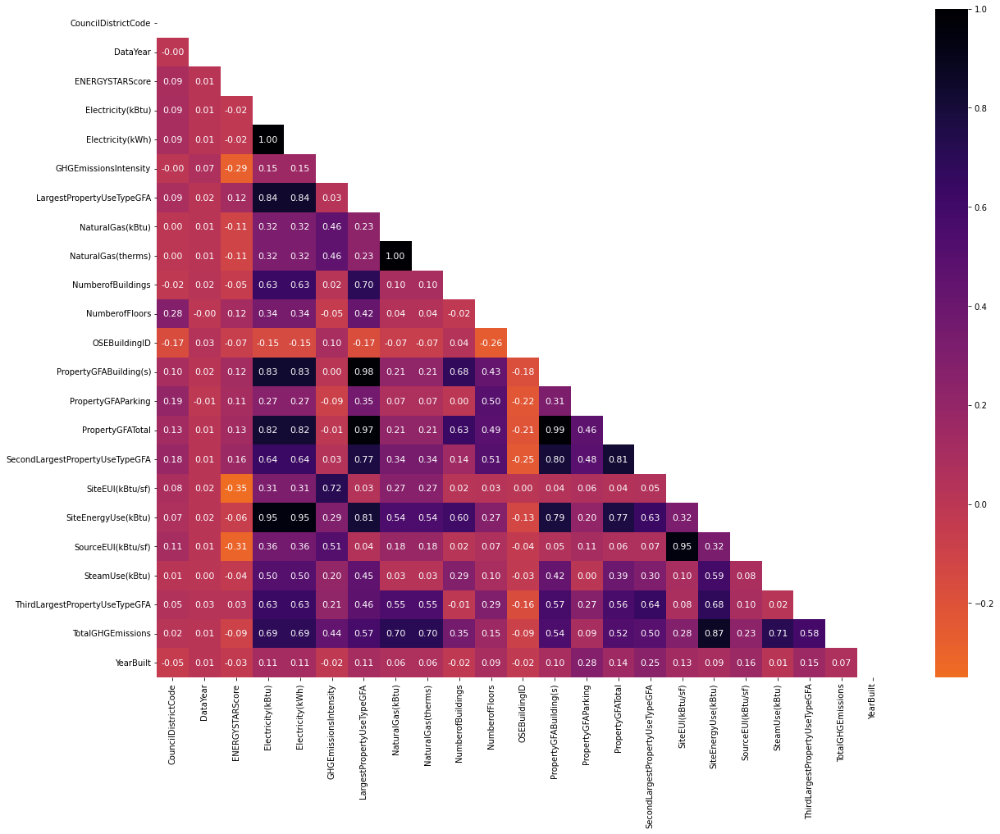

In [56]:
corr=data1.corr(method='pearson')
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(20,15))
plt.rc('axes', labelsize=60)
sns.heatmap(corr, annot=True, fmt=".2f", annot_kws={'size':11},mask=mask, center=0, cmap="inferno_r")

In [ ]:
#On considère une corrélation de pearson grande ou importante lorsque sa valeur absolue est >= 0.6. 

#Ainsi, notez que:
# -YearBuilt, NumberofFloors et ENERGYSTARScore NE SONT PAS grandement corrélées avec aucune variable. Ce qui uni a leur 
#  signification en fait des variables explicatives intéressantes.

# -PropertyGFATotal, est très corrélée avec les variables suivantes: PropertyGFABuilding(s), LargestPropertyUseTypeGFA, 
#  SecondLargestPropertyUseTypeGFA, SiteEnergyUse(kBtu), Electricity(kWh), Electricity(kBtu), GHGEmissionIntensity. Ceci 
#  veut dire qu'elle porte en elle les information fournies par toutes ces variables. Ceci uni au fait qu'elle inclue la 
#  totalité de la surface au sol en fait une variable explicative complète et intéressante.

# -SourceEUI(kBtu/sf), est très corrélée uniquement avec la variables SiteEUI(kBtu/sf). Elle est aussi de façon moins 
#  importante (ie. corrélation comprise entre [0.2;0.5)) corrélée avec la variable "GHGEmissionIntensity". Parmi les 
#  variables liées à l'énergie c'est celle aux corrélations les plus stables, les plus bases. Ceci uni au fait qu'elle inclut la totalité de l'énergie dépensé
#  depuis la source en fait une variable CIBLE complète et intéressante.

# -TotalGHGEmissions est très corrélée avec les variables SiteEnergyUse(kBtu), SteamUse(kBtu), NaturalGas(kbtu), 
#  NaturalGas(therms), Electricity(kWh), Electricity(kBtu), et  englobe la totalité des émissions de carbone ce qui en fait
#  une variable CIBLE complète et intéressante.


#Voyons quelles sont les plus grandes corrélations parmi toutes les variables (ie.||>=0.6):


In [57]:
def corrFilter(x: pd.DataFrame, bound: float):
    xCorr = x.corr()
    xFiltered = xCorr[((xCorr >= bound) | (xCorr <= -bound)) & (xCorr !=1.000)]
    xFlattened = xFiltered.unstack().sort_values().drop_duplicates()
    return xFlattened

corrFilter(data1, .6)

NumberofBuildings                SiteEnergyUse(kBtu)                0.604575
SiteEnergyUse(kBtu)              SecondLargestPropertyUseTypeGFA    0.630165
ThirdLargestPropertyUseTypeGFA   Electricity(kBtu)                  0.631758
Electricity(kWh)                 ThirdLargestPropertyUseTypeGFA     0.631761
NumberofBuildings                PropertyGFATotal                   0.632152
                                 Electricity(kBtu)                  0.634446
Electricity(kWh)                 NumberofBuildings                  0.634452
Electricity(kBtu)                SecondLargestPropertyUseTypeGFA    0.635827
Electricity(kWh)                 SecondLargestPropertyUseTypeGFA    0.635827
ThirdLargestPropertyUseTypeGFA   SecondLargestPropertyUseTypeGFA    0.643696
PropertyGFABuilding(s)           NumberofBuildings                  0.677891
ThirdLargestPropertyUseTypeGFA   SiteEnergyUse(kBtu)                0.682798
TotalGHGEmissions                Electricity(kWh)                   0.685410

In [ ]:
#Ainsi, de l'étude des corrélation de pearson précédente les variables qui semblent plus intéressantes du point de vue de 
#et de leur corrélation avec les autres variables et de leur poids informatif sont:
        #'YearBuilt', 'NumberofFloors', 'ENERGYSTARScore', 'PropertyGFATotal', 'SourceEUI(kBtu/sf)', 'TotalGHGEmissions'
    
#On commence par mettre en format Python la variable 'SourceEUI(kBtu/sf)', en la changeant pour 'SourceEUI_kBtu_sf'

In [58]:
data1=data1.rename(columns={'SourceEUI(kBtu/sf)':'SourceEUI_kBtu_sf'})

In [59]:
data1_selected=data1.loc[:,['YearBuilt','NumberofFloors','ENERGYSTARScore','PropertyGFATotal','SourceEUI_kBtu_sf','TotalGHGEmissions']]

<AxesSubplot:>

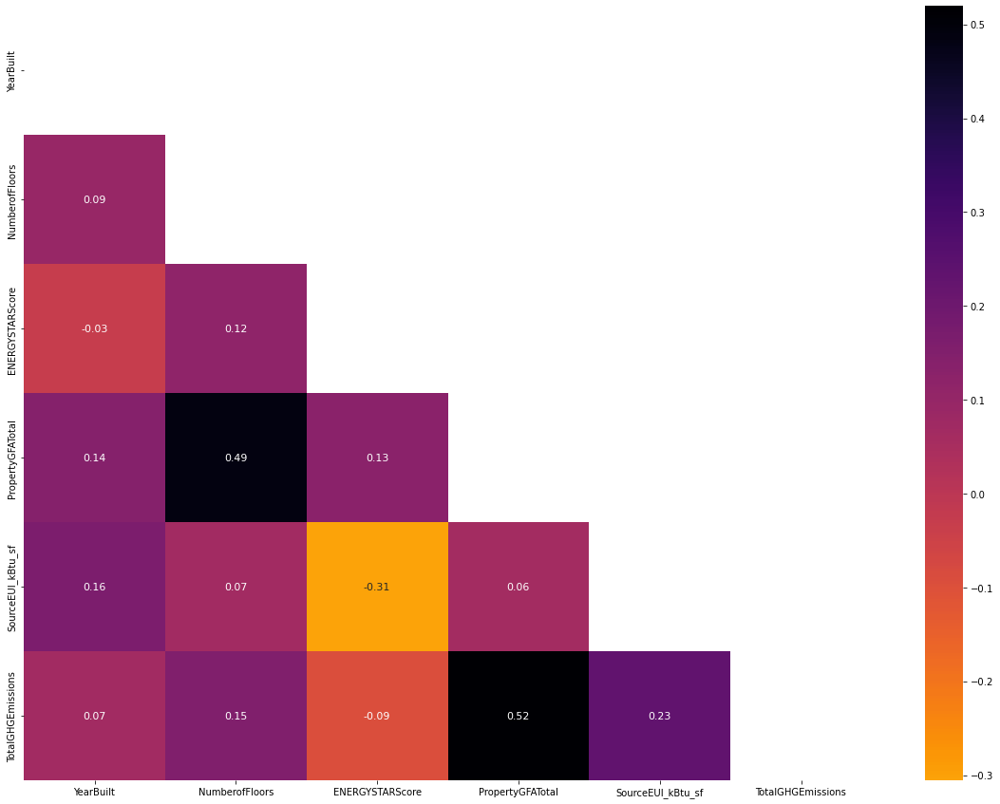

In [60]:
corr=data1_selected.corr(method='pearson')
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
fig, ax = plt.subplots(figsize=(20,15))
plt.rc('axes', labelsize=60)
sns.heatmap(corr, annot=True, fmt=".2f", annot_kws={'size':11},mask=mask, center=0, cmap="inferno_r")

In [ ]:
#On voit qu'en prenant les variables sélectionnées on n'a pas de grandes corrélations entre nos variables. On a juste
#'PropertyGFA Total' qui est légèrement corrélée avec 'TotalGHGEmissions' et avec 'NumberofFloors'

#Maintenant, 

#ATTENTION: les variables qui manquent dans notre première étude de corrélations: 'BuildingType', 'PrimaryPropertyType', 
#'PropertyName', 'TaxParcelIdentificationNumber', 'Neighborhood', 'ListOfAllPropertyUseTypes','LargestPropertyUseType', 
#'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType', 'YearsENERGYSTARCertified', 
#'DefaultData', 'Comments', 'ComplianceStatus', 'Latitude', 'Longitude', 'Address', 'City', State', 'ZipCode' et 'Outliers',
#c'est car ce sont des variables qualitatives et non quantitatives (ie. non numériques en quelque sorte).


#Parmi elles: 'BuildingType', 'Neighborhood' et 'ZipCode', sont les uniques potentiellement intéressantes. En fait:

    #- 'City' et 'State', sont toujours les mêmes Seattle et WA respectivement.
    #- 'Latitude','Longitude','Address', 'Neighborhood' sont un peu trop spécifiques et donc difficiles pour trouver des 
    #   généralités, le 'ZipCode' étant plus adapté.
    #- 'DefaultData','Comments', 'ComplianceStatus' n'apportent pas vraiment un plus informatif.
    #- 'YearsENERGYSTARCertified', n'est pas d'utilité.
    #- 'ListOfAllPropertyUseTypes','LargestPropertyUseType','SecondLargestPropertyUseType','ThirdLargestPropertyUseType' 
    #  et 'PrimaryPropertyType'sont en gros inclus dans 'BuildingType' qui est plus adapté et plus général.
    #- 'Outliers', on va pouvoir la supprimer car on les a éliminer.
    #- 'TaxParcelIdentificationNumber' et 'PropertyName', pourront nous servir juste à titre informatif pour identifier les 
    #  bâtiments, mais elles ne représentent pas un plus pour nos modèles.


#Maintenant comme: 'BuildingType', 'Neighborhood' et 'ZipCode' sont en quelque sorte des variables qualitatives, on ne peut
#pas calculer leur corrélation de pearson, mais on peut utiliser la méthode ANOVA pour voir leur corrélation avec les 
#variables quantitatives qui du point de vu de leur corrélation ce sont avérées intéressantes.

#ATTENTION: Uniquement pour le variables quantitatives il est nécessaire avant de calcules l'ANOVA de vérifier qu’on n'ai pas 
#de redondances aux seins de leur valeur ni dans une même année ni entre les deux années 2015 et 2016. Ceci pour bien avoir le
#poids correct de chacune des "qualités" (ou "valeurs") de chaque variable quantitative. Pas besoin de faire ça avec les 
#variables qualitatives car il n'y a pas de problème de "poids", car en gros toutes les valeurs numériques prises par une 
#variable quantitative ont le même "poids" au moment du calcul des corrélations.


#C.5.2 Étude de l'ANOVA pour les variables qualitatives (ie. Non numériques).
#On commence par séparer nos deux années:

In [61]:
data1_2015=data1.loc[data1['DataYear']==2015]
data1_2015.shape

(1619, 42)

In [62]:
data1_2016=data1.loc[data1['DataYear']==2016]
data1_2016.shape

(1651, 42)

In [ ]:
#On a 32 lignes de plus en 2016.

#C.5.2.1 Étude ANOVA pour 'BuildingType'.

#On commence par vérifier qu'on n'ai pas de redondances parmi les 'BuildingType' en 2015 et en 2016.
#(Ceci est à faire uniquement pour les variables quantitatives on n'a pas besoin de vérifier ceci avant le calcul des 
#corrélations).

In [63]:
building_type_2015 = data1_2015.groupby(by='BuildingType')['OSEBuildingID'].nunique()
building_type_2015

BuildingType
Campus                  22
NonResidential        1432
Nonresidential COS      68
SPS-District K-12       97
Name: OSEBuildingID, dtype: int64

In [64]:
building_type_2016 = data1_2016.groupby(by='BuildingType')['OSEBuildingID'].nunique()
building_type_2016

BuildingType
Campus                  24
NonResidential        1445
Nonresidential COS      84
Nonresidential WA        1
SPS-District K-12       97
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez qu'on a en 2016 une nouvelle catégorie avec 1 seul bâtiment. La considération de ce type de bâtiment n'affectera en 
#rien notre travail. On peut donc dire qu'il n'y a pas de redondances. Notez aussi que en faisant la différence entre 2016 
#et 2015 on retrouve les 32 bâtiments en plus en 2016.

#Voyons la distribution totale des BuildingType sans doublons (ie. les deux années inclues et sans répéter les ID en 
#doublons, c'est à dire on considère une seule fois les ID qui conservent le même building type les deux années):

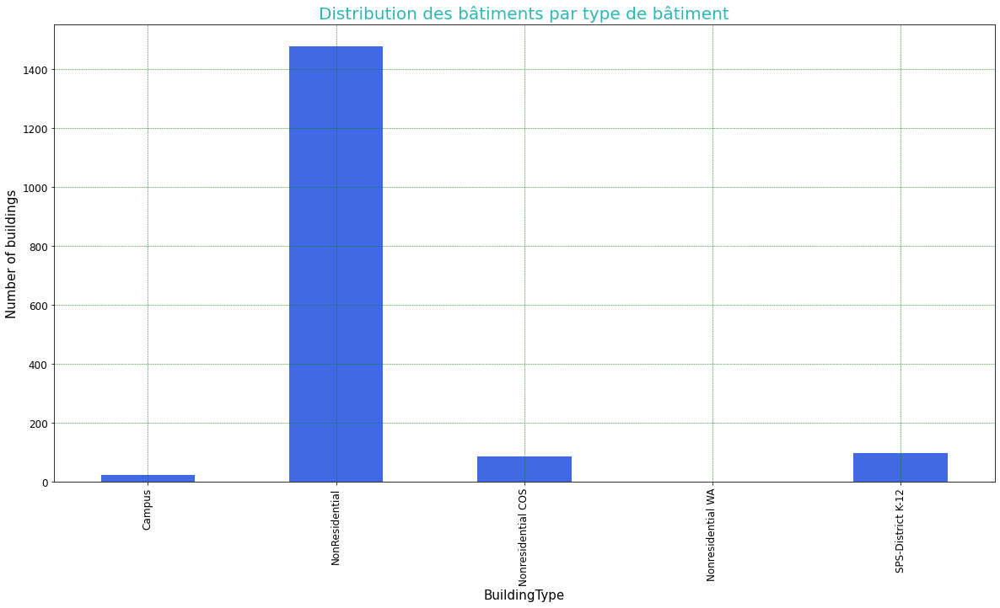

In [65]:
building= data1.groupby(by='BuildingType')['OSEBuildingID'].nunique()

plt.figure(figsize=(20,10))

building.plot(kind='bar', color='royalblue')
plt.xlabel('BuildingType',size=15)
plt.ylabel('Number of buildings', size=15)
plt.yticks(size=12)
plt.xticks(size=12, rotation=90)
plt.title("Distribution des bâtiments par type de bâtiment", color='#2cb7b0', size=20)

plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.xticks(rotation=90)
plt.show()

In [ ]:
#Voyons la distribution totale des BuildingType (ie. avec doublons).

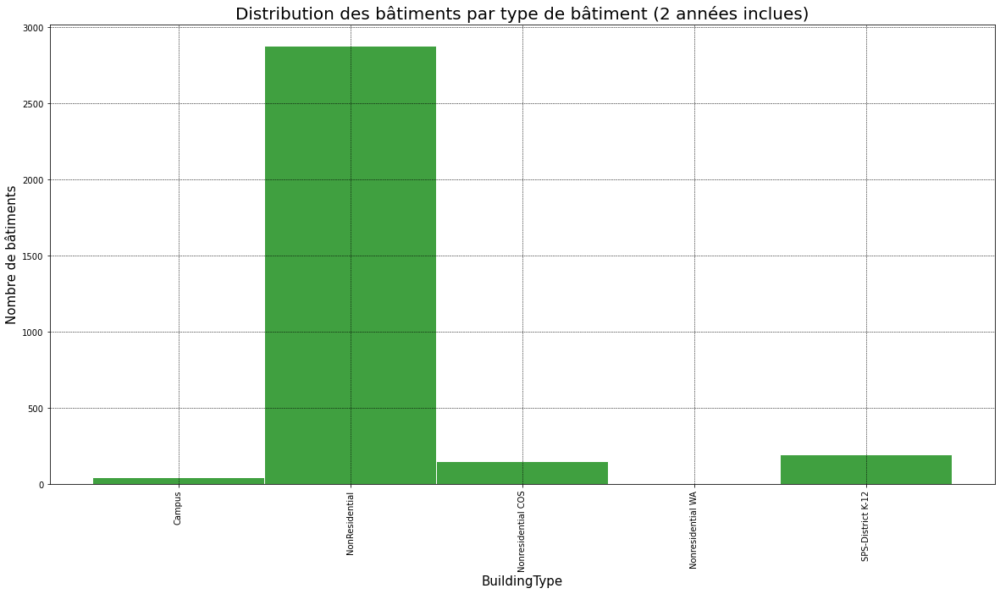

In [66]:
d1_bdt=data1.sort_values('BuildingType',ascending = True)

fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=d1_bdt, x='BuildingType', color='green', label='Total', edgecolor='white')
ax.set_xlabel('BuildingType',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par type de bâtiment (2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [67]:
model = ols('YearBuilt ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,3.333980e+04,8334.949865,7.907688,0.000002
Residual,3265.0,3.441412e+06,1054.031136,NaN,NaN


In [68]:
model = ols('NumberofFloors ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,1378.725937,344.681484,7.960569,0.000002
Residual,3257.0,141023.529122,43.298597,NaN,NaN


In [69]:
model = ols('ENERGYSTARScore ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,7.641404e+04,19103.510935,25.082001,2.467127e-20
Residual,2171.0,1.653525e+06,761.642212,NaN,NaN


In [70]:
model = ols('PropertyGFATotal ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,7.464070e+12,1.866018e+12,30.25292,9.359989e-25
Residual,3265.0,2.013871e+14,6.168058e+10,NaN,NaN


In [71]:
model = ols('SourceEUI_kBtu_sf ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,2.263507e+06,565876.640730,18.344964,6.447210e-15
Residual,3258.0,1.004977e+08,30846.429391,NaN,NaN


In [72]:
model = ols('TotalGHGEmissions ~ BuildingType', data=data1).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
BuildingType,4.0,7.112630e+07,1.778157e+07,41.56242,4.940912e-34
Residual,3258.0,1.393864e+09,4.278282e+05,NaN,NaN


In [ ]:
#En regardant les résultats de l'ANOVA pour le 'BuildingType' par rapport au 6 variables qualitatives aux meilleures 
#corrélations et qui en plus englobent les informations des autres, on voit quelles sont corrélées en quelque sorte 
#(ie. p<<0.05).
#Ceci est normal car si on réfléchit un peu un hôtel par exemple a: un nombre d'étages, une surface au sol, une émission 
#totale carbone, une dépense d'énergie à la source, supérieures et/ou complètement différentes à celles d'un campus. 

#En plus des fois il y a des normes écologiques établies pour certains buildings ce qui explique la corrélation avec le 
#'ENERGYSTARScore'.

#Il y a aussi des années où on a plus ou moins de constructions d’hôtels par exemple selon les besoins et selon l'état
#de l'économie, et du coup des années avec plus ou moins d'un certain type de building.

#Néanmoins nous ce qui nous intéresse de cette variable descriptive c'est en effet voir si le 'BuildingType' est 
#descriptif d'une tendance en dépense énergétique et en émission de carbone; et donc on est intéressés par la 
#corrélation entre le 'BuilgingType' et la 'SourceEUI_kBtu_sf', puis le 'BuildingType' et la 'TotalGHGEmissions'.



#C.5.2.2 Étude ANOVA pour 'Neighborhood'.

#On commence par vérifier qu'on n'ai pas de redondances parmi les 'Neighborhood'.
#(Ceci est à faire uniquement pour les variables quantitatives on n'a pas besoin de vérifier ceci avant le calcul des 
#corrélations).

In [73]:
Neighborhood_2015 = data1_2015.groupby(by='Neighborhood')['OSEBuildingID'].nunique()
Neighborhood_2015

Neighborhood
BALLARD                   68
CENTRAL                   52
DELRIDGE                  45
DOWNTOWN                 357
EAST                     121
GREATER DUWAMISH         337
LAKE UNION               143
MAGNOLIA / QUEEN ANNE    145
NORTH                     65
NORTHEAST                112
NORTHWEST                 88
SOUTHEAST                 46
SOUTHWEST                 40
Name: OSEBuildingID, dtype: int64

In [74]:
Neighborhood_2016 = data1_2016.groupby(by='Neighborhood')['OSEBuildingID'].nunique()
Neighborhood_2016

Neighborhood
BALLARD                    64
Ballard                     6
CENTRAL                    49
Central                     5
DELRIDGE                   42
DELRIDGE NEIGHBORHOODS      1
DOWNTOWN                  356
Delridge                    4
EAST                      120
GREATER DUWAMISH          342
LAKE UNION                148
MAGNOLIA / QUEEN ANNE     149
NORTH                      58
NORTHEAST                 126
NORTHWEST                  81
North                       9
Northwest                   5
SOUTHEAST                  46
SOUTHWEST                  40
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez que en 2016 certains quartiers sont redondants: 
    # -"BALLARD" et "Ballard"; 
    # -"CENTRAL" et "Central"; 
    # -"DELRIDGE", "DELRIDGE NEIGHBORHOODS" et "Delridge"; 
    # -"NORTH" et "North";
    # -"NORTHWEST" et "Northwest".
#En homogénéisant les redondances on retrouve les mêmes 13 catégories de 2015. Il faut donc homogénéiser:

    #-Dans la base de donnée 2016:

In [75]:
data1_2016New=data1_2016
data1_2016New.replace({'Neighborhood':{'Ballard':'BALLARD','Central':'CENTRAL','DELRIDGE NEIGHBORHOODS':'DELRIDGE','Delridge':'DELRIDGE','North':'NORTH','Northwest':'NORTHWEST'}}, inplace=True)
Neighborhood_2016New = data1_2016New.groupby(by='Neighborhood')['OSEBuildingID'].nunique()
Neighborhood_2016New

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:1773: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(ilocs[0], value, pi)


Neighborhood
BALLARD                   70
CENTRAL                   54
DELRIDGE                  47
DOWNTOWN                 356
EAST                     120
GREATER DUWAMISH         342
LAKE UNION               148
MAGNOLIA / QUEEN ANNE    149
NORTH                     67
NORTHEAST                126
NORTHWEST                 86
SOUTHEAST                 46
SOUTHWEST                 40
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez que en faisant la différence entre le nombre de bâtiments par quartier en 2015 et 2016 on a:
#(70-68)+(54-52)+(47-45)+(356-357)+(120-121)+(342-337)+(148-143)+(149-145)+(67-65)+(126-112)+(86-88)+(46-46)+(40-40)=32
#ce qui correspond au 32 ligne extra de l'année 2017.

    #-Dans la base de donnée avec les 2 années (2015 et 2016):

In [76]:
data1_New=data1
data1_New.replace({'Neighborhood':{'Ballard':'BALLARD','Central':'CENTRAL','DELRIDGE NEIGHBORHOODS':'DELRIDGE','Delridge':'DELRIDGE','North':'NORTH','Northwest':'NORTHWEST'}}, inplace=True)
Neighborhood_New = data1_New.groupby(by='Neighborhood')['OSEBuildingID'].nunique()
Neighborhood_New

Neighborhood
BALLARD                   71
CENTRAL                   55
DELRIDGE                  47
DOWNTOWN                 366
EAST                     125
GREATER DUWAMISH         350
LAKE UNION               153
MAGNOLIA / QUEEN ANNE    154
NORTH                     67
NORTHEAST                127
NORTHWEST                 89
SOUTHEAST                 48
SOUTHWEST                 42
Name: OSEBuildingID, dtype: int64

In [77]:
data1_New.shape

(3270, 42)

In [ ]:
#Voyons la distribution totale des Neighborhood sans doublons (ie. les deux années inclues et sans répéter les ID en 
#doublons, c'est à dire on considère une seule fois les ID qui conservent le même quartier les deux années):

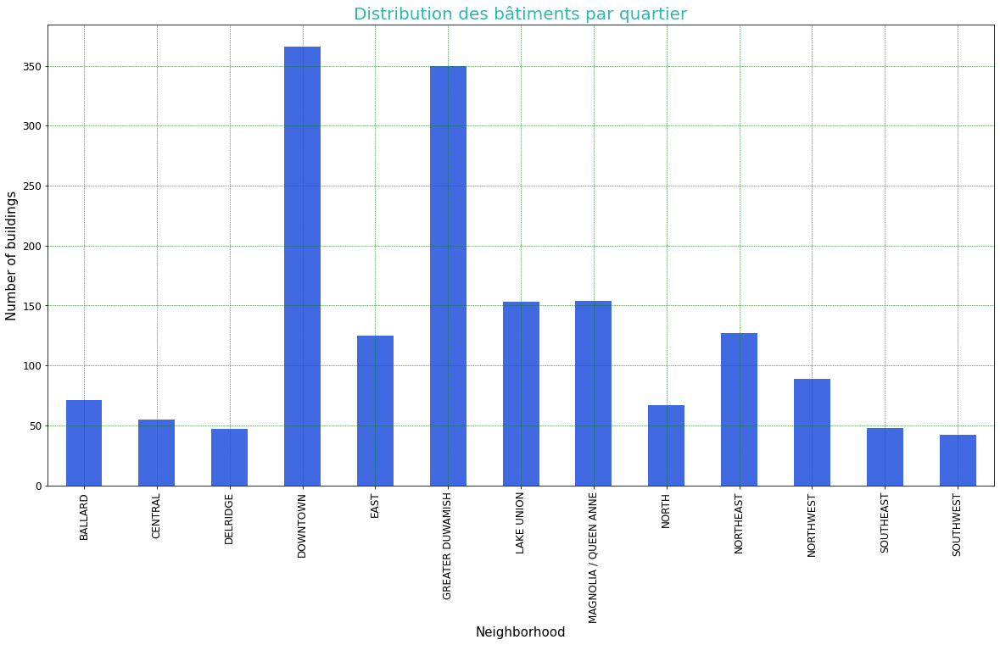

In [78]:
Neighborhood= data1.groupby(by='Neighborhood')['OSEBuildingID'].nunique()

plt.figure(figsize=(20,10))

Neighborhood.plot(kind='bar', color='royalblue')
plt.xlabel('Neighborhood',size=15)
plt.ylabel('Number of buildings', size=15)
plt.yticks(size=12)
plt.xticks(size=12, rotation=90)
plt.title("Distribution des bâtiments par quartier", color='#2cb7b0', size=20)

plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.xticks(rotation=90)
plt.show()

In [ ]:
#Voyons la distribution totale des Neighborhood (ie. avec doublons).

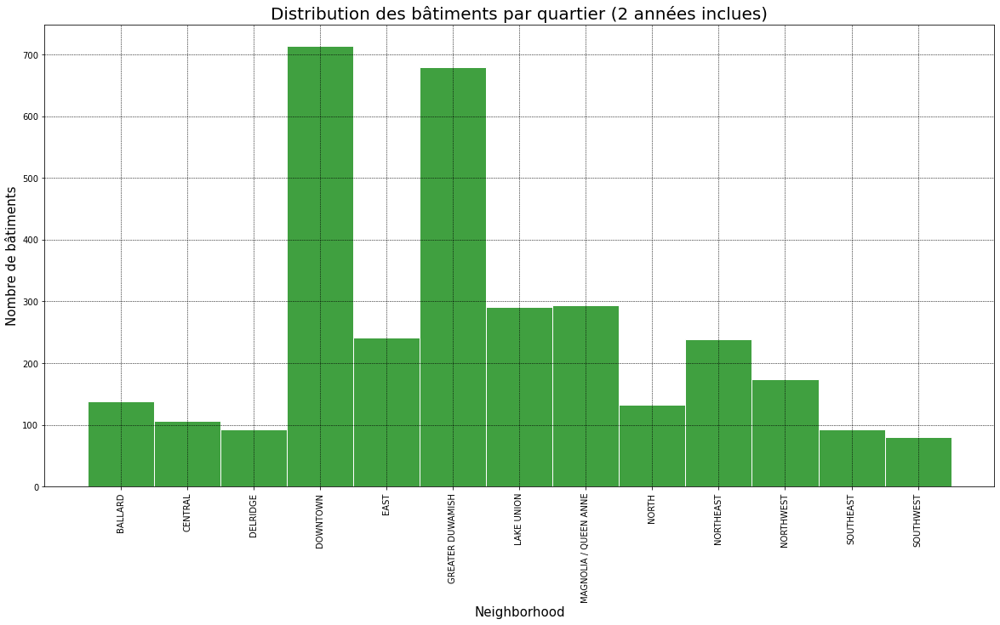

In [79]:
d1_Nei=data1_New.sort_values('Neighborhood',ascending = True)

fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=d1_Nei, x='Neighborhood', color='green', label='Total', edgecolor='white')
ax.set_xlabel('Neighborhood',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par quartier (2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [80]:
model = ols('YearBuilt ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,3.866476e+05,32220.631547,33.982858,6.242711e-75
Residual,3257.0,3.088104e+06,948.143654,NaN,NaN


In [81]:
model = ols('NumberofFloors ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,27799.523330,2316.626944,65.676628,1.624171e-143
Residual,3249.0,114602.731728,35.273232,NaN,NaN


In [82]:
model = ols('ENERGYSTARScore ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,6.789280e+04,5657.733744,7.359682,2.086761e-13
Residual,2162.0,1.662031e+06,768.747004,NaN,NaN


In [83]:
model = ols('PropertyGFATotal ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,9.072828e+12,7.560690e+11,12.326245,6.192758e-25
Residual,3257.0,1.997783e+14,6.133814e+10,NaN,NaN


In [84]:
model = ols('SourceEUI_kBtu_sf ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,3.249968e+06,270830.704495,8.845233,6.936635e-17
Residual,3250.0,9.951121e+07,30618.832328,NaN,NaN


In [85]:
model = ols('TotalGHGEmissions ~ Neighborhood', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)

anova_table

,df,sum_sq,mean_sq,F,PR(>F)
Neighborhood,12.0,3.095146e+07,2.579289e+06,5.845509,3.961511e-10
Residual,3250.0,1.434039e+09,4.412428e+05,NaN,NaN


In [ ]:
#En regardant les résultats de l'ANOVA pour le 'Neighborhood' par rapport au 6 variables qualitatives aux meilleures 
#corrélations et qui en plus englobent les informations des autres, on voit de nouveau quelles sont corrélées en quelque 
#sorte.
#Ceci est normal car si on réfléchit un peu, encore une fois pour des question d'urbanisme et de permis, il y a des 
#quartiers où la surface au sol par terrain et le type de constructions autorisées sont régulés. 

#De plus, comme on l'a vu auparavant, la dépense totale d'énergie à la source, l'émission de carbone totale le 
#'ENERGYSTARScore', et l'année de construction sont corrélées avec le type de bâtiment et donc de façon indirecte avec le
#quartier.

#Néanmoins, encore une fois, ce qui nous intéresse de cette variable descriptive c'est en effet voir si le 'Neighborhood' 
#est descriptif d'une tendance en dépense énergétique et en émission de carbone; et donc on est intéressés par la 
#corrélation entre le 'Neighborhood' et la 'SourceEUI_kBtu_sf', puis le 'Neighborhood' et la 'TotalGHGEmissions'.



#C.5.2.3 Étude ANOVA pour 'ZipCode'.

#On commence par vérifier qu'on n'ai pas de redondances parmi les 'ZipCode'.
#(Ceci est à faire uniquement pour les variables quantitatives on n'a pas besoin de vérifier ceci avant le calcul des 
#corrélations).
#En ce cas vérifier la redondance en faisant deux listes est inutile, car il y a énormément de Codes Postales différents, 
#et des fois pour des question d'urbanisme ils peuvent changer surtout quand le bâtiment est à la frontière de 2 zones 
#postales (pas forcément quartiers car souvent il n'y a pas un seul code postal par quartier).
#Il est donc plus intéressant, visuel et accessible à la compréhension de voir la distribution de nos 6600 bâtiments par
#code postale en 2015 et 2016.

In [86]:
ZipCode_2015 = data1_2015.groupby(by='ZipCode')['OSEBuildingID'].nunique()
ZipCode_2015

ZipCode
98101    150
98102     31
98103     66
98104    161
98105     82
98106     29
98107     52
98108    118
98109    136
98112     21
98115     51
98116     22
98117     20
98118     48
98119     63
98121     76
98122     88
98125     54
98126     24
98133     53
98134    195
98136      4
98144     46
98146      2
98155      2
98177      2
98178      3
98199     20
Name: OSEBuildingID, dtype: int64

In [87]:
ZipCode_2016 = data1_2016New.groupby(by='ZipCode')['OSEBuildingID'].nunique()
ZipCode_2016

ZipCode
98006.0      1
98011.0      1
98013.0      2
98020.0      1
98033.0      1
98053.0      1
98070.0      1
98101.0    146
98102.0     26
98103.0     68
98104.0    156
98105.0     84
98106.0     26
98107.0     49
98108.0    119
98109.0    139
98111.0      2
98112.0     21
98113.0      1
98114.0      1
98115.0     51
98116.0     24
98117.0     20
98118.0     46
98119.0     62
98121.0     83
98122.0     91
98124.0      2
98125.0     52
98126.0     21
98133.0     50
98134.0    180
98136.0      6
98144.0     48
98145.0      1
98146.0      3
98154.0      2
98155.0      4
98164.0      1
98165.0      1
98168.0      2
98177.0      2
98178.0      3
98181.0      1
98185.0      1
98191.0      1
98195.0      9
98199.0     22
nan         16
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez que le format des ZipCode en 2015 et 2016 sont différents, homogénéisons les:
#Dans la data de 2016

In [88]:
data1_2016New['ZipCode_New']= data1_2016New['ZipCode'].astype(str)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/3164556636.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data1_2016New['ZipCode_New']= data1_2016New['ZipCode'].astype(str)


In [89]:
data1_2016New['ZipCode_New'].replace({'98006.0':'98006', '98011.0':'98011','98012.0':'98012','98013.0':'98013','98020.0':'98020','98028.0':'98028','98033.0':'98033','98040.0':'98040','98053.0':'98053','98070.0':'98070','98101.0':'98101','98102.0':'98102','98103.0':'98103','98104.0':'98104','98105.0':'98105','98106.0':'98106','98107.0':'98107','98108.0':'98108','98109.0':'98109','98111.0':'98111','98112.0':'98112','98113.0':'98113','98114.0':'98114','98115.0':'98115','98116.0':'98116','98117.0':'98117','98118.0':'98118','98119.0':'98119','98121.0':'98121','98122.0':'98122','98124.0':'98124','98125.0':'98125','98126.0':'98126','98127.0':'98127','98133.0':'98133','98134.0':'98134','98136.0':'98136','98144.0':'98144','98145.0':'98145','98146.0':'98146','98154.0':'98154','98155.0':'98155','98164.0':'98164','98165.0':'98165','98168.0':'98168','98177.0':'98177','98178.0':'98178','98181.0':'98181','98185.0':'98185','98191.0':'98191','98195.0':'98195','98198.0':'98198','98199.0':'98199','98204.0':'98204','98272.0':'98272'}, inplace=True)
data1_2016New['ZipCode_New']

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


3340    98101
3341    98101
3342    98101
3343    98101
3344    98121
        ...  
6711      nan
6712      nan
6713      nan
6714      nan
6715      nan
Name: ZipCode_New, Length: 1651, dtype: object

In [90]:
ZipCode_2016 = data1_2016New.groupby(by='ZipCode_New')['OSEBuildingID'].nunique()
ZipCode_2016

ZipCode_New
98006      1
98011      1
98013      2
98020      1
98033      1
98053      1
98070      1
98101    146
98102     26
98103     68
98104    156
98105     84
98106     26
98107     49
98108    119
98109    139
98111      2
98112     21
98113      1
98114      1
98115     51
98116     24
98117     20
98118     46
98119     62
98121     83
98122     91
98124      2
98125     52
98126     21
98133     50
98134    180
98136      6
98144     48
98145      1
98146      3
98154      2
98155      4
98164      1
98165      1
98168      2
98177      2
98178      3
98181      1
98185      1
98191      1
98195      9
98199     22
nan       16
Name: OSEBuildingID, dtype: int64

In [ ]:
#Dans la data générale:

In [91]:
data1_New['ZipCode_New']=data1_New['ZipCode'].astype(str)
data1_New['ZipCode_New'].replace({'98006.0':'98006', '98011.0':'98011','98012.0':'98012','98013.0':'98013','98020.0':'98020','98028.0':'98028','98033.0':'98033','98040.0':'98040','98053.0':'98053','98070.0':'98070','98101.0':'98101','98102.0':'98102','98103.0':'98103','98104.0':'98104','98105.0':'98105','98106.0':'98106','98107.0':'98107','98108.0':'98108','98109.0':'98109','98111.0':'98111','98112.0':'98112','98113.0':'98113','98114.0':'98114','98115.0':'98115','98116.0':'98116','98117.0':'98117','98118.0':'98118','98119.0':'98119','98121.0':'98121','98122.0':'98122','98124.0':'98124','98125.0':'98125','98126.0':'98126','98127.0':'98127','98133.0':'98133','98134.0':'98134','98136.0':'98136','98144.0':'98144','98145.0':'98145','98146.0':'98146','98154.0':'98154','98155.0':'98155','98164.0':'98164','98165.0':'98165','98168.0':'98168','98177.0':'98177','98178.0':'98178','98181.0':'98181','98185.0':'98185','98191.0':'98191','98195.0':'98195','98198.0':'98198','98199.0':'98199','98204.0':'98204','98272.0':'98272'}, inplace=True)
data1_New['ZipCode_New']

0       98101
1       98101
2       98101
4       98121
5       98101
        ...  
6711      nan
6712      nan
6713      nan
6714      nan
6715      nan
Name: ZipCode_New, Length: 3270, dtype: object

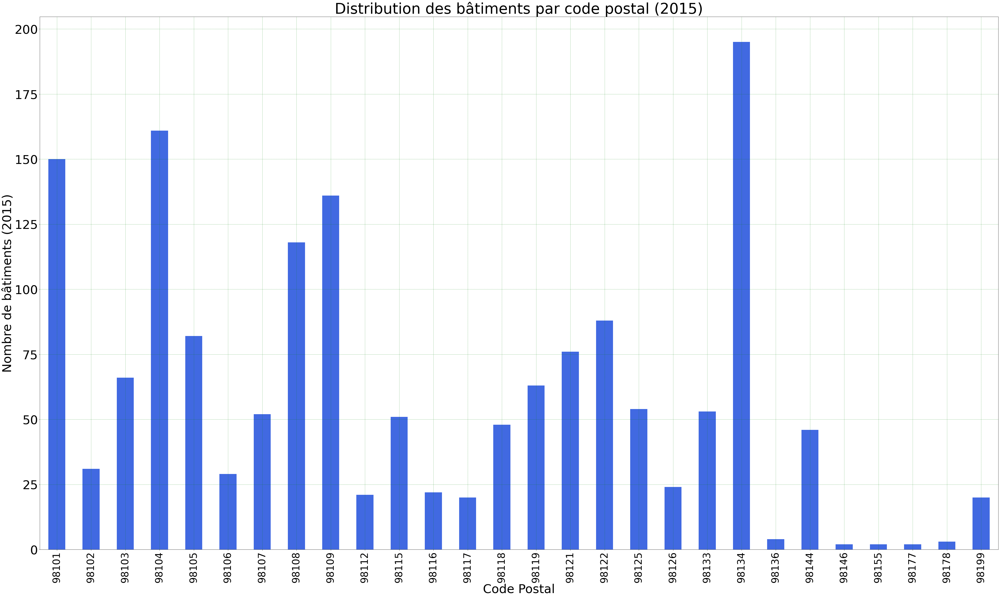

In [92]:
plt.figure(figsize=(70,40))

ZipCode_2015 = data1_2015.groupby(by='ZipCode')['OSEBuildingID'].nunique().plot(kind='bar', color='royalblue')

plt.title('Distribution des bâtiments par code postal (2015)', size=60)
plt.xlabel('Code Postal', size=50)
plt.ylabel('Nombre de bâtiments (2015)', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

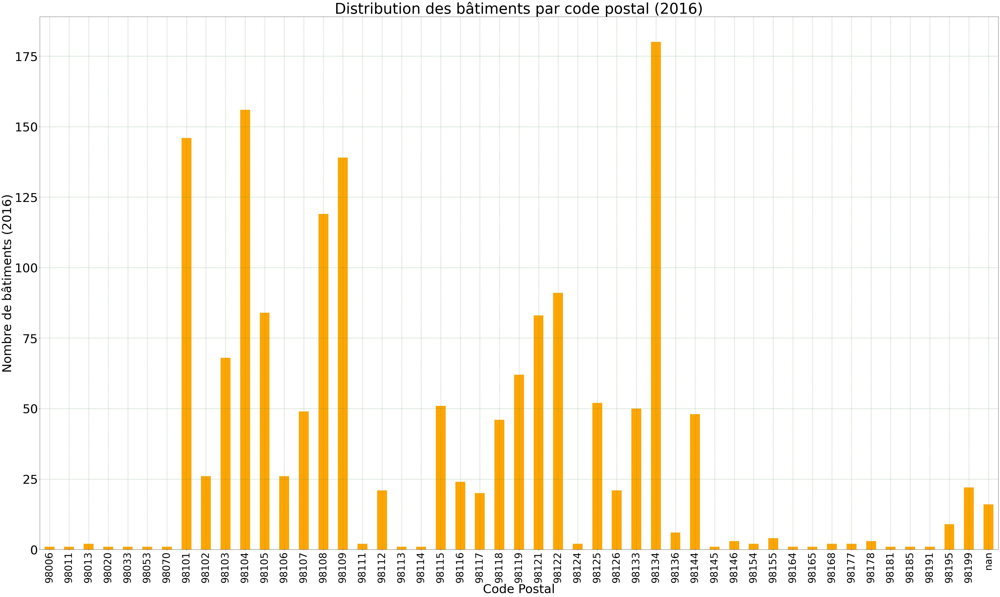

In [93]:
plt.figure(figsize=(70,40))

ZipCode_2016 = data1_2016New.groupby(by='ZipCode_New')['OSEBuildingID'].nunique().plot(kind='bar', color='orange')

plt.title('Distribution des bâtiments par code postal (2016)', size=60)
plt.xlabel('Code Postal', size=50)
plt.ylabel('Nombre de bâtiments (2016)', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#On voit clairement qu'en 2016 on a rajouté de nouveaux codes postales peut être correspondant à des nouvelles banlieues
#intégrées à la métropole de Seattle. Ceci implique que, si on fini par retenir cette variable pour notre modèle, de peut 
#être rester uniquement avec la zone centrale (ie. sans les banlieues) pour maintenir sa robustesse vu qu'on n'a que deux 
#ans.

#Voyons la distribution totale des ZipCodes sans doublons (ie. les deux années inclues et sans répéter les ID en doublons, 
#c'est à dire on considère une seule fois les ID qui conservent le même ZipCode les deux années):

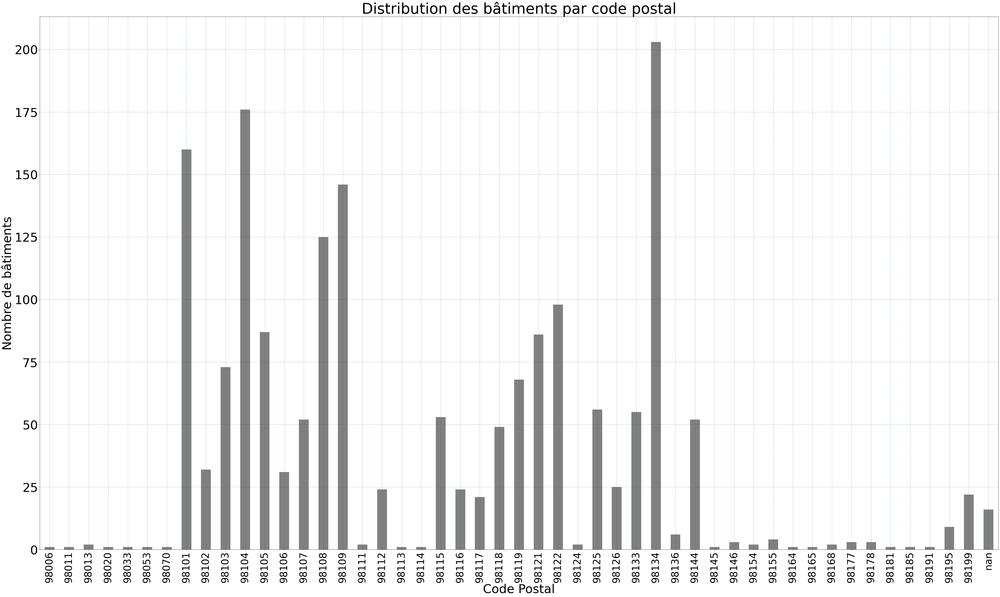

In [94]:
plt.figure(figsize=(70,40))

ZipCode = data1_New.groupby(by='ZipCode_New')['OSEBuildingID'].nunique().plot(kind='bar', color='gray')

plt.title('Distribution des bâtiments par code postal', size=60)
plt.xlabel('Code Postal', size=50)
plt.ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Voyons la distribution totale des ZipCodes (ie. avec doublons).

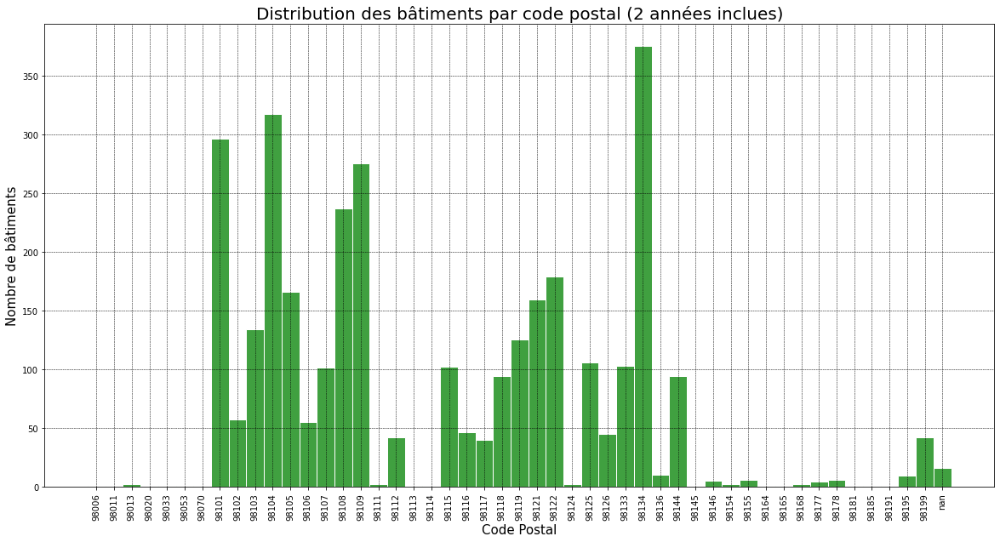

In [95]:
d1_New=data1_New.sort_values('ZipCode_New',ascending = True)

fig = plt.figure(figsize=(20,10))
ax = sns.histplot(data=d1_New, x='ZipCode_New', color='green', label='Total', edgecolor='white')
ax.set_xlabel('Code Postal',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par code postal (2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#Notez que la plupart des bâtiments se trouvent dans la zone centrale.

In [96]:
model = ols('YearBuilt ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,4.686953e+05,9972.239615,10.698742,3.455713e-71
Residual,3206.0,2.988295e+06,932.094630,NaN,NaN


In [97]:
model = ols('NumberofFloors ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,33949.321452,722.325988,21.330724,1.213999e-153
Residual,3198.0,108294.423465,33.863172,NaN,NaN


In [98]:
model = ols('ENERGYSTARScore ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,1.053243e+05,2240.942999,2.918099,2.438923e-10
Residual,2132.0,1.637261e+06,767.946080,NaN,NaN


In [99]:
model = ols('PropertyGFATotal ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,1.372669e+13,2.920571e+11,4.802669,3.870734e-24
Residual,3206.0,1.949614e+14,6.081142e+10,NaN,NaN


In [100]:
model = ols('SourceEUI_kBtu_sf ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,1.214037e+07,258305.838427,9.179908,6.008057e-59
Residual,3199.0,9.001402e+07,28138.173099,NaN,NaN


In [101]:
model = ols('TotalGHGEmissions ~ ZipCode_New', data=data1_New).fit()
anova_table = sm.stats.anova_lm(model)
anova_table

,df,sum_sq,mean_sq,F,PR(>F)
ZipCode_New,47.0,3.020937e+07,642752.487066,1.43341,0.028421
Residual,3199.0,1.434457e+09,448408.058493,NaN,NaN


In [ ]:
#En se basant sur les résultats des corrélations et ce quelles représentent en soit, on va donc retenir les 13 variables 
#suivantes: 

#0. Variable pour différentier les deux data sets:
    #- DataYear → Pour différentier nos deux années de data 2015 et 2016.

#1. Variables d'identification des bâtiments:
    #- OSEBuildingID → Pour identifier le bâtiment;
    #- TaxParcelIdentificationNumber → Pour identifier le bâtiment;
    #- PropertyName → Juste à titre informatif.

#2. Variables potentiellement explicatives du caractère éco-responsable:

  #2.1 propre aux bâtiments:
    #- *BuildingType → Pour identifier le Type d'immeuble et identifier le caractère;
    #- °YearBuilt → Pour essayer d'identifier des coïncidences entre le caractère éco-responsable des bâtiments et leur  
    #              année de construction.
    #- °NumberofFloors → Pour essayer d'identifier des coïncidences entre le caractère éco-responsable des bâtiments et  
    #                   leur nombre d'étages.
    #- °PropertyGFATotal → Pour essayer d'identifier des coïncidences entre le caractère éco-responsable des bâtiments et 
    #                     leur superficie Totale au sol.
    #- °ENERGYSTARScore → Variable à tester l'utilité.
    
  #2.2 propre aux zones où se trouvent les bâtiments:
    #- *Neighborhood → Pour essayer de trouver des coïncidences entre quartier 
    #                 (Il y a t-il des quartier aux bâtiments moins éco-responsables?)
    #- *ZipCode → Pour essayer de trouver des coïncidences entre quartier
    #                 (Il y a t-il des quartier aux bâtiments moins éco-responsables?)


#3. Variables cibles (2 variables qui mesurent le caractère éco-responsable des bâtiments):
    #- °SourceEUI(kBtu/sf) → Mesure de l'énergie totale dépensée par le bâtiment.
    #- °TotalGHGEmissions → Mesure du carbone total émis par le bâtiment.
    
        #Note: On ne prends pas 'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)' et 'NaturalGas(kBtu)' car déjà
        #celles en kWh et kBtu disent la même choses ce qui change est l'unité; mais aussi car en quelque sorte
        # l'électricité et le gaz naturel dépensés  sont inclus dans le SourceEUI (ie. dans l’énergie totale dépensée par le 
        #bâtiment). Même chose pour 'SteamUse(kBtu)', il est déjà inclu dans le SourceEUI.
        

            #NOTE: Les variables avec un '°' au début sont des variables quantitatives. Les variables avec '*' au début sont 
            #des variables qualitatives. Les variables sans rien sont juste des variables à titre informatif (qui ne sont
            #pas a considérer en tant que telles dans nos modèles, mais servent juste à identifier de quel bâtiment il 
            #s'agit).
    
#ATTENTION: Toutes les autres variables ne sont pas intéressantes: 
#- 'GHGEmissionsIntensity' -> est inclus en quelque sorte dans 'TotalGHGEmissions'.
#- 'SiteEnergyUse(kBtu)', 'SiteEUI(kBtu/sf)' -> ne considèrent pas la totalité du combustible brut, on préfère donc les 
#   données 'Source'.
#- 'PropertyGFAParking','PropertyGFABuilding(s)','LargestPropertyUseTypeGFA','SecondLargestPropertyUseTypeGFA' et 
#  'ThirdLargestPropertyUseTypeGFA' -> sont en gros inclus dans 'PropertyGFATotal'.
#- 'NumberofBuildings' -> la surface au sol et les étages sont plus adaptés.


#------------------------------
#C.6 Analyse des variables choisies.

In [102]:
data2=data1_New.loc[:,['DataYear','OSEBuildingID','TaxParcelIdentificationNumber','PropertyName','BuildingType','YearBuilt','NumberofFloors','PropertyGFATotal','ENERGYSTARScore','SourceEUI_kBtu_sf','TotalGHGEmissions','Neighborhood','ZipCode_New']]

In [ ]:
#Pourcentage de données non manquantes.

In [103]:
(100*(len(data2)-data2.isna().sum()))/len(data2)

DataYear                         100.000000
OSEBuildingID                    100.000000
TaxParcelIdentificationNumber     99.969419
PropertyName                     100.000000
BuildingType                     100.000000
YearBuilt                        100.000000
NumberofFloors                    99.755352
PropertyGFATotal                 100.000000
ENERGYSTARScore                   66.513761
SourceEUI_kBtu_sf                 99.785933
TotalGHGEmissions                 99.785933
Neighborhood                     100.000000
ZipCode_New                      100.000000
dtype: float64

In [ ]:
#Notez que nos deux variable cibles: 'SourceEUI(kBtu/sf)' et 'TotalGHGEmissions' ont des lignes manquantes, qu'on devra 
#éliminer car il s'agit de nos variables cibles. Mais ca ne représente que moins de 0.3% des lignes.

#Notez aussi que les variables 'TaxParcelIdentificationNumber' et 'NumberofFloors' ont aussi quelque lignes manquantes mais
#qui encore une fois représentent au plus 0.3%. Ceci uni au fait qu'il ne s'agit pas de nos variables cibles mais de
#variables d'identification ou des variables explicatives il n'y a pas là un soucis.

#Finalement notez que la variable 'ENERGYSTARScore' a près de 33.5% des lignes non renseignées, première faiblesse de
#cette variable.


#C.6.1 Élimination des lignes manquantes des variables cibles ('SourceEUI(kBtu/sf)' et 'TotalGHGEmissions'):

In [104]:
data2.isna().sum()

DataYear                            0
OSEBuildingID                       0
TaxParcelIdentificationNumber       1
PropertyName                        0
BuildingType                        0
YearBuilt                           0
NumberofFloors                      8
PropertyGFATotal                    0
ENERGYSTARScore                  1095
SourceEUI_kBtu_sf                   7
TotalGHGEmissions                   7
Neighborhood                        0
ZipCode_New                         0
dtype: int64

In [105]:
data2.count()

DataYear                         3270
OSEBuildingID                    3270
TaxParcelIdentificationNumber    3269
PropertyName                     3270
BuildingType                     3270
YearBuilt                        3270
NumberofFloors                   3262
PropertyGFATotal                 3270
ENERGYSTARScore                  2175
SourceEUI_kBtu_sf                3263
TotalGHGEmissions                3263
Neighborhood                     3270
ZipCode_New                      3270
dtype: int64

In [106]:
data2=data2.dropna(subset=['SourceEUI_kBtu_sf','TotalGHGEmissions'])

In [107]:
data2.shape

(3263, 13)

In [108]:
data2.count()

DataYear                         3263
OSEBuildingID                    3263
TaxParcelIdentificationNumber    3262
PropertyName                     3263
BuildingType                     3263
YearBuilt                        3263
NumberofFloors                   3255
PropertyGFATotal                 3263
ENERGYSTARScore                  2175
SourceEUI_kBtu_sf                3263
TotalGHGEmissions                3263
Neighborhood                     3263
ZipCode_New                      3263
dtype: int64

In [ ]:
#On a un total de 3263 bâtiments entre 2015 et 2016 (en incluant les doublons, c'est à dire les bâtiments déjà présents en
#2015 et présent aussi en 2016). Notez qu'on a des NaN pour les 'NumberofFloors' (ie. 8 NaN), pour les 
#'TaxParcelIdentificationNumber' (ie. 1 NaN), et pour les 'ENERGYSTARScore' (ie. 1088 NaN).

#Data traitée que pour 2015:

In [109]:
data2_2015=data2.loc[data2['DataYear']==2015]
data2_2015.shape

(1614, 13)

In [110]:
data2_2015.count()

DataYear                         1614
OSEBuildingID                    1614
TaxParcelIdentificationNumber    1613
PropertyName                     1614
BuildingType                     1614
YearBuilt                        1614
NumberofFloors                   1606
PropertyGFATotal                 1614
ENERGYSTARScore                  1092
SourceEUI_kBtu_sf                1614
TotalGHGEmissions                1614
Neighborhood                     1614
ZipCode_New                      1614
dtype: int64

In [ ]:
#On a un total de 1614 bâtiments en 2015. Notez qu'on a des NaN pour les 'NumberofFloors' (ie. 8 NaN), pour les 
#'TaxParcelIdentificationNumber' (ie. 1 NaN), et pour les 'ENERGYSTARScore' (ie. 522 NaN).

#Data traitée que pour 2016:

In [111]:
data2_2016=data2.loc[data2['DataYear']==2016]
data2_2016.shape

(1649, 13)

In [112]:
data2_2016.count()

DataYear                         1649
OSEBuildingID                    1649
TaxParcelIdentificationNumber    1649
PropertyName                     1649
BuildingType                     1649
YearBuilt                        1649
NumberofFloors                   1649
PropertyGFATotal                 1649
ENERGYSTARScore                  1083
SourceEUI_kBtu_sf                1649
TotalGHGEmissions                1649
Neighborhood                     1649
ZipCode_New                      1649
dtype: int64

In [ ]:
#On a un total de 1649 bâtiments en 2016. Notez qu'on a des NaN pour les 'ENERGYSTARScore' (ie. 566 NaN).


#Notez qu'on a 32 lignes en plus en 2016 et donc potentiellement plus de bâtiments, soit des nouveaux 
#bâtiments. Regardons s'il s'agit de nouveaux bâtiments, ou bien de lignes supprimées dans une des deux années, soit par
#présence d'outliers, soit par absence de valeurs pour les ou l'une des variables cibles 'SourceEUI(kBtu/sf)' et 
#'TotalGHGEmissions'.

#Notez aussi que:
# - en 2015 on a des 'NaN' dans les variables: 'TaxParcelIdentificationNumber', 'NumberofFloors' et 'ENERGYSTARScore';
# - en 2016 on a des 'NaN' dans la variable: 'ENERGYSTARScore'.



#C.5.2 Analyse individuelle des variables quantitative retenues auparavant.

#(Ceci car las qualitatives on les a déjà analysées lors du calcul de l'ANOVA)
#Note: 'DataYear', 'TaxParcelIdentificationNumber' et 'PropertyName' on ne le analysera car on les garde juste à titre 
#informatif afin de pouvoir identifier les bâtiment et l'année de provenance des données.

#C.5.2.1 OSEBuildingID'

In [113]:
Bulding_ID=data2.groupby(by='OSEBuildingID')['DataYear'].count()
Bulding_ID

OSEBuildingID
1        2
2        2
3        2
5        1
8        2
        ..
50222    1
50223    1
50224    1
50225    1
50226    1
Name: DataYear, Length: 1688, dtype: int64

In [ ]:
#Notez que on a 1688 BuldingID non répétés, soit 3376 lignes si tous les BuldingID étaient répétés 2 fois et donc dans le 
#2 années. 

#Cas du OSEBuildingID=5.

In [114]:
a=df_2015.loc[df_2015['OSEBuildingID']==5]
a

,Address,BuildingType,City,Comments,ComplianceStatus,CouncilDistrictCode,DataYear,DefaultData,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,ListOfAllPropertyUseTypes,Longitude,NaturalGas(kBtu),NaturalGas(therms),Neighborhood,NumberofBuildings,NumberofFloors,OSEBuildingID,Outlier,PrimaryPropertyType,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,PropertyName,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),State,SteamUse(kBtu),TaxParcelIdentificationNumber,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,YearsENERGYSTARCertified,ZipCode
3,620 STEWART ST,NonResidential,SEATTLE,NaN,Compliant,7,2015,No,1.0,2769023.0,811521.0,31.38,Hotel,61320.0,47.61421585,Hotel,-122.33660889,2001894.0,20019.0,DOWNTOWN,1.0,10.0,5,High Outlier,Hotel,61320,0,61320,HOTEL MAX,NaN,NaN,460.4,462.5,28229320.0,28363444.0,636.3,643.2,WA,23458518.0,659000640,NaN,NaN,1936.34,1926,NaN,98101


In [115]:
b=df_2016.loc[df_2016['OSEBuildingID']==5]
b

,Address,BuildingType,City,Comments,ComplianceStatus,CouncilDistrictCode,DataYear,DefaultData,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,ListOfAllPropertyUseTypes,Longitude,NaturalGas(kBtu),NaturalGas(therms),Neighborhood,NumberofBuildings,NumberofFloors,OSEBuildingID,Outlier,PrimaryPropertyType,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,PropertyName,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),State,SteamUse(kBtu),TaxParcelIdentificationNumber,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,YearsENERGYSTARCertified,ZipCode
3,620 STEWART ST,NonResidential,Seattle,nan,Compliant,7,2016,False,56.0,2768924.0,811525.3125,4.67,Hotel,61320.0,47.61412,Hotel,-122.33664,1811213.0,18112.13086,DOWNTOWN,1.0,10.0,5,NaN,Hotel,61320,0,61320,HOTEL MAX,NaN,NaN,110.800003,113.300003,6794584.0,6946800.5,216.199997,224.0,WA,2214446.25,0659000640,NaN,NaN,286.43,1926,NaN,98101.0


In [ ]:
#Cas du OSEBuildingID=50226.

In [116]:
a=df_2015.loc[df_2015['OSEBuildingID']==50226]
a

,Address,BuildingType,City,Comments,ComplianceStatus,CouncilDistrictCode,DataYear,DefaultData,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,ListOfAllPropertyUseTypes,Longitude,NaturalGas(kBtu),NaturalGas(therms),Neighborhood,NumberofBuildings,NumberofFloors,OSEBuildingID,Outlier,PrimaryPropertyType,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,PropertyName,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),State,SteamUse(kBtu),TaxParcelIdentificationNumber,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,YearsENERGYSTARCertified,ZipCode


In [117]:
b=df_2016.loc[df_2016['OSEBuildingID']==50226]
b

,Address,BuildingType,City,Comments,ComplianceStatus,CouncilDistrictCode,DataYear,DefaultData,ENERGYSTARScore,Electricity(kBtu),Electricity(kWh),GHGEmissionsIntensity,LargestPropertyUseType,LargestPropertyUseTypeGFA,Latitude,ListOfAllPropertyUseTypes,Longitude,NaturalGas(kBtu),NaturalGas(therms),Neighborhood,NumberofBuildings,NumberofFloors,OSEBuildingID,Outlier,PrimaryPropertyType,PropertyGFABuilding(s),PropertyGFAParking,PropertyGFATotal,PropertyName,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),State,SteamUse(kBtu),TaxParcelIdentificationNumber,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,TotalGHGEmissions,YearBuilt,YearsENERGYSTARCertified,ZipCode
3375,2820 S Myrtle St,Nonresidential COS,Seattle,nan,Compliant,2,2016,False,NaN,432554.2475,126774.3984,2.26,Other - Recreation,8271.0,47.53939,"Fitness Center/Health Club/Gym, Food Service, Office, Other - Recreation, Pre-school/Daycare",-122.29536,720341.9922,7203.419922,GREATER DUWAMISH,1.0,1.0,50226,NaN,Mixed Use Property,18258,0,18258,Van Asselt Community Center,Fitness Center/Health Club/Gym,8000.0,63.099998,70.900002,1152896.25,1293722.375,115.800003,123.900002,WA,0.0,7857002030,Pre-school/Daycare,1108.0,41.27,1938,NaN,nan


In [ ]:
#Si on avait les mêmes buildings dans les 2 années, on devrait avoir 2 pour tous le OSEBuildingID, mais ce n'est pas le cas
#et on s'y attendait.

    #Il y en a certain comme le bâtiment ayant le OSEBuildingID "5" qui avaient des outliers pour une année (comme ici le 
    #n°5 qui avait des outliers pour 2015) et qui donc on vu la ligne supprimée.
    #Il y en a d'autres comme le bâtiment ayant le OSEBuildingID "50226" qui n'existaient pas encore dans la base de données
    #de 2015.
    
    
#C.5.2.3 YearBuilt.

In [118]:
data2['YearBuilt'].describe()

count    3263.000000
mean     1961.722954
std        32.617131
min      1900.000000
25%      1930.000000
50%      1965.000000
75%      1989.000000
max      2015.000000
Name: YearBuilt, dtype: float64

In [ ]:
#D'abord en distinguant les 2 années:

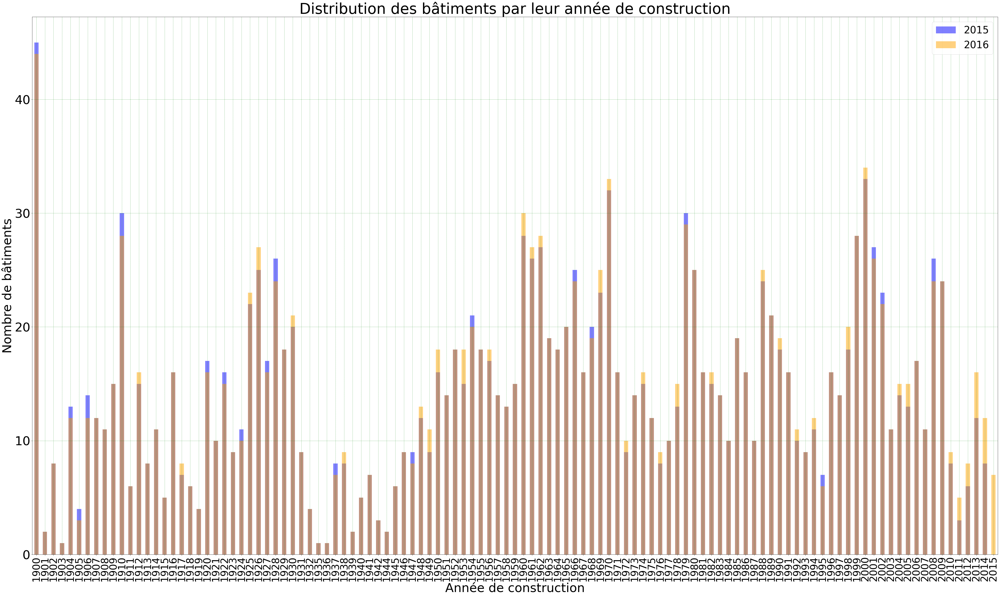

In [119]:
YearBuilt_2015 = data2_2015.groupby(by='YearBuilt')['OSEBuildingID'].nunique()
YearBuilt_2016 = data2_2016.groupby(by='YearBuilt')['OSEBuildingID'].nunique()

plt.figure(figsize=(70,40));
YearBuilt_2015.plot(kind='bar', color='blue', alpha=0.5, label='2015')
YearBuilt_2016.plot(kind='bar', color='orange', alpha=0.5, label='2016')

plt.title('Distribution des bâtiments par leur année de construction', size=60)
plt.xlabel('Année de construction', size=50)
plt.ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.legend(loc='upper right', prop={'size': 40})
plt.show()

In [ ]:
#Notez que en 2016 le nombre de bâtiments pris en compte a augmenté non seulement par la présence de plus de bâtiments 
#construit en 2015 mais aussi par l'introduction de nouveaux bâtiments plus vieux.

#Afin d'avoir une vision plus claire, on pourrait regrouper par plusieurs années de construction.

#On va de 1900 a 2015 pour nos deux data set soit 115 ans, et des distributions, qui n'ont pas une allure de distributions 
#normales, ce qui fait qu'on ne peux pas utilisé des critères comme celui la règle de Sturge pour faire les des 
#regroupements successifs. Du coup on devra se limiter a utiliser la méthode manuelle: 115 es multiple uniquement de 5 et de 
#23: (23*5=115). Prendre des intervalles de 23 années lisserait trop les effets (il suffit de voir les comment les courbes 
#sont distribuées), 5 ans semble plus approprié en regardant si on voit graphiquement les paquets que ceci ferait. On prend 
#donc des groupes de 5 ans.

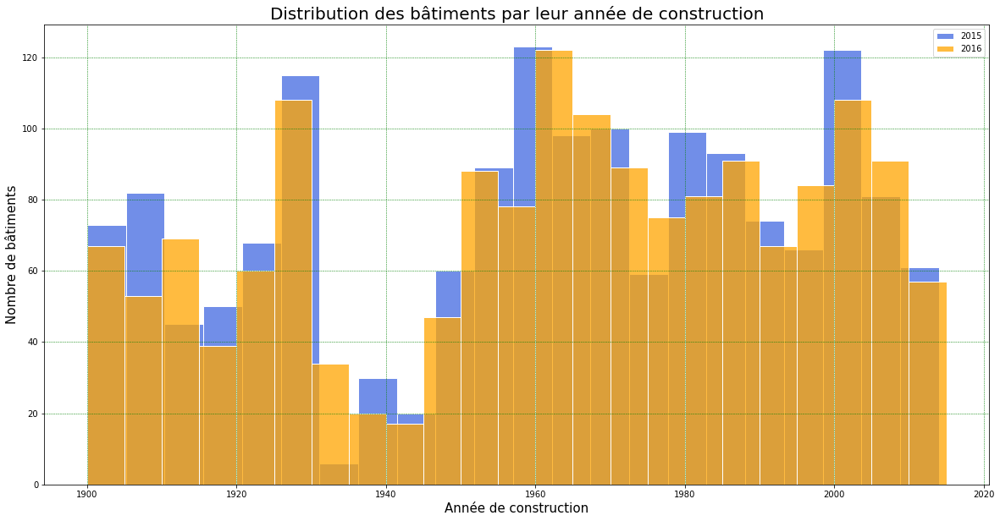

In [120]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='YearBuilt', bins=int((data2_2015.YearBuilt.max() - data2_2015.YearBuilt.min())/5), color='royalblue', label='2015', edgecolor='white' )
ax = sns.histplot(data=data2_2016, x='YearBuilt', bins=int((data2_2016.YearBuilt.max() - data2_2016.YearBuilt.min())/5), color='orange', label='2016', edgecolor='white')
ax.set_xlabel('Année de construction',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur année de construction',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Suite à ce regroupement on apprécie mieux la baisse de constructions entre 1935 et 1945, dans les 2 data set; puis, une
#augmentation des bâtiments construits entre 2000 et 2015.
#Note: Les années où le mauve surpasse, correspondent à des bâtiments présents en 2015 et dont les lignes furent effacées
#en 2016 à cause de présence d'outliers.

#Maintenant pour les deux années ensembles et en regroupant par 5 années consécutives:

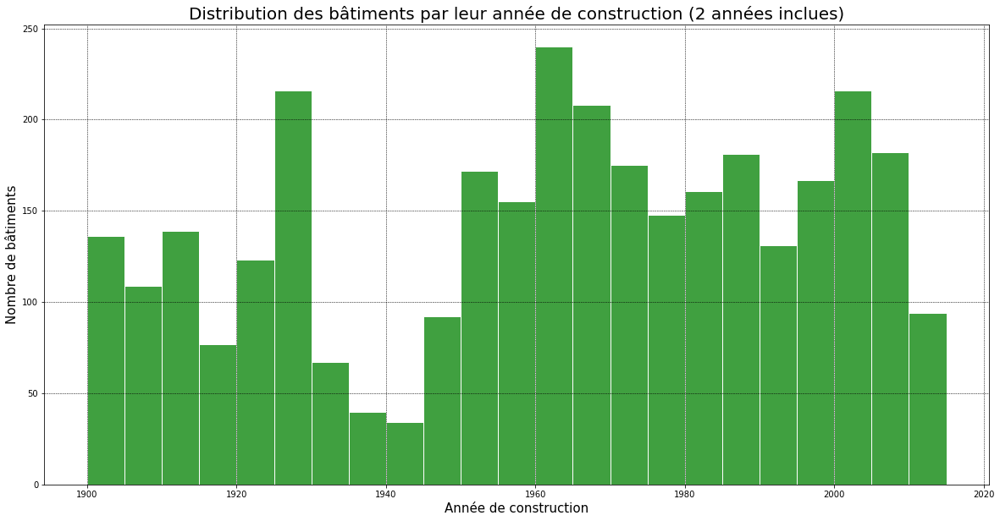

In [121]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2, x='YearBuilt', bins=int((data2.YearBuilt.max() - data2.YearBuilt.min())/5), color='green', label='Total', edgecolor='white' )
ax.set_xlabel('Année de construction',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur année de construction (2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()


In [ ]:
#C.5.2.4 NumberofFloors.

In [122]:
data2['NumberofFloors'].describe()

count    3255.000000
mean        4.144700
std         6.614293
min         0.000000
25%         1.000000
50%         2.000000
75%         4.000000
max        99.000000
Name: NumberofFloors, dtype: float64

In [123]:
NumberofFloors_2015 = data2_2015.groupby(by='NumberofFloors')['OSEBuildingID'].nunique()
NumberofFloors_2015

NumberofFloors
0.0       5
1.0     441
2.0     389
3.0     262
4.0     145
5.0     100
6.0      81
7.0      31
8.0      21
9.0       8
10.0     16
11.0     18
12.0      7
13.0      5
14.0      8
15.0      7
16.0      3
17.0      4
18.0      3
19.0      5
20.0      3
21.0      3
22.0      3
23.0      2
24.0      3
25.0      3
27.0      1
28.0      1
29.0      3
30.0      1
33.0      3
34.0      2
36.0      2
37.0      1
39.0      1
41.0      2
42.0      5
46.0      1
47.0      1
49.0      1
55.0      1
56.0      1
63.0      1
76.0      1
99.0      1
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez que en 2015 la plus grande partie des bâtiments ont entre 1 et 7 étages: 2931 sur 3248, c'est à dire: 90,24% en gros.

In [124]:
NumberofFloors_2016 = data2_2016.groupby(by='NumberofFloors')['OSEBuildingID'].nunique()
NumberofFloors_2016

NumberofFloors
0.0      16
1.0     461
2.0     385
3.0     265
4.0     144
5.0     102
6.0      83
7.0      33
8.0      22
9.0       8
10.0     18
11.0     18
12.0      9
13.0      7
14.0      9
15.0      6
16.0      3
17.0      4
18.0      3
19.0      5
20.0      3
21.0      3
22.0      3
23.0      3
24.0      3
25.0      3
27.0      1
28.0      1
29.0      3
30.0      1
33.0      3
34.0      2
36.0      2
37.0      1
39.0      1
41.0      2
42.0      5
46.0      1
47.0      1
49.0      1
55.0      1
56.0      1
63.0      1
76.0      1
99.0      1
Name: OSEBuildingID, dtype: int64

In [ ]:
#Notez que en 2016 aussi la plus grande partie des bâtiments ont entre 1 et 7 étages: 2999 sur 3335, c'est à dire: 89,93% en
#gros.

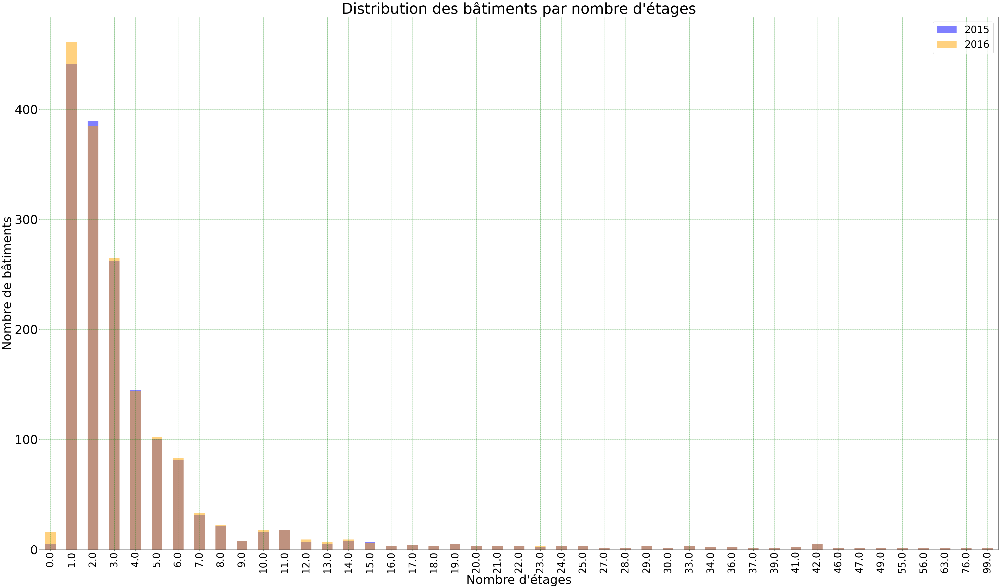

In [125]:
plt.figure(figsize=(70,40))
NumberofFloors_2015.plot(kind='bar', color='blue', alpha=0.5, label='2015')
NumberofFloors_2016.plot(kind='bar', color='orange', alpha=0.5, label='2016')

plt.title("Distribution des bâtiments par nombre d'étages", size=60)
plt.xlabel("Nombre d'étages", size=50)
plt.ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.legend(loc='upper right', prop={'size': 40})
plt.show()

In [ ]:
#Notez que les distributions sont semblables pour les 2 années, et que le nombre de bâtiments par nombre d'étages (tout 
#étage compris sauf pour 2 étages) est supérieur en 2016. Encore une fois ce qui se passe avec les 2 étages, c'est que 
#on a certains bâtiments présents en 2015 et avec des outliers en 2016 qui du coup furent éliminés.

#Notez aussi que les valeurs de cette variable sont très étendues. Néanmoins, même s'il pourrait sembler intéressant de lui 
#appliquer le logarithme afin de rapprocher des valeurs extrêmes pour obtenir un graph de distribution moins étendu, vu que
#la valeur minimale prise par cette variable est '0', on ne peut pas le faire directement. En fait log(0)~-inf et donc ça 
#n'aurait pas de sens. Mais on peut faire log(x+1).

In [126]:
data2_2015['NumberofFloors_log']=np.log(data2_2015['NumberofFloors']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/410832671.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2015['NumberofFloors_log']=np.log(data2_2015['NumberofFloors']+1)


In [127]:
data2_2016['NumberofFloors_log']=np.log(data2_2016['NumberofFloors']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/2863189861.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2016['NumberofFloors_log']=np.log(data2_2016['NumberofFloors']+1)


In [128]:
data2['NumberofFloors_log']=np.log(data2['NumberofFloors']+1)

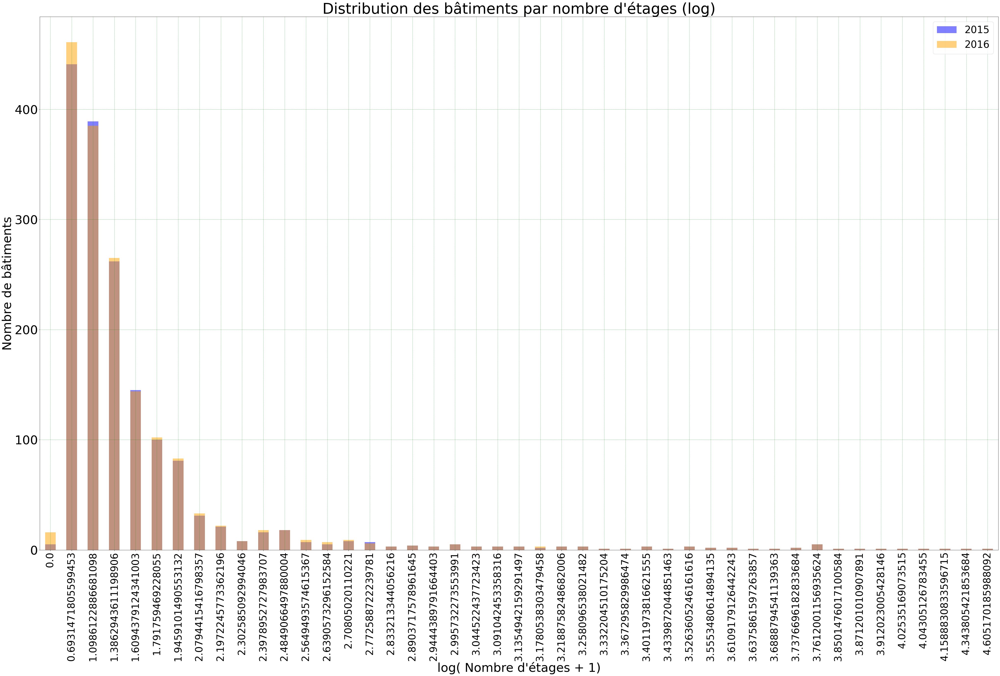

In [129]:
NumberofFloors_2015_log = data2_2015.groupby(by='NumberofFloors_log')['OSEBuildingID'].nunique()
NumberofFloors_2016_log = data2_2016.groupby(by='NumberofFloors_log')['OSEBuildingID'].nunique()

plt.figure(figsize=(70,40))
NumberofFloors_2015_log.plot(kind='bar', color='blue', alpha=0.5, label='2015')
NumberofFloors_2016_log.plot(kind='bar', color='orange', alpha=0.5, label='2016')

plt.title("Distribution des bâtiments par nombre d'étages (log)", size=60)
plt.xlabel("log( Nombre d'étages + 1)", size=50)
plt.ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=40, rotation=90)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.legend(loc='upper right', prop={'size': 40})
plt.show()


In [ ]:
#Notez que la distribution n'évolue pas vraiment avec la transformation logarithmique. 

#Maintenant pour les deux années ensembles (sans log):

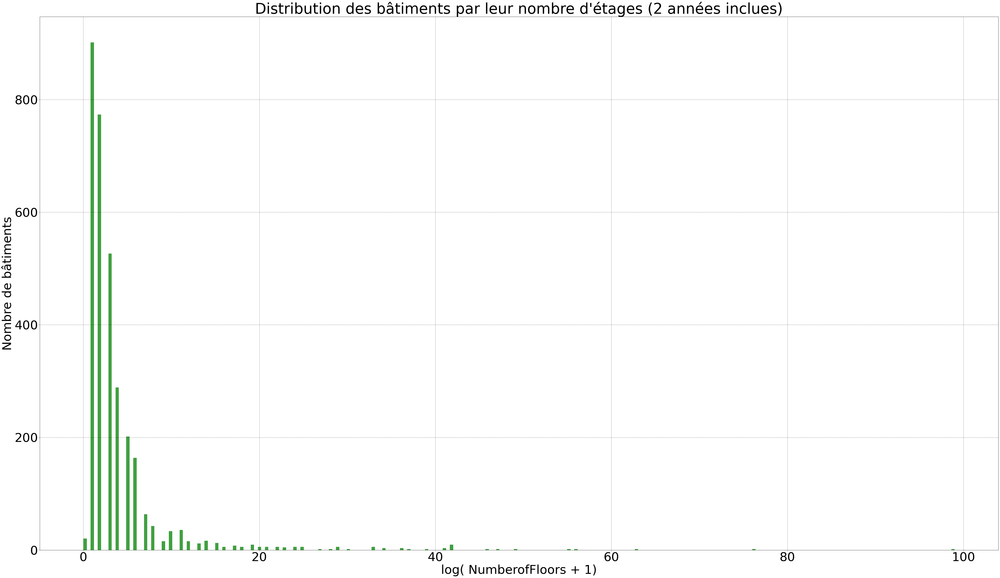

In [130]:
fig = plt.figure(figsize=(70,40))

ax = sns.histplot(data=data2, x='NumberofFloors', color='green', label='Total', edgecolor='white' )
ax.set_xlabel('log( NumberofFloors + 1)',size=50)
ax.set_ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=50)
plt.title("Distribution des bâtiments par leur nombre d'étages (2 années inclues)",  size=60)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Et pour les deux années ensembles avec log:

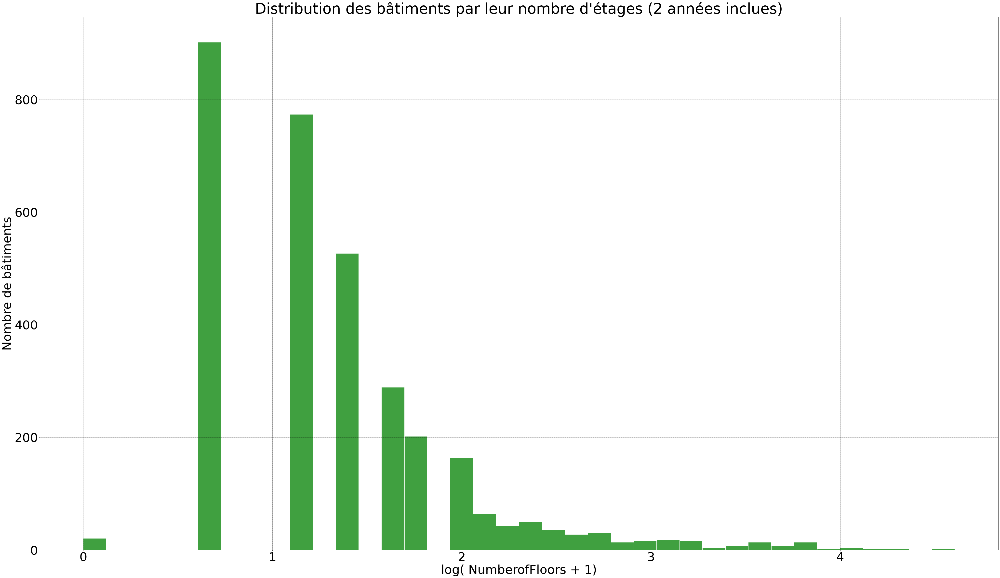

In [131]:
fig = plt.figure(figsize=(70,40))

ax = sns.histplot(data=data2, x='NumberofFloors_log', color='green', label='Total', edgecolor='white' )
ax.set_xlabel('log( NumberofFloors + 1)',size=50)
ax.set_ylabel('Nombre de bâtiments', size=50)
plt.yticks(size=50)
plt.xticks(size=50)
plt.title("Distribution des bâtiments par leur nombre d'étages (2 années inclues)",  size=60)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
##C.5.2.5  PropertyGFATotal.

In [132]:
data2['PropertyGFATotal'].describe()

count    3.263000e+03
mean     1.163951e+05
std      2.530094e+05
min      1.128500e+04
25%      2.951650e+04
50%      4.925200e+04
75%      1.048430e+05
max      9.320156e+06
Name: PropertyGFATotal, dtype: float64

In [133]:
data2_2015['PropertyGFATotal'].describe()

count    1.614000e+03
mean     1.131469e+05
std      1.952496e+05
min      2.000000e+04
25%      2.951225e+04
50%      4.915000e+04
75%      1.040742e+05
max      2.200000e+06
Name: PropertyGFATotal, dtype: float64

In [134]:
data2_2016['PropertyGFATotal'].describe()

count    1.649000e+03
mean     1.195743e+05
std      2.989541e+05
min      1.128500e+04
25%      2.952500e+04
50%      4.974400e+04
75%      1.060410e+05
max      9.320156e+06
Name: PropertyGFATotal, dtype: float64

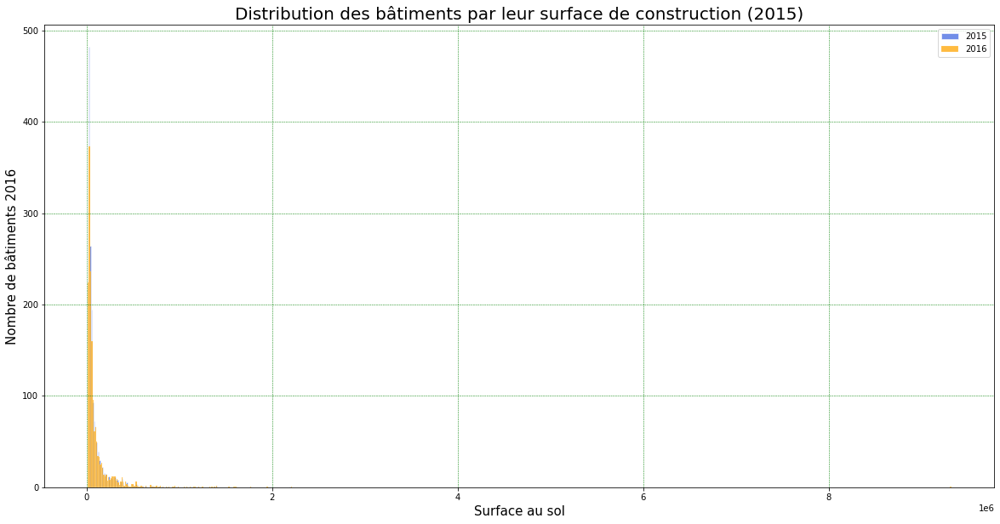

In [135]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='PropertyGFATotal', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='PropertyGFATotal', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('Surface au sol',size=15)
ax.set_ylabel('Nombre de bâtiments 2016', size=15)
plt.title('Distribution des bâtiments par leur surface de construction (2015)',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

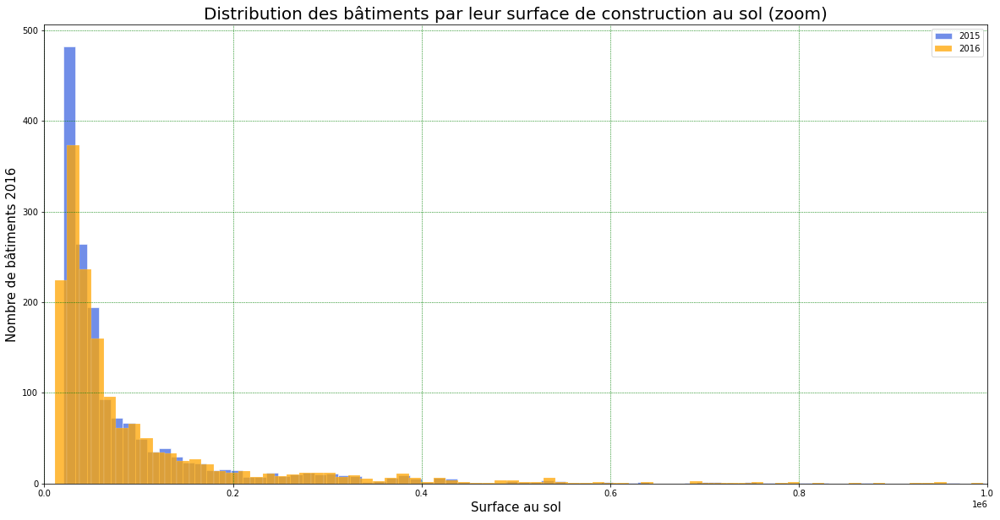

In [136]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='PropertyGFATotal', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='PropertyGFATotal', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('Surface au sol',size=15)
ax.set_ylabel('Nombre de bâtiments 2016', size=15)
plt.title('Distribution des bâtiments par leur surface de construction au sol (zoom)',  size=20)
plt.legend()
plt.xlim(0,1e6)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez que le nombre de bâtiments par aire au sol est assez stable entre 2015 et 2016, on a juste un peu plus dans chaque
#catégorie en 2016 car on a plus de bâtiment cette année, mais pas de surprises avec 2015, quand cette année domine c'est
#lié au bâtiment présents en 2015 mais qui furent éliminés en 2016 dû à la présence d'outliers.

#Pour mieux visualiser, il pourrait être intéressant de voir la distribution des bâtiment par 'tranches' (ie. groupes) 
#définies de surfaces au sol, par exemple chaque 0.1e6 m^2:

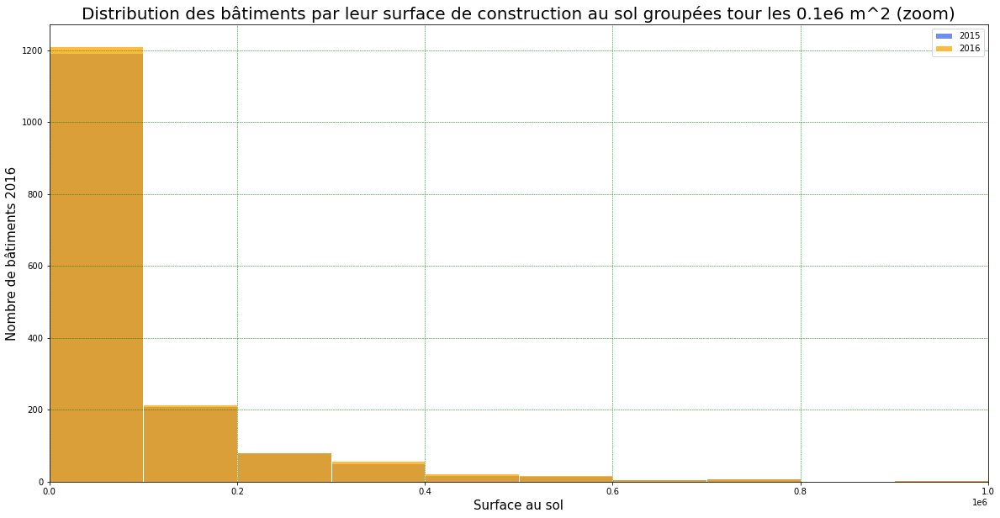

In [137]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='PropertyGFATotal', bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6], color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='PropertyGFATotal', bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6], color='orange', label='2016', edgecolor='white')
ax.set_xlabel('Surface au sol',size=15)
ax.set_ylabel('Nombre de bâtiments 2016', size=15)
plt.title('Distribution des bâtiments par leur surface de construction au sol groupées tour les 0.1e6 m^2 (zoom)',  size=20)
plt.legend()
plt.xlim(0,1e6)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Si il en résulte que cette variable a un lien intéressant avec nos variables cibles il serait peut être intéressant de 
#lui appliquer le logarithme afin de rapprocher des valeurs extrêmes pour obtenir un graph de distribution moins étendu.

In [138]:
data2_2015['PropertyGFATotal_log']=np.log(data2_2015['PropertyGFATotal'])

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/2434777894.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2015['PropertyGFATotal_log']=np.log(data2_2015['PropertyGFATotal'])


In [139]:
data2_2016['PropertyGFATotal_log']=np.log(data2_2016['PropertyGFATotal'])

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/374258477.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2016['PropertyGFATotal_log']=np.log(data2_2016['PropertyGFATotal'])


In [140]:
data2['PropertyGFATotal_log']=np.log(data2['PropertyGFATotal'])

In [ ]:
#Distribution générale une fois qu'on a appliqué le logarithme:

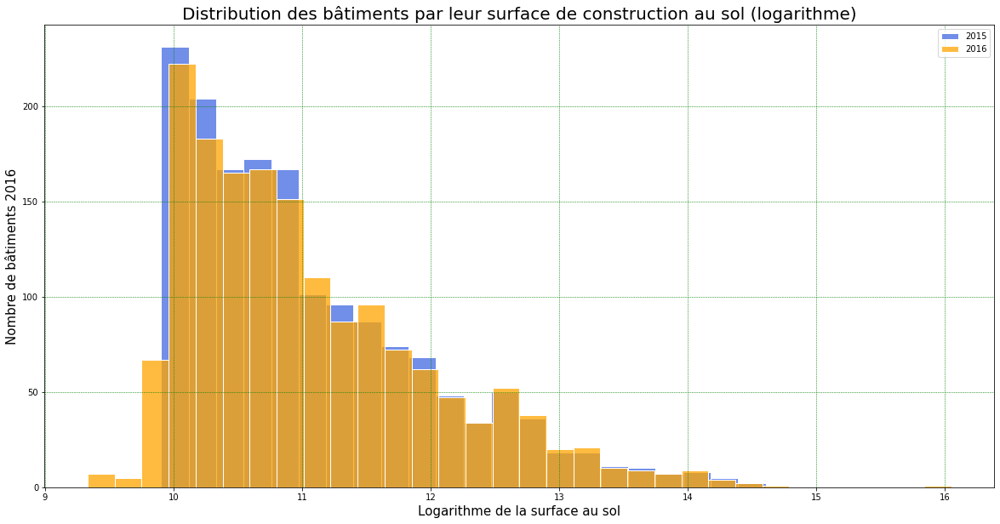

In [141]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='PropertyGFATotal_log', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='PropertyGFATotal_log', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('Logarithme de la surface au sol',size=15)
ax.set_ylabel('Nombre de bâtiments 2016', size=15)
plt.title('Distribution des bâtiments par leur surface de construction au sol (logarithme)',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Maintenant pour les deux années ensemble:

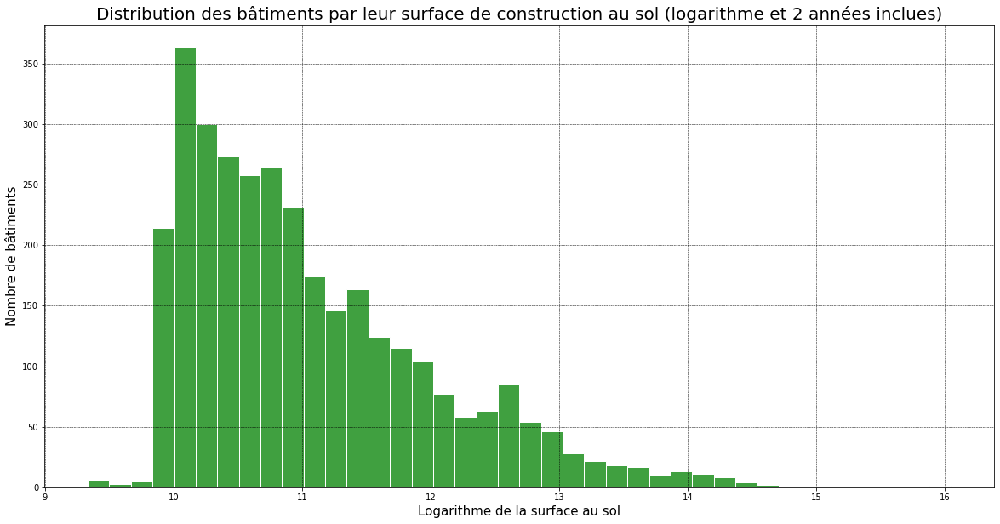

In [142]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2, x='PropertyGFATotal_log', color='green', label='Total', edgecolor='white' )
ax.set_xlabel('Logarithme de la surface au sol',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur surface de construction au sol (logarithme et 2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Il me semble plus intéressant, car plus parlant de traiter cette variable par 'bins' et de ne pas utiliser la 
#transformation logarithmique.

#Maintenant on cherche à voir le lien entre ses variables et les variables cibles: 'SourceEUI(kBtu/sf)', 'TotalGHGEmissions'
#Ceci dans le but de voir déjà si les variables cibles sont pertinentes et après si les autres variables permettent de 
#prédire des comportements des variables cibles.

#------------------------------

#C.6 Analyse de la variable cible 'SourceEUI_kBtu_sf'

In [143]:
data2['SourceEUI_kBtu_sf'].describe()

count    3263.000000
mean      174.282930
std       177.489452
min         0.000000
25%        77.249998
50%       131.600006
75%       204.250003
max      2620.000000
Name: SourceEUI_kBtu_sf, dtype: float64

In [144]:
b=data2.loc[data2['SourceEUI_kBtu_sf']==0]
b.count()

DataYear                         20
OSEBuildingID                    20
TaxParcelIdentificationNumber    20
PropertyName                     20
BuildingType                     20
YearBuilt                        20
NumberofFloors                   20
PropertyGFATotal                 20
ENERGYSTARScore                   2
SourceEUI_kBtu_sf                20
TotalGHGEmissions                20
Neighborhood                     20
ZipCode_New                      20
NumberofFloors_log               20
PropertyGFATotal_log             20
dtype: int64

In [ ]:
#Notez que l'on a 26 bâtiments dont le dépense moyenne totale d'énergie est nulle.

In [145]:
data2_2015['SourceEUI_kBtu_sf'].describe()

count    1614.000000
mean      172.172181
std       170.254453
min         0.000000
25%        76.625000
50%       131.750000
75%       204.200000
max      2511.100000
Name: SourceEUI_kBtu_sf, dtype: float64

In [146]:
data2_2016['SourceEUI_kBtu_sf'].describe()

count    1649.000000
mean      176.348878
std       184.324391
min         0.000000
25%        77.800003
50%       131.500000
75%       204.100006
max      2620.000000
Name: SourceEUI_kBtu_sf, dtype: float64

In [ ]:
#Voyons la forme de la distribution.

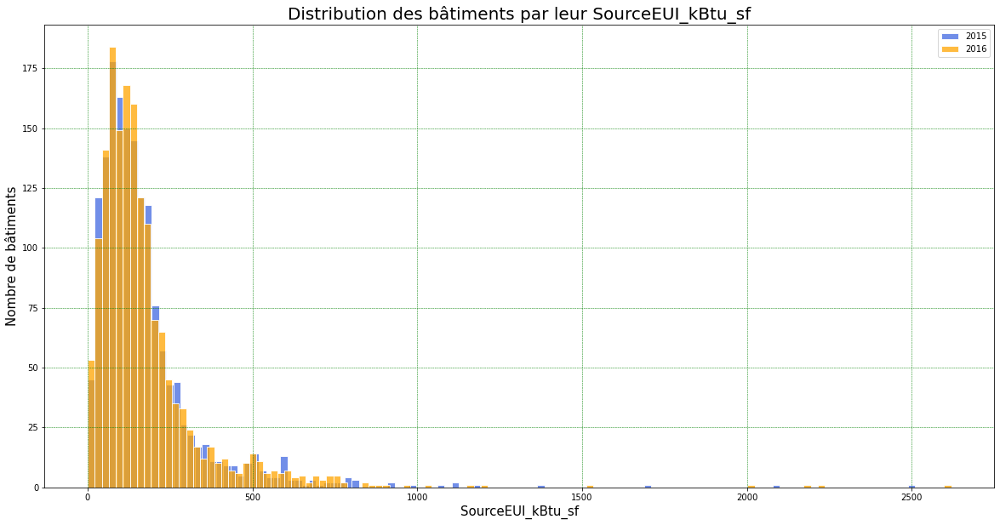

In [147]:
fig = plt.figure(figsize=(20,10))

ax = sns.histplot(data=data2_2015, x='SourceEUI_kBtu_sf', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='SourceEUI_kBtu_sf', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('SourceEUI_kBtu_sf',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur SourceEUI_kBtu_sf',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Vérifions la normalité de cette distribution avec le test de normalité de Shapiro-Wilk:

In [148]:
kstest_2015_s = stats.shapiro(data2_2015['SourceEUI_kBtu_sf'])
kstest_2015_s

ShapiroResult(statistic=0.6616010665893555, pvalue=0.0)

In [149]:
kstest_2016_s = stats.shapiro(data2_2016['SourceEUI_kBtu_sf'])
kstest_2016_s

ShapiroResult(statistic=0.6318387985229492, pvalue=0.0)

In [150]:
kstest_Total_s= stats.shapiro(data2['SourceEUI_kBtu_sf'])
kstest_Total_s

ShapiroResult(statistic=0.6450027227401733, pvalue=0.0)

In [ ]:
#Vérifions la normalité de cette distribution avec le test de normalité de Kolmogorov-Smirnov:

In [151]:
kstest_2015_k = stats.kstest(data2_2015['SourceEUI_kBtu_sf'],cdf='norm')
kstest_2015_k

KstestResult(statistic=0.9962149686296182, pvalue=0.0)

In [152]:
kstest_2016_k = stats.kstest(data2_2016['SourceEUI_kBtu_sf'],cdf='norm')
kstest_2016_k

KstestResult(statistic=0.9884744676998286, pvalue=0.0)

In [153]:
kstest_Total_k= stats.kstest(data2['SourceEUI_kBtu_sf'],cdf='norm')
kstest_Total_k

KstestResult(statistic=0.9921057098728492, pvalue=0.0)

In [ ]:
#Les pvalues pour les deux années étant égales à zéro avec les 2 tests, on n'a pas de distributions normales pour la 
#'SourceEUI_kBtu_sf' pour aucune des deux années, ni pour l'ensemble des 2 années. (Pour qu'elle le soit p>0.05)

#Maintenant faisont un zoom sur les 'SourceEUI_kBtu_sf'<1000 où semble se concentrer la plupart des bâtiments afin de 
#comprendre mieux le comportement.

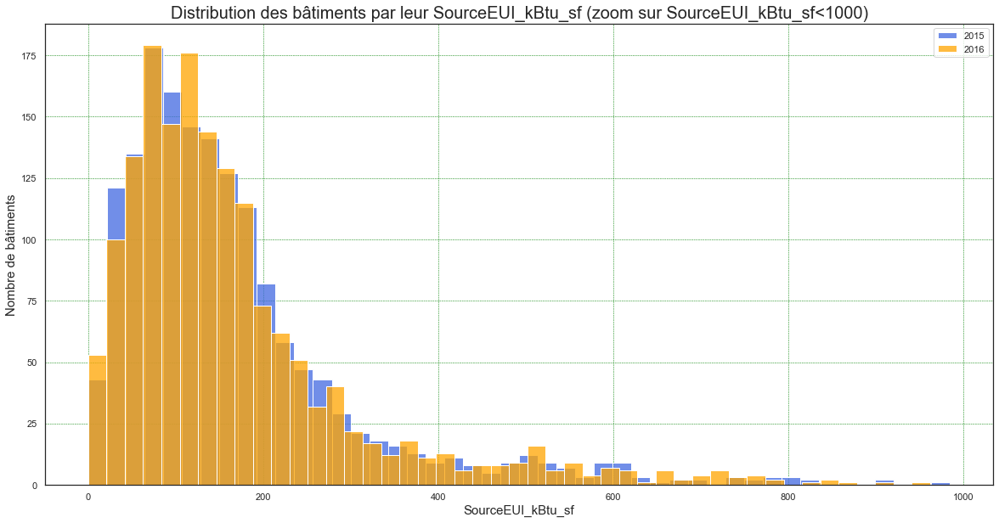

In [154]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2_2015[(data2_2015['SourceEUI_kBtu_sf']< 1000)], x='SourceEUI_kBtu_sf', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016[(data2_2016['SourceEUI_kBtu_sf']< 1000)], x='SourceEUI_kBtu_sf', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('SourceEUI_kBtu_sf',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur SourceEUI_kBtu_sf (zoom sur SourceEUI_kBtu_sf<1000)',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez qu'on a une variable très étendue. Afin de rapprocher des valeurs extrêmes pour obtenir un graph de distribution 
#moins étendu il serait tentant d'appliquer le logarithme. On ne peut pas utiliser log(x) car on a des "0", mais on peut 
#utiliser le log(x+1), ceci est une translation de la distribution vers la droite et la contribution des bâtiments ayant une
#consommation moyenne totale d'énergie nulle restera nulle car log(1)=0.

#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

In [155]:
data2_2015['SourceEUI_kBtu_sf_log']=np.log(data2_2015['SourceEUI_kBtu_sf']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/3452164237.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2015['SourceEUI_kBtu_sf_log']=np.log(data2_2015['SourceEUI_kBtu_sf']+1)


In [156]:
data2_2016['SourceEUI_kBtu_sf_log']=np.log(data2_2016['SourceEUI_kBtu_sf']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/1097557519.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2016['SourceEUI_kBtu_sf_log']=np.log(data2_2016['SourceEUI_kBtu_sf']+1)


In [157]:
data2['SourceEUI_kBtu_sf_log']=np.log(data2['SourceEUI_kBtu_sf']+1)

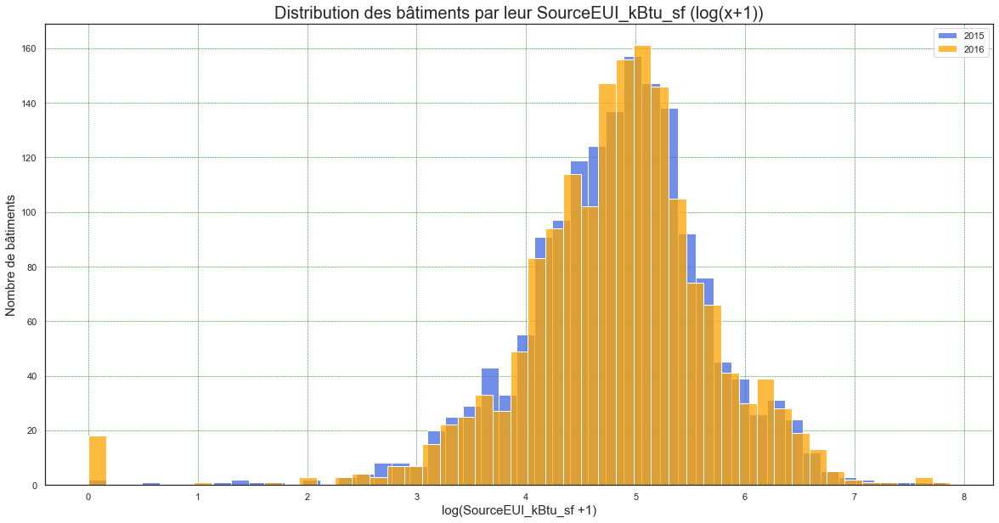

In [158]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2_2015, x='SourceEUI_kBtu_sf_log', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='SourceEUI_kBtu_sf_log', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('log(SourceEUI_kBtu_sf +1)',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur SourceEUI_kBtu_sf (log(x+1))',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Maintenant pour les deux années ensemble:

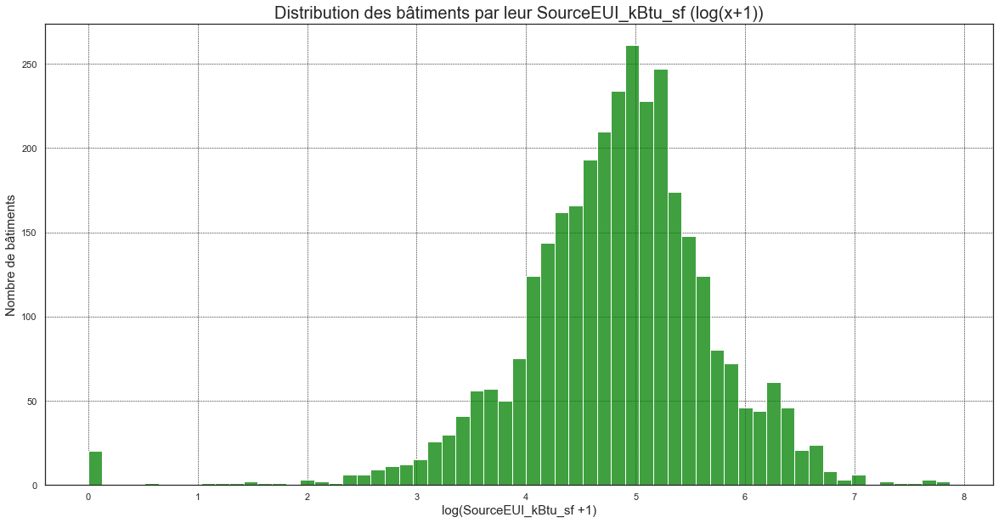

In [159]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2, x='SourceEUI_kBtu_sf_log', color='green', label='Total', edgecolor='white' )
ax.set_xlabel('log(SourceEUI_kBtu_sf +1)',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur SourceEUI_kBtu_sf (log(x+1))',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez qu'en faisant le log on a bien un distribution moins étendue, même si elle reste non 'normale', puisque le résultat 
#des tests de normalité de Shapiro-Wilk et Kolmogorov-Smirnov se maintiennent malgré la transformation logarithmique.

#Voyons maintenant la dépendance de cette variable (soumise au logarithme) avec les 6 autres variables potentiellement 
#descriptives ('BuildingType', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'Neighborhood', 'ZipCode')

#C.6.1 'SourceEUI=_kBtu_sf' vs 'BuildingType'

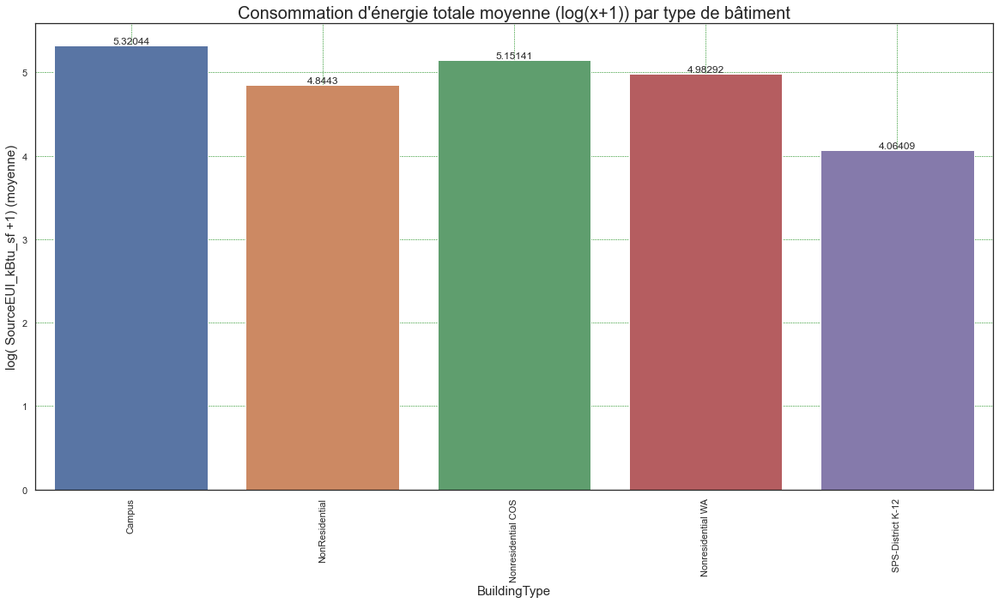

In [160]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(x=data2['BuildingType'],y=data2['SourceEUI_kBtu_sf_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'],ci=None)
ax.set_xlabel('BuildingType',size=15)
ax.set_ylabel('log( SourceEUI_kBtu_sf +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Consommation d'énergie totale moyenne (log(x+1)) par type de bâtiment",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par type de bâtiments, du coup il est intéressant de
#voir par rapport a combien de bâtiments on a de telles moyennes, et de voir aussi le comportement sans log:

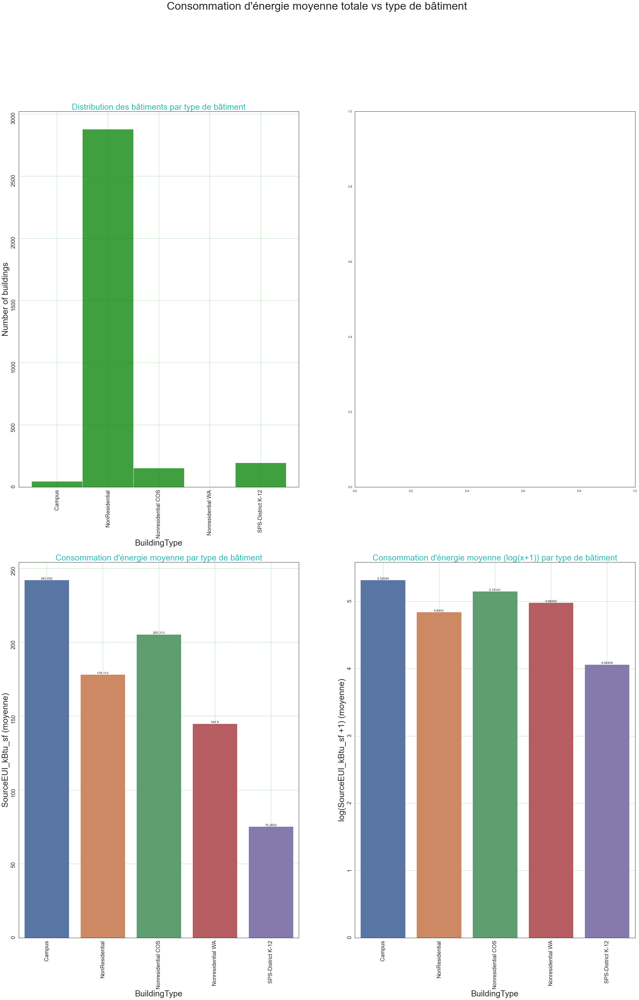

In [161]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=d1_bdt, x='BuildingType', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(x=data2['BuildingType'],y=data2['SourceEUI_kBtu_sf'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(x=data2['BuildingType'],y=data2['SourceEUI_kBtu_sf_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[1,1],  edgecolor='white')

axes[0,0].set_xlabel('BuildingType',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title("Distribution des bâtiments par type de bâtiment", color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('BuildingType',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Consommation d'énergie moyenne par type de bâtiment", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)


axes[1,1].set_xlabel('BuildingType',size=30)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Consommation d'énergie moyenne (log(x+1)) par type de bâtiment", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)



axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs type de bâtiment",  size=40)
plt.show()


In [ ]:
#Notez que les campus et les non residential (rien, COS et WA)se démarquent en terme de consommation d'énergie.

#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.2 'SourceEUI_kBtu_sf' vs 'YearBuilt'

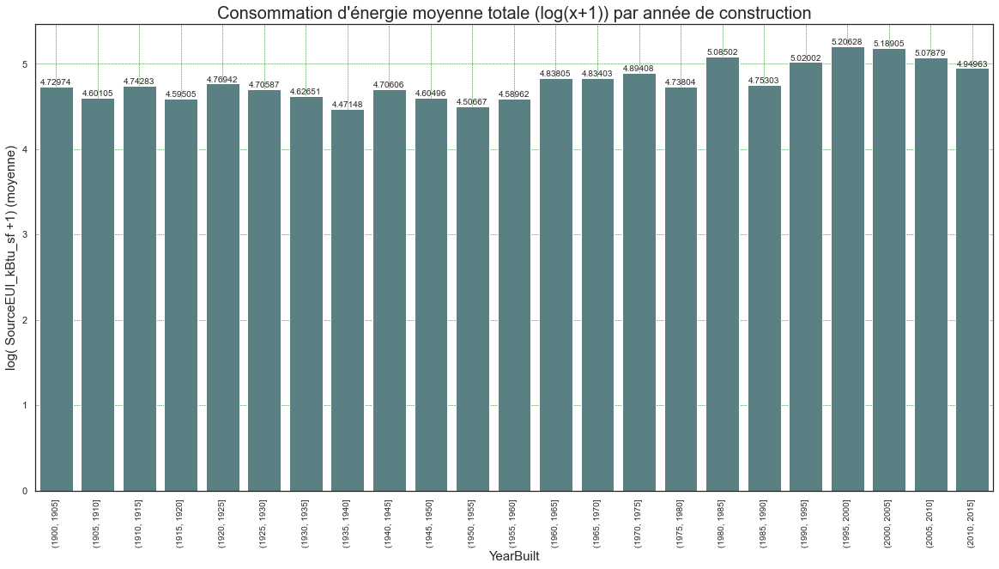

In [162]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1905,1910,1915,1920,1925,1930,1935,1940,1945,1950,1955,1960,1965,1970,1975,1980,1985,1990,1995,2000,2005,2010,2015]), y=data2['SourceEUI_kBtu_sf_log'], ci=None, color='#53868B')
ax.set_xlabel('YearBuilt',size=15)
ax.set_ylabel('log( SourceEUI_kBtu_sf +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0], size=10)
plt.title("Consommation d'énergie moyenne totale (log(x+1)) par année de construction", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=10)
plt.show()

In [ ]:
#En prenant des groupes de 5 ans, si bien certains groupes arrivent à se démarquer (ie.1940-1945, 1970-1975, 1995-2000), on
#ne distingue pas vraiment ce qui se passe. On avait vu auparavant qu'on avait 115 années avec une distribution non normale
#et donc qu'on pouvait faire des groupe homogènes soit en prenant 5 années de suite soit 23 année de suite. Prenons des
#groupes de 23 années pour voir si c'est plus clair.

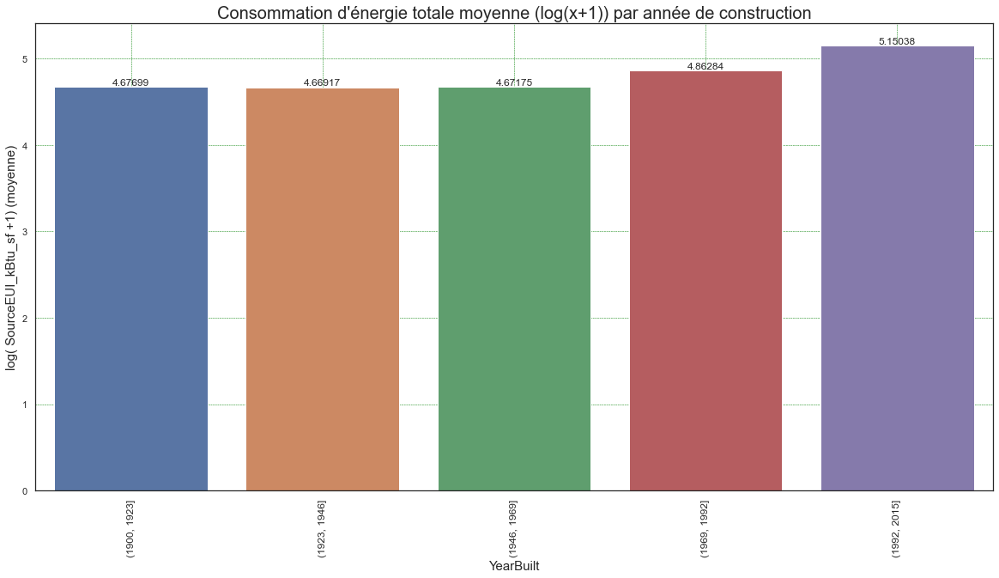

In [163]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['SourceEUI_kBtu_sf_log'], ci=None)
ax.set_xlabel('YearBuilt',size=15)
ax.set_ylabel('log( SourceEUI_kBtu_sf +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Consommation d'énergie totale moyenne (log(x+1)) par année de construction", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)
plt.show()

In [ ]:
#Notez que les bâtiments de moins de 23 ans semblent être ceux aui dépensent le plus d'énergie.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par groupe de 23 ans d'années de construction, du coup 
#il est intéressant de voir par rapport à combien de bâtiments on a de telles moyennes et le comportement sans log:

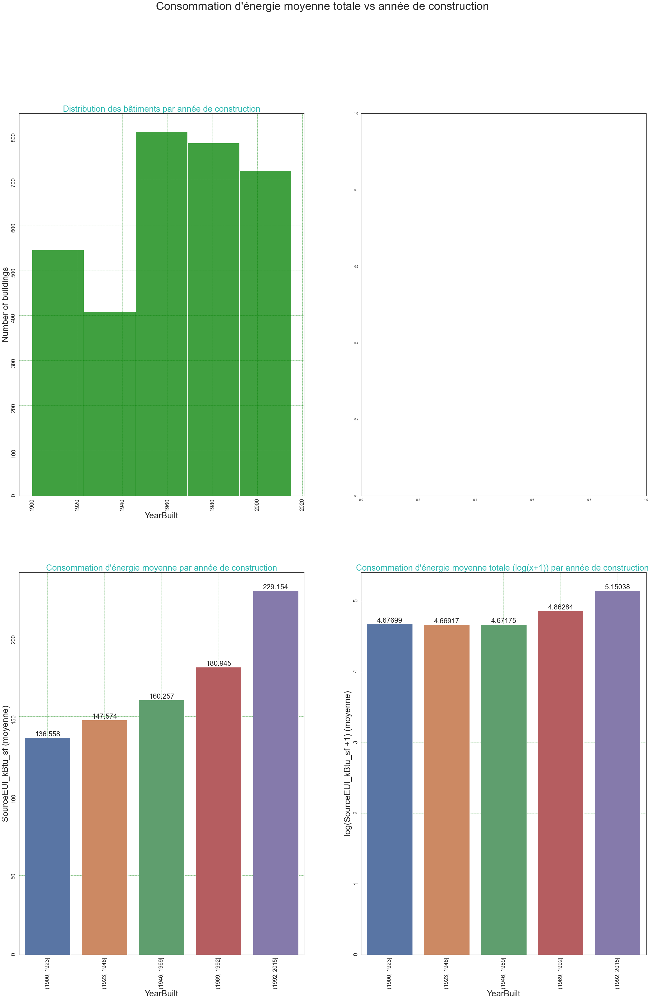

In [164]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='YearBuilt', bins=[1900,1923,1946,1969,1992,2015], color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['SourceEUI_kBtu_sf'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[1,1],  edgecolor='white')

axes[0,0].set_xlabel('YearBuilt',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par année de construction', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('YearBuilt',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0], size=25)
axes[1,0].set_title("Consommation d'énergie moyenne par année de construction", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('YearBuilt',size=30)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0], size=25)
axes[1,1].set_title("Consommation d'énergie moyenne totale (log(x+1)) par année de construction ", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs année de construction",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.3 'SourceEUI_kBtu_sf' vs 'NumberofFloors'

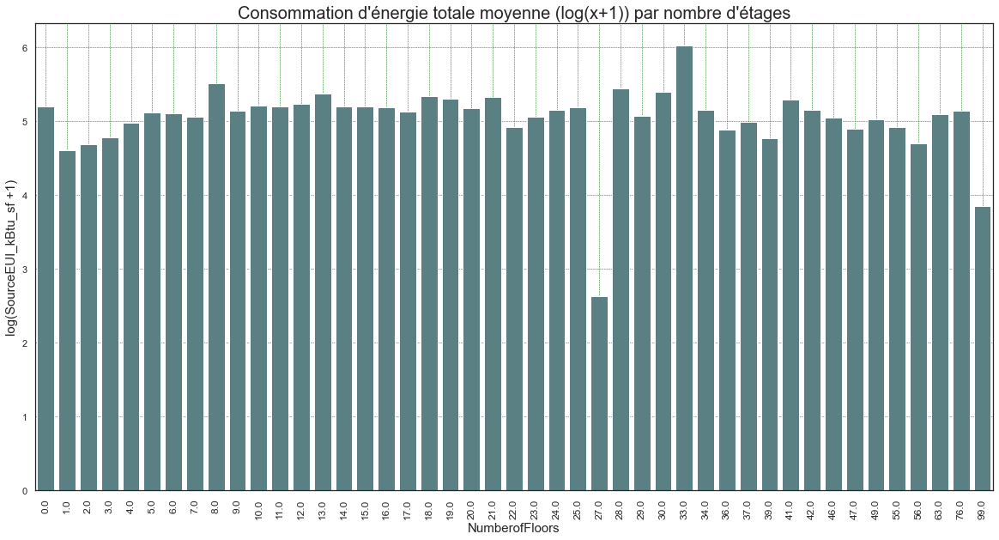

In [165]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['SourceEUI_kBtu_sf_log'], ci=None, color='#53868B')
ax.set_xlabel('NumberofFloors',size=15)
ax.set_ylabel('log(SourceEUI_kBtu_sf +1)', size=15)
#ax.bar_label(ax.containers[0], size=10)
plt.title("Consommation d'énergie totale moyenne (log(x+1)) par nombre d'étages", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)

plt.show()

In [ ]:
#Les bâtiment avec 99 étages semblent se démarquer en étant ce qui consomment le moins d'énergie en moyenne totale. Mais,
#est-ce logique?

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par groupe de 23 ans d'années de construction, du 
#coup il est intéressant de voir par rapport à combien de bâtiments on a de telles moyennes et le comportement sans log:

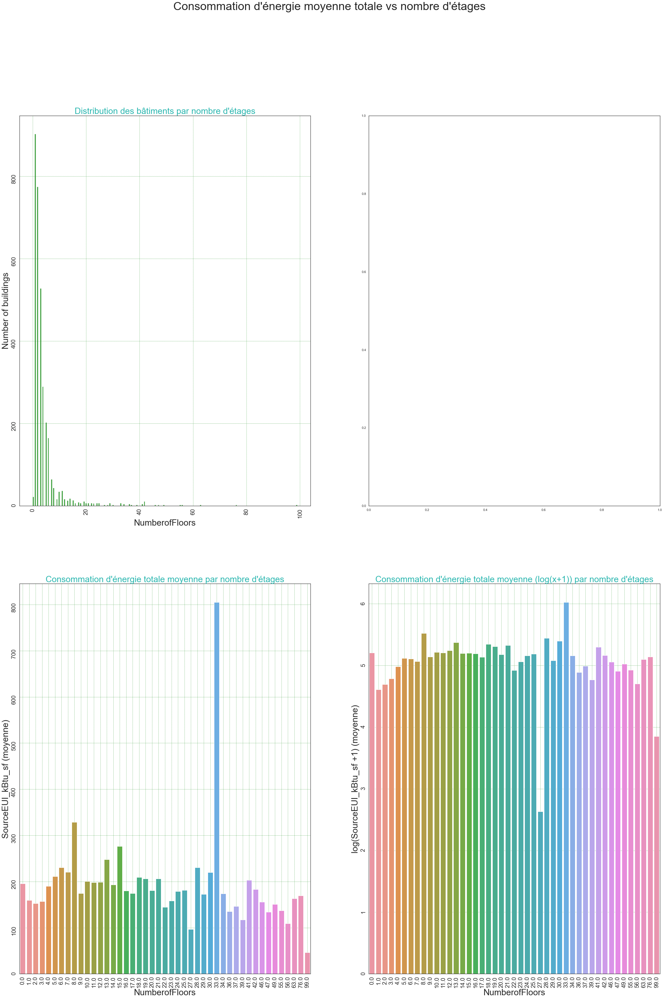

In [166]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='NumberofFloors', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['SourceEUI_kBtu_sf'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[1,1],  edgecolor='white')

axes[0,0].set_xlabel('NumberofFloors',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title("Distribution des bâtiments par nombre d'étages", color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('NumberofFloors',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
#axes[1,0].bar_label(axes[1,0].containers[0], size=25)
axes[1,0].set_title("Consommation d'énergie totale moyenne par nombre d'étages", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('NumberofFloors',size=30)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=30)
#axes[1,1].bar_label(axes[1,1].containers[0], size=25)
axes[1,1].set_title("Consommation d'énergie totale moyenne (log(x+1)) par nombre d'étages", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)

axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs nombre d'étages",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.4 'SourceEUI_kBtu_sf' vs 'PropertyGFATotal'

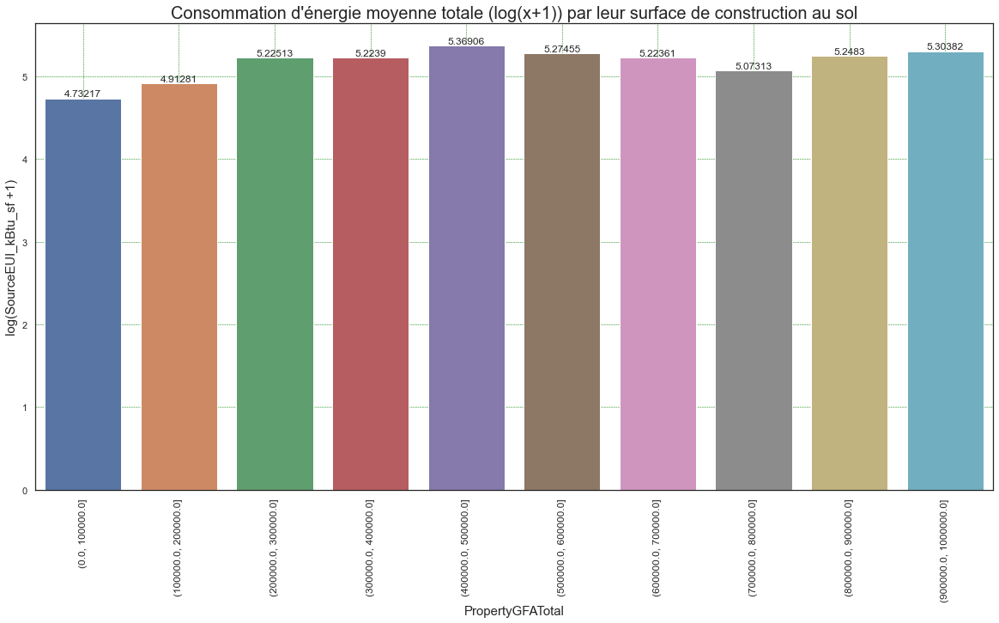

In [167]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['SourceEUI_kBtu_sf_log'], ci=None)
ax.set_ylabel('log(SourceEUI_kBtu_sf +1)', size=15)
ax.set_xlabel('PropertyGFATotal', size=15)
ax.bar_label(ax.containers[0])
plt.title("Consommation d'énergie moyenne totale (log(x+1)) par leur surface de construction au sol", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)

plt.show()

In [ ]:
#Les bâtiments ayant une surface de construction au sol entre 800 000 m^2 et 900 000 se démarquent des autres étant ce qui
#consomment le plus d'énergie. De même on voit que jusqu'à 200 000 m^2 on consomme le moins d'énergie.

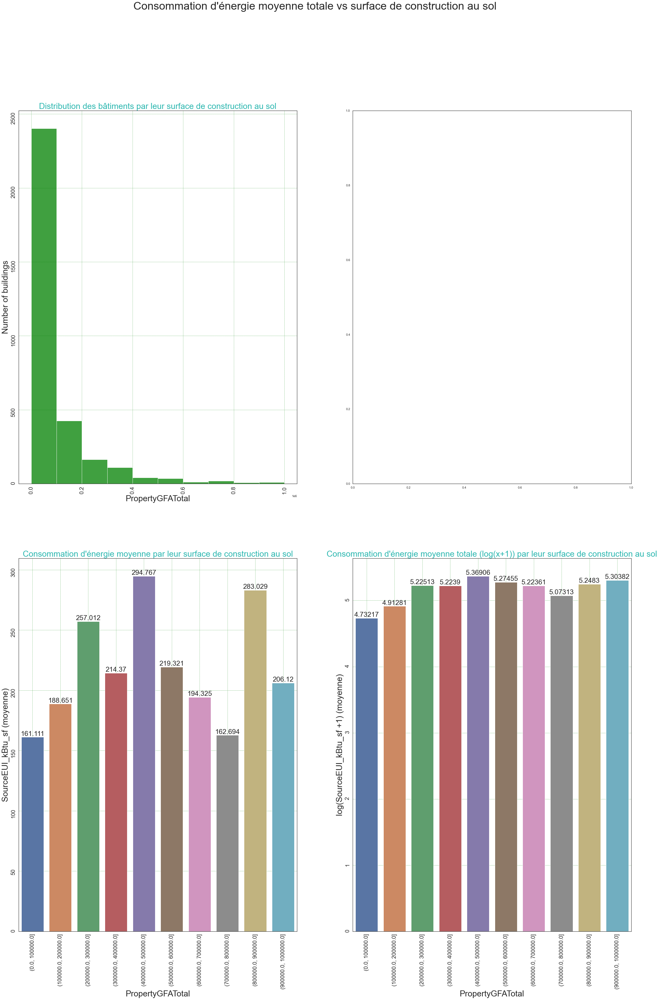

In [168]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='PropertyGFATotal', bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6], color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['SourceEUI_kBtu_sf'], ci=None, ax=axes[1,0])
sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[1,1])


axes[0,0].set_xlabel('PropertyGFATotal',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par leur surface de construction au sol', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('PropertyGFATotal',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0], size=25)
axes[1,0].set_title("Consommation d'énergie moyenne par leur surface de construction au sol", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('PropertyGFATotal',size=30)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0], size=25)
axes[1,1].set_title("Consommation d'énergie moyenne totale (log(x+1)) par leur surface de construction au sol", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)

axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs surface de construction au sol",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.5 'SourceEUI_kBtu_sf' vs 'Neighborhood'

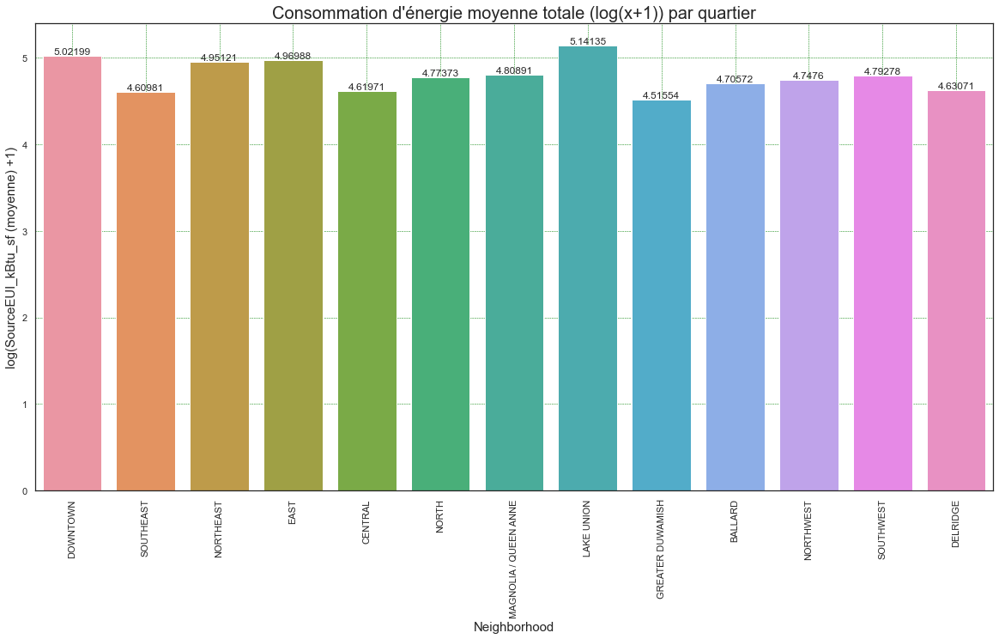

In [169]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(x=data2['Neighborhood'],y=data2['SourceEUI_kBtu_sf_log'],data=data2,ci=None)
ax.set_xlabel('Neighborhood',size=15)
ax.set_ylabel('log(SourceEUI_kBtu_sf (moyenne) +1)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Consommation d'énergie moyenne totale (log(x+1)) par quartier",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#Les quartiers de Lake Union, Downtown, Northeast, et Ballard (dans cet ordre), sont ce qui montrent le plus grandes 
#consommations moyennes d'énergie.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par quartier, du coup il est intéressant de voir par 
#rapport à combien de bâtiments on a de telles moyennes:

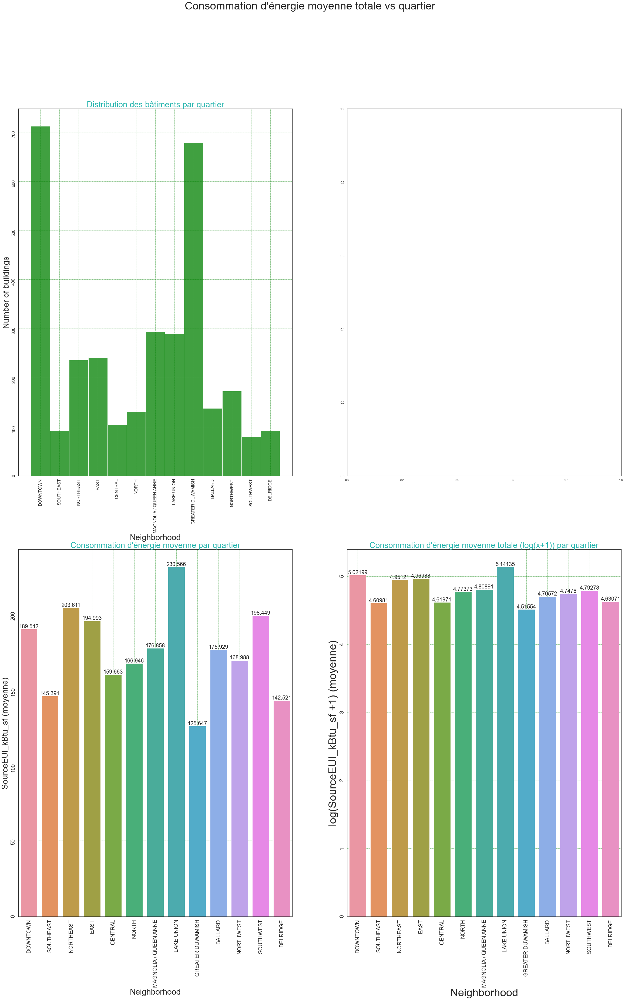

In [170]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='Neighborhood', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['SourceEUI_kBtu_sf'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[1,1],  edgecolor='white')


axes[0,0].set_xlabel('Neighborhood',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par quartier', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=16)

axes[1,0].set_xlabel('Neighborhood',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0], size=20)
axes[1,0].set_title("Consommation d'énergie moyenne par quartier", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('Neighborhood',size=40)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=40)
axes[1,1].bar_label(axes[1,1].containers[0], size=20)
axes[1,1].set_title("Consommation d'énergie moyenne totale (log(x+1)) par quartier", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)

axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs quartier",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.6 'SourceEUI_kBtu_sf' vs 'ZipCode'

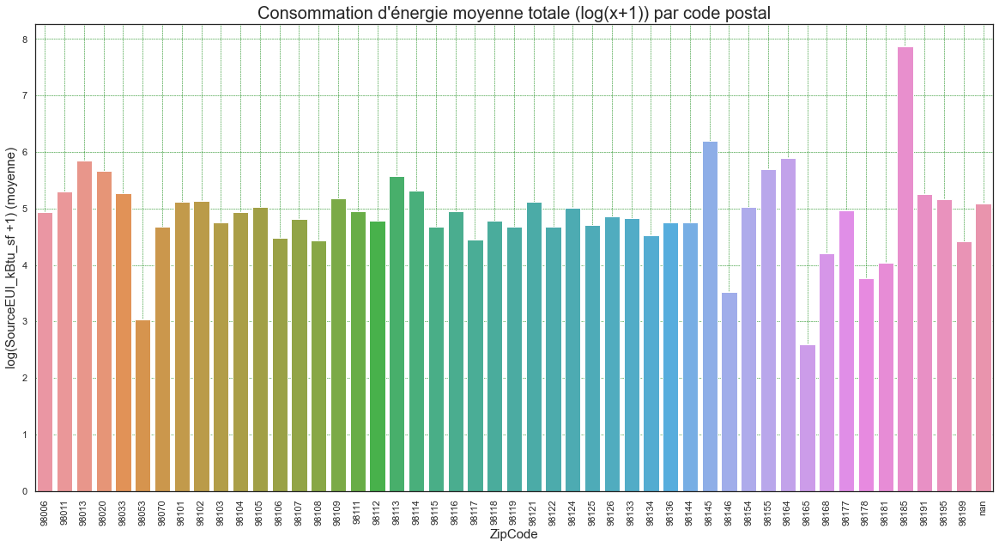

In [171]:
d2=data2.sort_values('ZipCode_New',ascending = True)

fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")


ax=sns.barplot(x=d2['ZipCode_New'],y=data2['SourceEUI_kBtu_sf_log'],data=data2,ci=None)
ax.set_xlabel('ZipCode',size=15)
ax.set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)

plt.title("Consommation d'énergie moyenne totale (log(x+1)) par code postal",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#On a clairement 3 ZipCodes qui ressortent: 98013, 98145 et 98185 par rapport a leur consommation d'énergie moyenne.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par code postal, du coup il est intéressant de voir 
#par rapport à combien de bâtiments on a de telles moyennes:

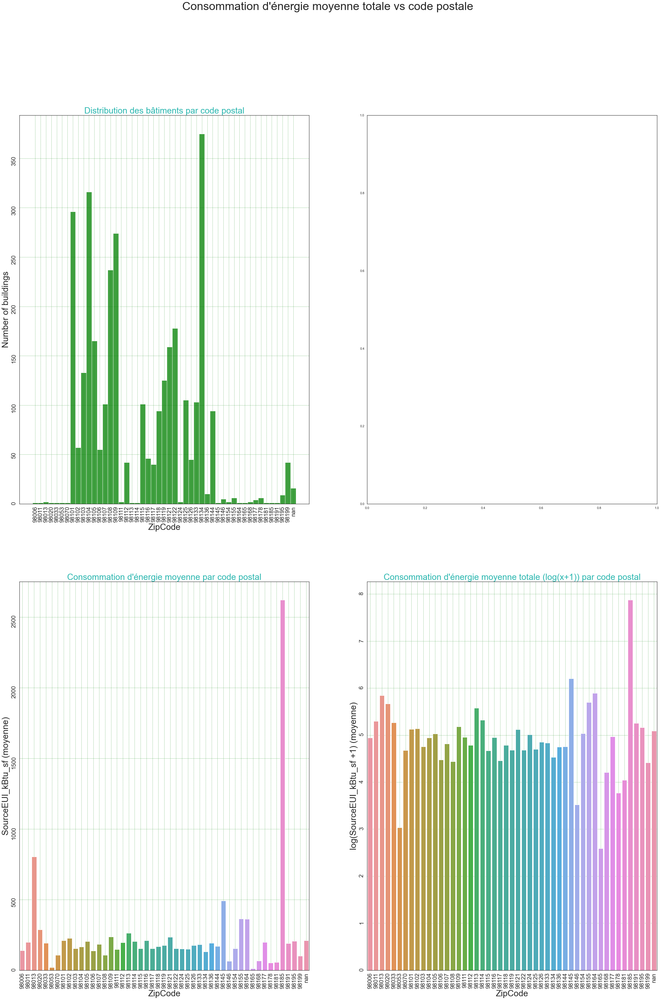

In [172]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=d2, x='ZipCode_New', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['SourceEUI_kBtu_sf'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[1,1],  edgecolor='white')


axes[0,0].set_xlabel('ZipCode',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par code postal', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('ZipCode',size=30)
axes[1,0].set_ylabel('SourceEUI_kBtu_sf (moyenne)', size=30)
#axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Consommation d'énergie moyenne par code postal", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('ZipCode',size=30)
axes[1,1].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=30)
#axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Consommation d'énergie moyenne totale (log(x+1)) par code postal", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne totale vs code postale",  size=40)
plt.show()

In [ ]:
#Notez que les codes postal qui se démarquent le plus ne correspondent pas au ZipCodes centraux dont on parlait auparavant.
#C'est surtout la 98185.

#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#------------------------------

#C.7 Analyse de la variable cible 'TotalGHGEmissions'

In [173]:
data2['TotalGHGEmissions'].describe()

count     3263.000000
mean       177.740383
std        670.155245
min         -0.800000
25%         20.020000
50%         49.280000
75%        138.765000
max      16870.980000
Name: TotalGHGEmissions, dtype: float64

In [174]:
c=data2.loc[data2['TotalGHGEmissions']<=0]
c.count()

DataYear                         9
OSEBuildingID                    9
TaxParcelIdentificationNumber    9
PropertyName                     9
BuildingType                     9
YearBuilt                        9
NumberofFloors                   9
PropertyGFATotal                 9
ENERGYSTARScore                  3
SourceEUI_kBtu_sf                9
TotalGHGEmissions                9
Neighborhood                     9
ZipCode_New                      9
NumberofFloors_log               9
PropertyGFATotal_log             9
SourceEUI_kBtu_sf_log            9
dtype: int64

In [ ]:
#Notez que l'on a 12 bâtiments dont le dépense moyenne totale d'énergie est nulle ou négative.

In [175]:
data2_2015['TotalGHGEmissions'].describe()

count     1614.000000
mean       168.790731
std        569.830831
min          0.000000
25%         19.587500
50%         48.600000
75%        137.012500
max      11824.890000
Name: TotalGHGEmissions, dtype: float64

In [176]:
data2_2016['TotalGHGEmissions'].describe()

count     1649.000000
mean       186.500079
std        755.634975
min         -0.800000
25%         20.480000
50%         49.980000
75%        144.410000
max      16870.980000
Name: TotalGHGEmissions, dtype: float64

In [ ]:
#Voyons la forme de la distribution.

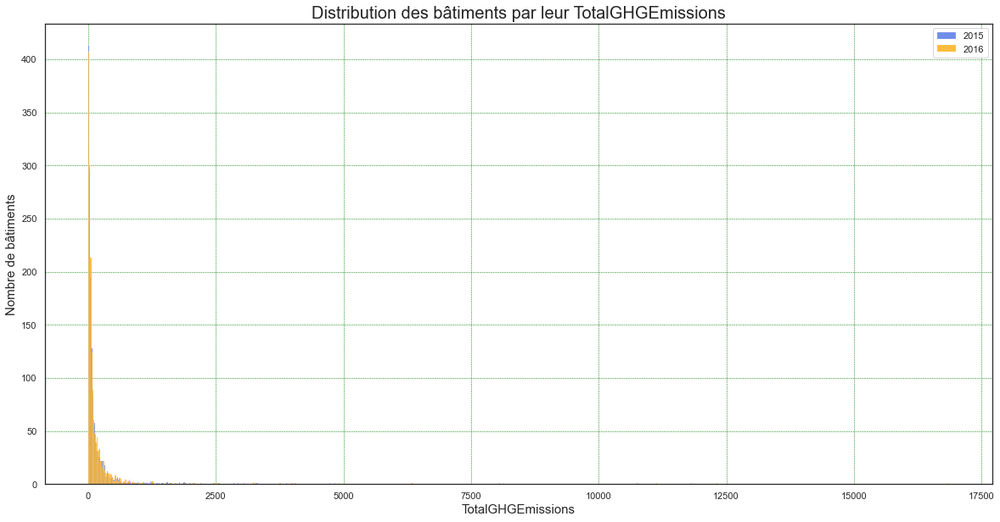

In [177]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2_2015, x='TotalGHGEmissions', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='TotalGHGEmissions', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('TotalGHGEmissions',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur TotalGHGEmissions',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Vérifions la normalité de cette distribution avec le test de normalité de Shapiro-Wilk:

In [178]:
kstest_2015_s = stats.shapiro(data2_2015['TotalGHGEmissions'])
kstest_2015_s

ShapiroResult(statistic=0.23079335689544678, pvalue=0.0)

In [179]:
kstest_2016_s = stats.shapiro(data2_2016['TotalGHGEmissions'])
kstest_2016_s

ShapiroResult(statistic=0.17754948139190674, pvalue=0.0)

In [180]:
kstest_Total_s= stats.shapiro(data2['TotalGHGEmissions'])
kstest_Total_s

ShapiroResult(statistic=0.1959015130996704, pvalue=0.0)

In [ ]:
#Vérifions ceci avec un test de normalité de Kolmogorov-Smirnov:

In [181]:
kstest_2015 = stats.kstest(data2_2015['TotalGHGEmissions'],'norm')
kstest_2015

KstestResult(statistic=0.9688639783434085, pvalue=0.0)

In [182]:
kstest_2016 = stats.kstest(data2_2016['TotalGHGEmissions'],'norm')
kstest_2016

KstestResult(statistic=0.9683363190328225, pvalue=0.0)

In [183]:
kstest = stats.kstest(data2['TotalGHGEmissions'],'norm')
kstest

KstestResult(statistic=0.9685567523811818, pvalue=0.0)

In [ ]:
#Les pvalues pour les deux années étant égales à zéro, on n'a pas de distributions normales pour le 'TotalGHGEmissions' pour
#aucune des deux années.
#Maintenant faisons sur les 'TotalGHGEmissions'<1000 où semble se concentrer la plupart des bâtiments afin de comprendre 
#mieux le comportement.

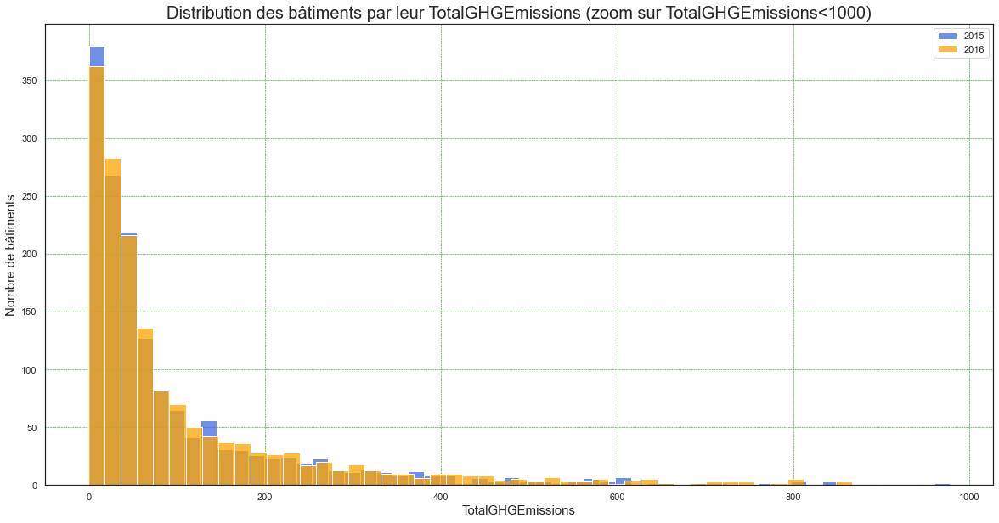

In [184]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2_2015[(data2_2015['TotalGHGEmissions']< 1000)], x='TotalGHGEmissions', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016[(data2_2016['TotalGHGEmissions']< 1000)], x='TotalGHGEmissions', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('TotalGHGEmissions',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur TotalGHGEmissions (zoom sur TotalGHGEmissions<1000)',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez qu'on a une variable très étendue. Afin de rapprocher des valeurs extrêmes pour obtenir un graph de distribution 
#moins étendu il serait intéressant d'appliquer le logarithme. Mais on peut utiliser le log(x+1), ceci est une translation de la 
#distribution vers la droite et la contribution des bâtiments ayant une consommation moyenne totale d'énergie nulle restera
#nulle car log(1)=0.

In [185]:
data2_2015['TotalGHGEmissions_log']=np.log(data2_2015['TotalGHGEmissions']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/2739168034.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2015['TotalGHGEmissions_log']=np.log(data2_2015['TotalGHGEmissions']+1)


In [186]:
data2_2016['TotalGHGEmissions_log']=np.log(data2_2016['TotalGHGEmissions']+1)

C:\Users\'titite\AppData\Local\Temp/ipykernel_20332/3118934736.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data2_2016['TotalGHGEmissions_log']=np.log(data2_2016['TotalGHGEmissions']+1)


In [187]:
data2['TotalGHGEmissions_log']=np.log(data2['TotalGHGEmissions']+1)

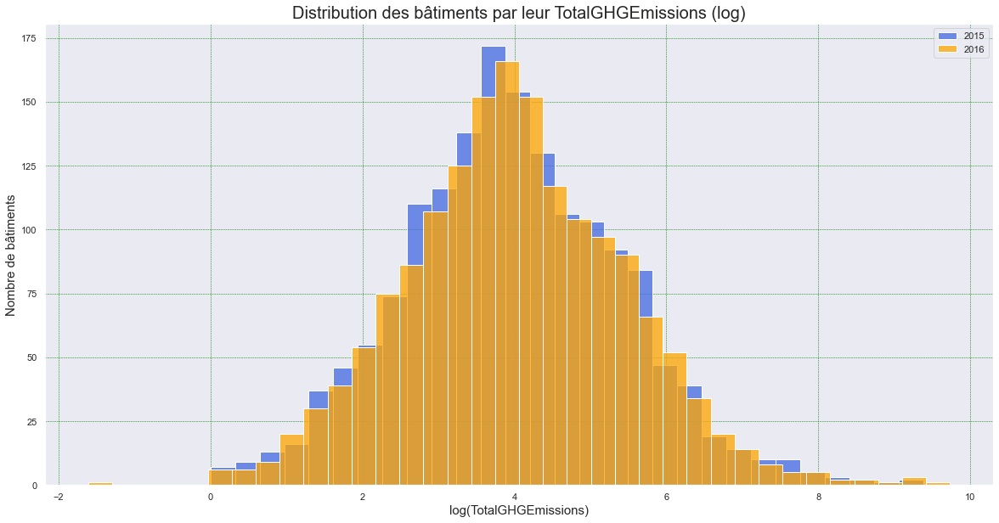

In [188]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)

ax = sns.histplot(data=data2_2015, x='TotalGHGEmissions_log', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='TotalGHGEmissions_log', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('log(TotalGHGEmissions)',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur TotalGHGEmissions (log)',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez qu'en faisant le log on a bien un distribution moins étendue, même si elle reste non 'normale', puisque le résutat du
#test de normalité de Kolmogorov-Smirnov se maintient malgré la transformation logarithmique.

In [ ]:
#Maintenant pour les deux années ensemble:

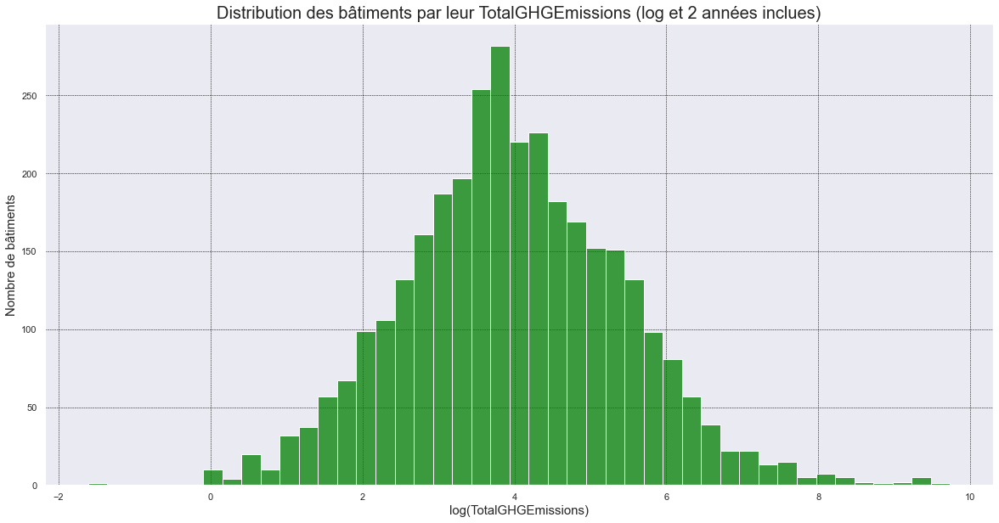

In [189]:
fig = plt.figure(figsize=(20,10))
sns.set(font_scale =1)

ax = sns.histplot(data=data2, x='TotalGHGEmissions_log', color='green', label='Total', edgecolor='white' )
ax.set_xlabel('log(TotalGHGEmissions)',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur TotalGHGEmissions (log et 2 années inclues)',  size=20)
plt.grid(color = 'black', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez qu'en faisant le log on a bien un distribution moins étendue, même si elle reste non 'normale', puisque le résultat 
#du test de normalité de Kolmogorov-Smirnov se maintient malgré la transformation logarithmique.

#Voyons maintenant la dépendance de cette variable (soumise au logarithme) avec les 6 autres variables potentiellement 
#descriptives ('BuildingType', 'YearBuilt', 'NumberofFloors', 'PropertyGFATotal', 'Neighborhood', 'ZipCode')

In [ ]:
#C.7.1 'TotalGHGEmissions_log' vs 'BuildingType'

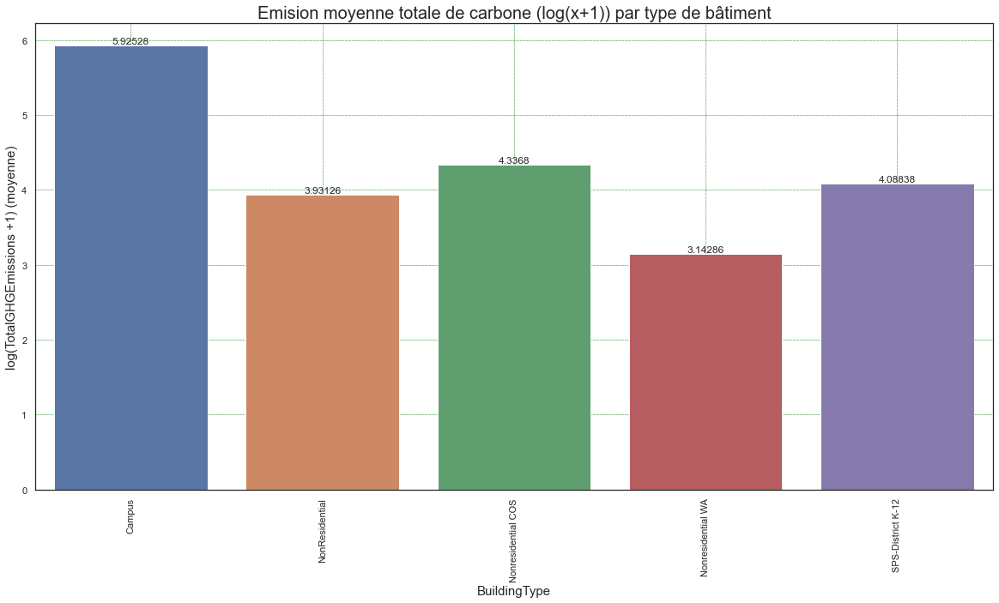

In [190]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(x=data2['BuildingType'],y=data2['TotalGHGEmissions_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'],ci=None)
ax.set_xlabel('BuildingType',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Emision moyenne totale de carbone (log(x+1)) par type de bâtiment",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par type de bâtiments, du coup il est intéressant de
#voir par rapport a combien de bâtiments on a de telles moyennes:

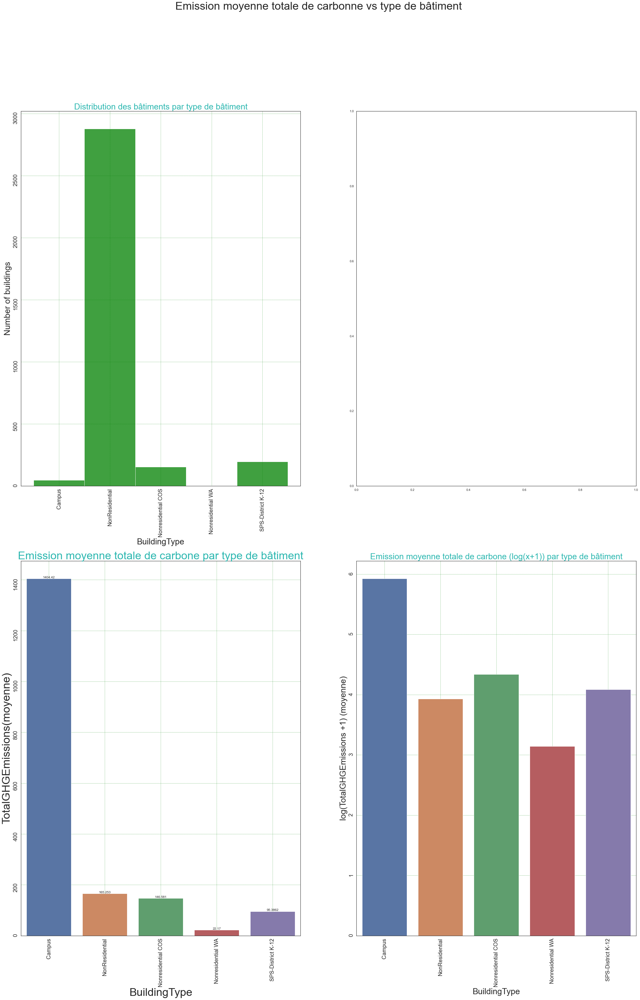

In [191]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=d1_bdt, x='BuildingType', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(x=data2['BuildingType'],y=data2['TotalGHGEmissions'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(x=data2['BuildingType'],y=data2['TotalGHGEmissions_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[1,1],  edgecolor='white')


axes[0,0].set_xlabel('BuildingType',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title("Distribution des bâtiments par type de bâtiment", color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('BuildingType',size=40)
axes[1,0].set_ylabel('TotalGHGEmissions(moyenne)', size=40)
axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par type de bâtiment", color='#2cb7b0', size=40)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('BuildingType',size=30)
axes[1,1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=30)
axes[1,1].set_title("Emission moyenne totale de carbone (log(x+1)) par type de bâtiment", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)


plt.suptitle("Emission moyenne totale de carbonne vs type de bâtiment",  size=40)
plt.show()


In [ ]:
#Notez que les campus se démarquent en terme de consommation d'énergie.

#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.7.2 'TotalGHGEmissions' vs 'YearBuilt'

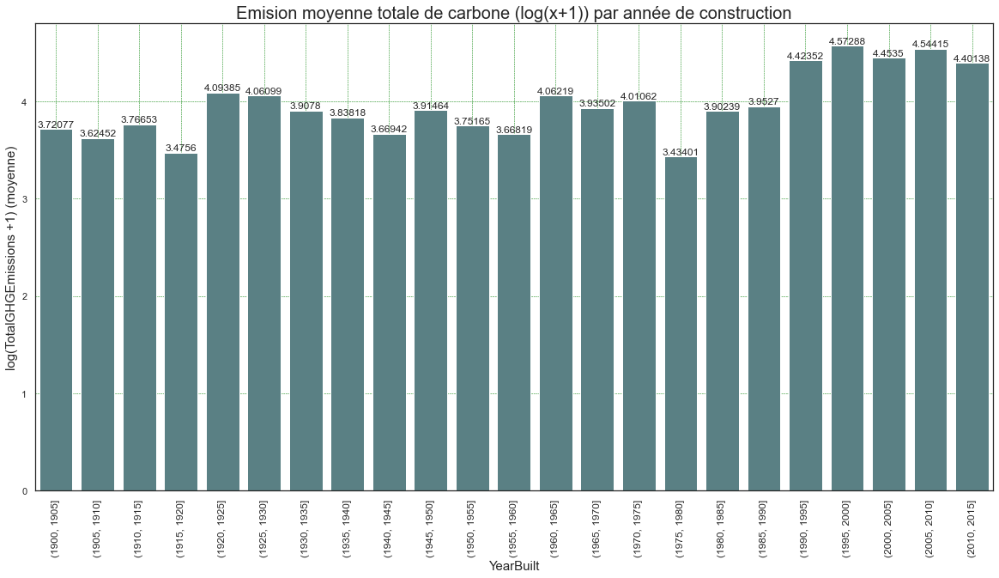

In [192]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1905,1910,1915,1920,1925,1930,1935,1940,1945,1950,1955,1960,1965,1970,1975,1980,1985,1990,1995,2000,2005,2010,2015]), y=data2['TotalGHGEmissions_log'], ci=None, color='#53868B')
ax.set_xlabel('YearBuilt',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Emision moyenne totale de carbone (log(x+1)) par année de construction", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)
plt.show()

In [ ]:
#En prenant des groupes de 5 ans, si bien certains groupes arrivent à se démarquer (ie.1940-1945, 1970-1975, 1995-2000), on
#ne distingue pas vraiment ce qui se passe. On avait vu auparavant qu'on avait 115 années avec une distribution non normale
#et donc qu'on pouvait faire des groupe homogènes soit en prenant 5 années de suite soit 23 année de suite. Prenons des
#groupes de 23 années pour voir si c'est plus clair.

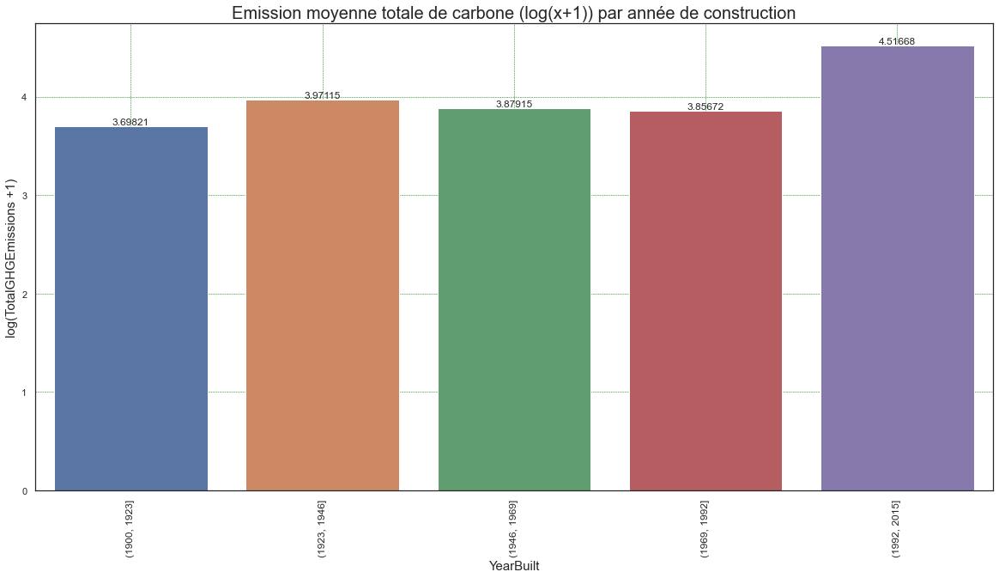

In [193]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['TotalGHGEmissions_log'], ci=None)
ax.set_xlabel('YearBuilt',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Emission moyenne totale de carbone (log(x+1)) par année de construction", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)
plt.show()

In [ ]:
#Notez que les batiments contruits entre 1923-1946 et entre 1992 et 2015 semblent être ceux qui émettent le plus de carbone.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par groupe de 23 ans d'années de constuction, du coup 
#il est intéressant de voir par rappo rt a combien de bâtiments on a de telles moyennes:

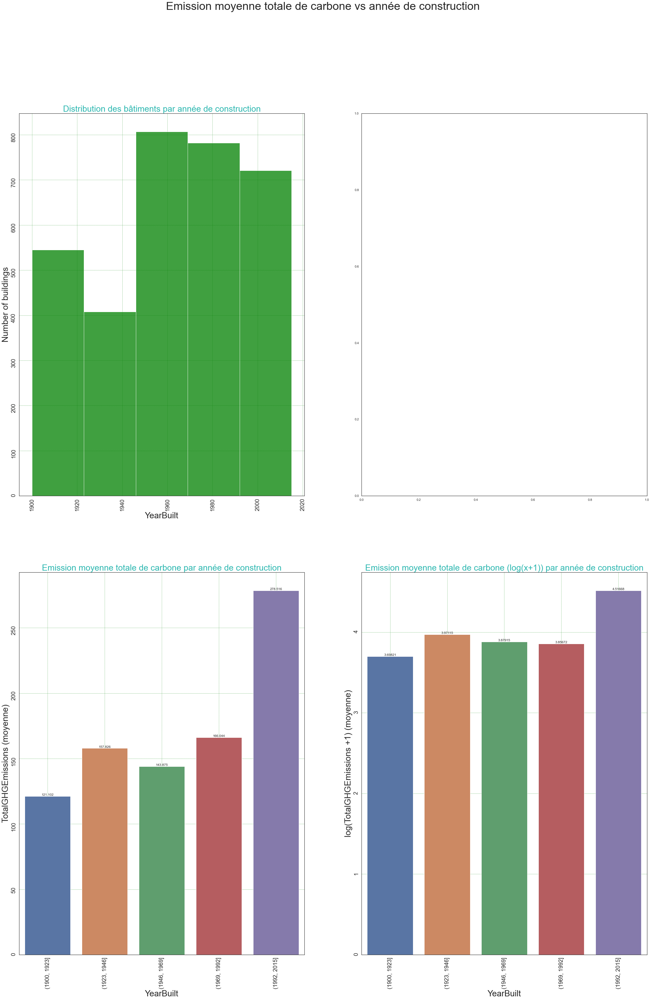

In [194]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='YearBuilt', bins=[1900,1923,1946,1969,1992,2015], color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['TotalGHGEmissions'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1,1],  edgecolor='white')


axes[0,0].set_xlabel('YearBuilt',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par année de construction', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('YearBuilt',size=30)
axes[1,0].set_ylabel('TotalGHGEmissions (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par année de construction", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('YearBuilt',size=30)
axes[1,1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Emission moyenne totale de carbone (log(x+1)) par année de construction", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Emission moyenne totale de carbone vs année de construction",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.3 'SourceEUI_kBtu_sf' vs 'NumberofFloors'

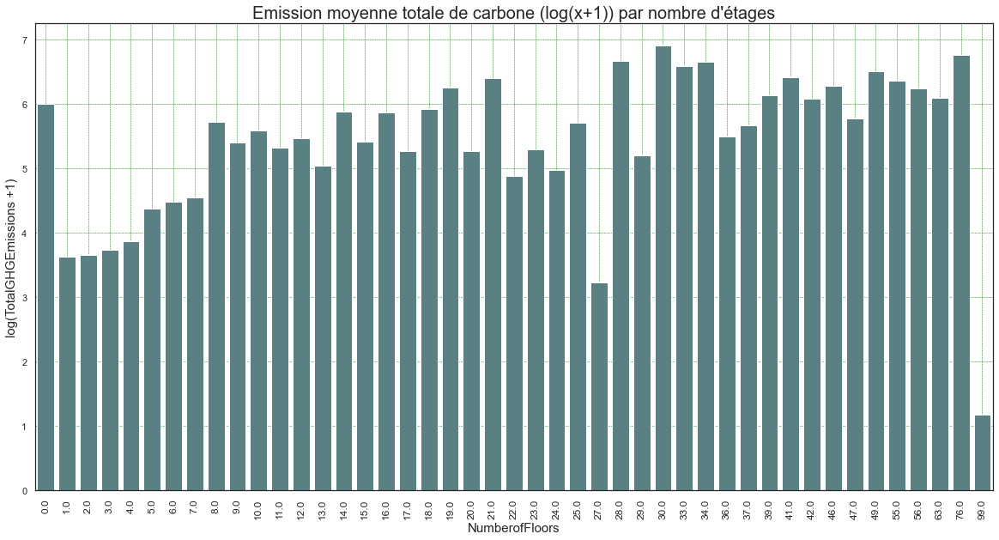

In [195]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['TotalGHGEmissions_log'], ci=None, color='#53868B')
ax.set_xlabel('NumberofFloors',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1)', size=15)
#ax.bar_label(ax.containers[0])
plt.title("Emission moyenne totale de carbone (log(x+1)) par nombre d'étages", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=12)

plt.show()

In [ ]:
#Les bâtiment avec 99 étages semblent se démarquer, étant ceux qui émettent le moins de carbonne en moyenne totale. Mais,
#est-ce logique?

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par groupe de 23 ans d'années de constuction, du coup 
#il est intéressant de voir par rapport a combien de bâtiments on a de telles moyennes:

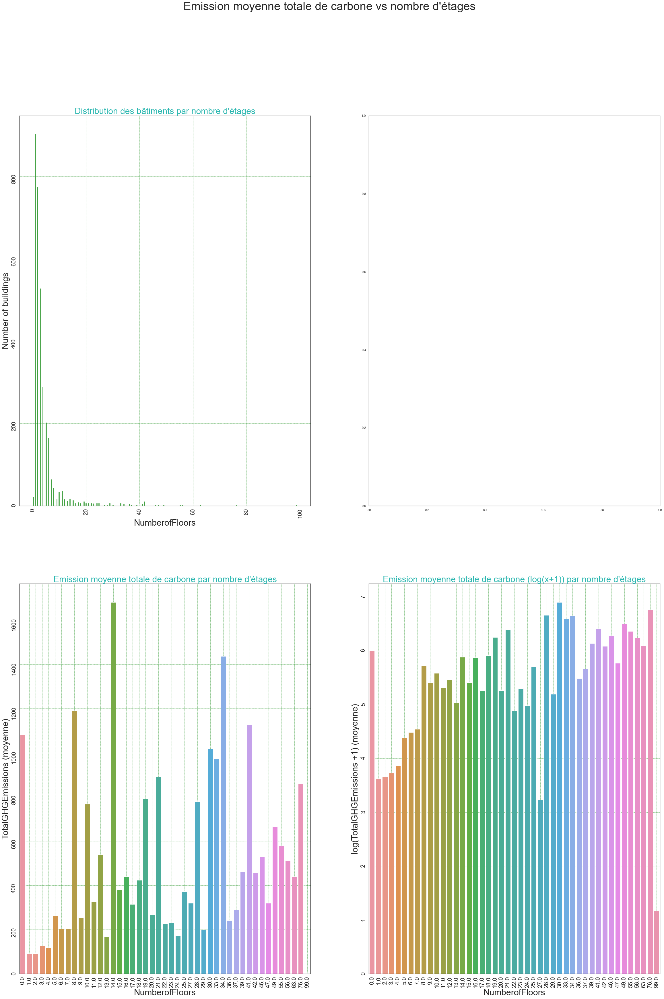

In [196]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='NumberofFloors', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['TotalGHGEmissions'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1,1],  edgecolor='white')


axes[0,0].set_xlabel('NumberofFloors',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title("Distribution des bâtiments par nombre d'étages", color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('NumberofFloors',size=30)
axes[1,0].set_ylabel('TotalGHGEmissions (moyenne)', size=30)
#axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par nombre d'étages", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('NumberofFloors',size=30)
axes[1,1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=30)
#axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Emission moyenne totale de carbone (log(x+1)) par nombre d'étages", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Emission moyenne totale de carbone vs nombre d'étages",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.4 'SourceEUI_kBtu_sf' vs 'PropertyGFATotal'

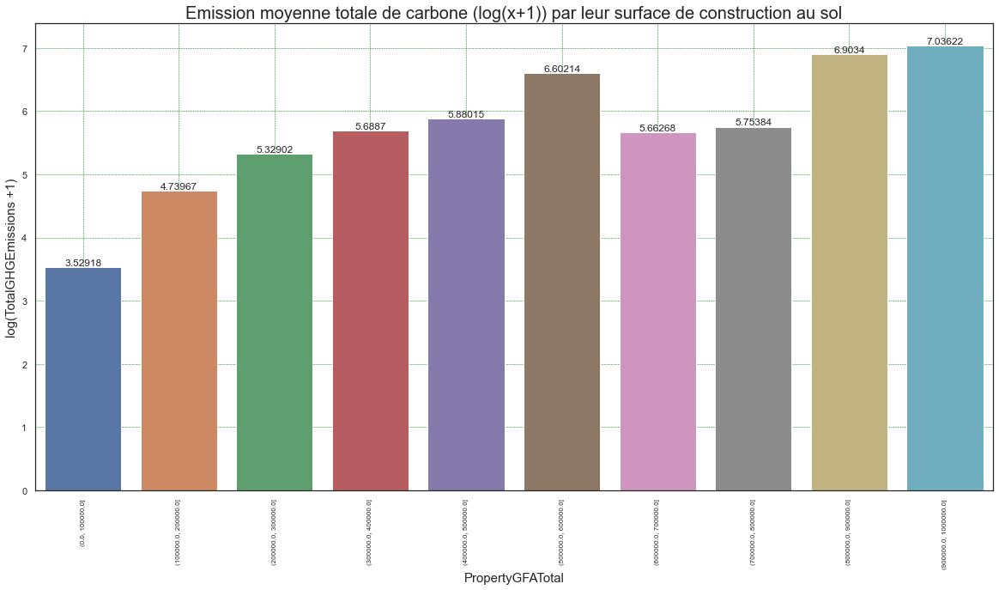

In [197]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['TotalGHGEmissions_log'], ci=None)
ax.set_ylabel('log(TotalGHGEmissions +1)', size=15)
ax.set_xlabel('PropertyGFATotal', size=15)
ax.bar_label(ax.containers[0])
plt.title("Emission moyenne totale de carbone (log(x+1)) par leur surface de construction au sol", size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90, size=8)

plt.show()

In [ ]:
#Les bâtiments ayant une surface de construction au sol entre 800 000 m^2 et 900 000 se démarquent des autres étant ce qui
#consomment le plus d'énergie. De même on voit que jusqu'à 300 000 m^2 on consomme le moins d'énergie.

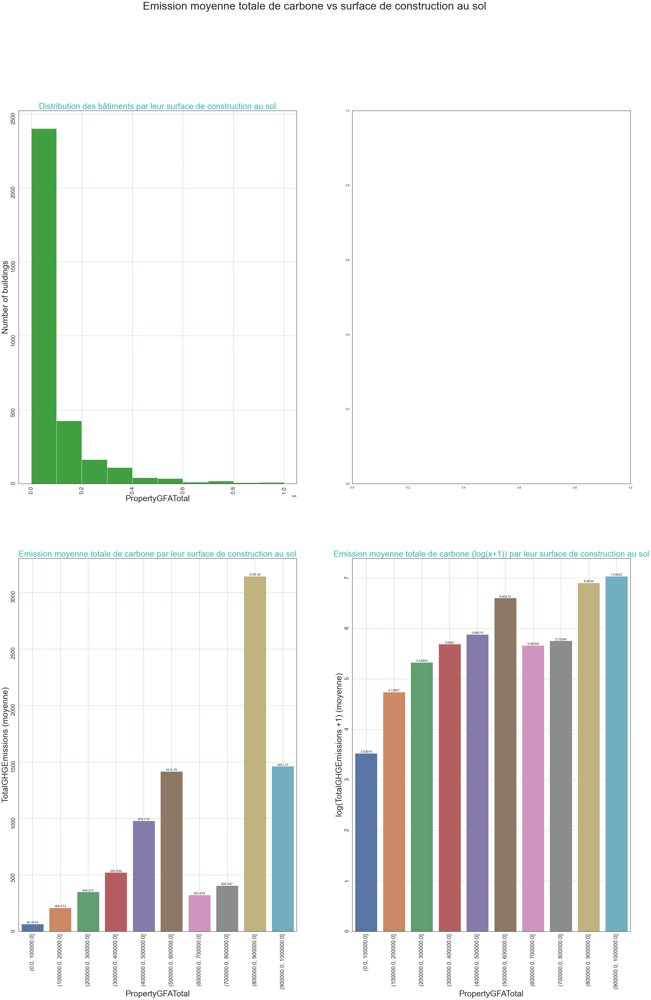

In [198]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='PropertyGFATotal', bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6], color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['TotalGHGEmissions'], ci=None, ax=axes[1,0])
sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1,1])


axes[0,0].set_xlabel('PropertyGFATotal',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par leur surface de construction au sol', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('PropertyGFATotal',size=30)
axes[1,0].set_ylabel('TotalGHGEmissions (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par leur surface de construction au sol", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('PropertyGFATotal',size=30)
axes[1,1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Emission moyenne totale de carbone (log(x+1)) par leur surface de construction au sol", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)


axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Emission moyenne totale de carbone vs surface de construction au sol",  size=40)
plt.show()

In [ ]:
#Les bâtiments ayant une surface de construction au sol entre 800 000 m^2 et 900 000 se démarquent des autres étant ceux qui
#émettent le plus de carbone. De même on voit que jusqu'à 200 000 m^2 on émet le moins de carbone.

#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.5 'SourceEUI_kBtu_sf' vs 'Neighborhood'

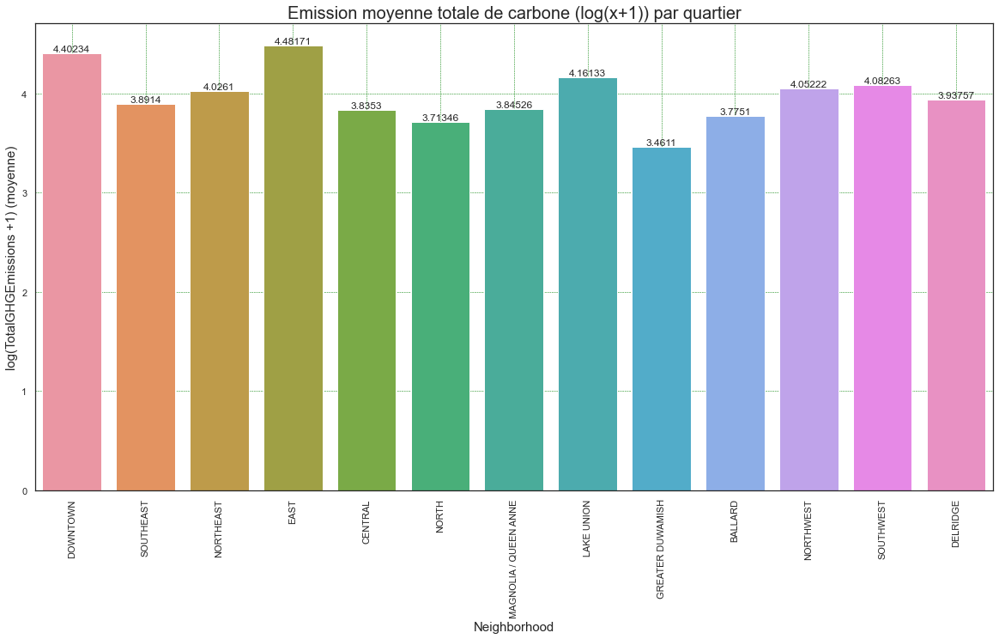

In [199]:
fig = plt.figure(figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

ax=sns.barplot(x=data2['Neighborhood'],y=data2['TotalGHGEmissions_log'],data=data2,ci=None)
ax.set_xlabel('Neighborhood',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
ax.bar_label(ax.containers[0])
plt.title("Emission moyenne totale de carbone (log(x+1)) par quartier",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#Les quartiers de Downtown, East, et Lake Union (dans cet ordre), sont ce qui montrent le plus grandes émissions
#moyennes de carbone.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par quartier, du coup il est intéressant de voir par 
#rapport a combien de bâtiments on a de telles moyennes:

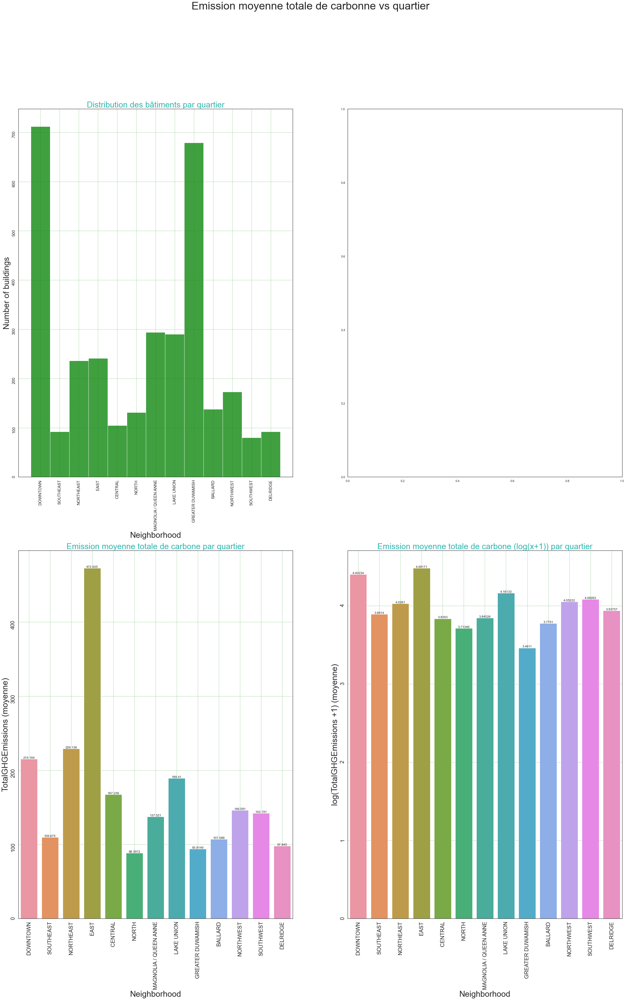

In [200]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=data2, x='Neighborhood', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['TotalGHGEmissions'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1,1],  edgecolor='white')

axes[0,0].set_xlabel('Neighborhood',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par quartier', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=15)

axes[1,0].set_xlabel('Neighborhood',size=30)
axes[1,0].set_ylabel('TotalGHGEmissions (moyenne)', size=30)
axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par quartier", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('Neighborhood',size=30)
axes[1,1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=30)
axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Emission moyenne totale de carbone (log(x+1)) par quartier", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)

axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Emission moyenne totale de carbonne vs quartier",  size=40)
plt.show()

In [ ]:
#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#C.6.6 'SourceEUI_kBtu_sf' vs 'ZipCode'

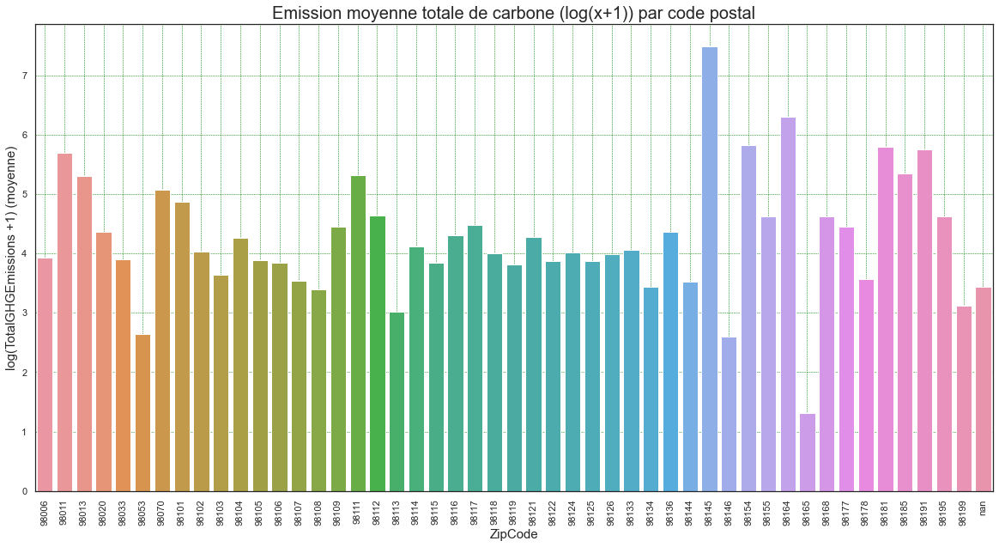

In [201]:
d2=data2.sort_values('ZipCode_New',ascending = True)

sns.set(font_scale =1)
sns.set_style("white")

fig = plt.figure(figsize=(20,10))
ax=sns.barplot(x=d2['ZipCode_New'],y=data2['TotalGHGEmissions_log'],data=data2,ci=None)
ax.set_xlabel('ZipCode',size=15)
ax.set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)

plt.title("Emission moyenne totale de carbone (log(x+1)) par code postal",  size=20)
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.xticks(rotation=90)
plt.show()

In [ ]:
#On a clairement un ZipCode qui ressort: 98145 par rapport a leur émission moyenne totale de carbone.

#Notez que le bar plot nous donne la moyenne des dépenses énergétiques par code postal, du coup il est intéressant de voir 
#par rapport a combien de bâtiments on a de telles moyennes:

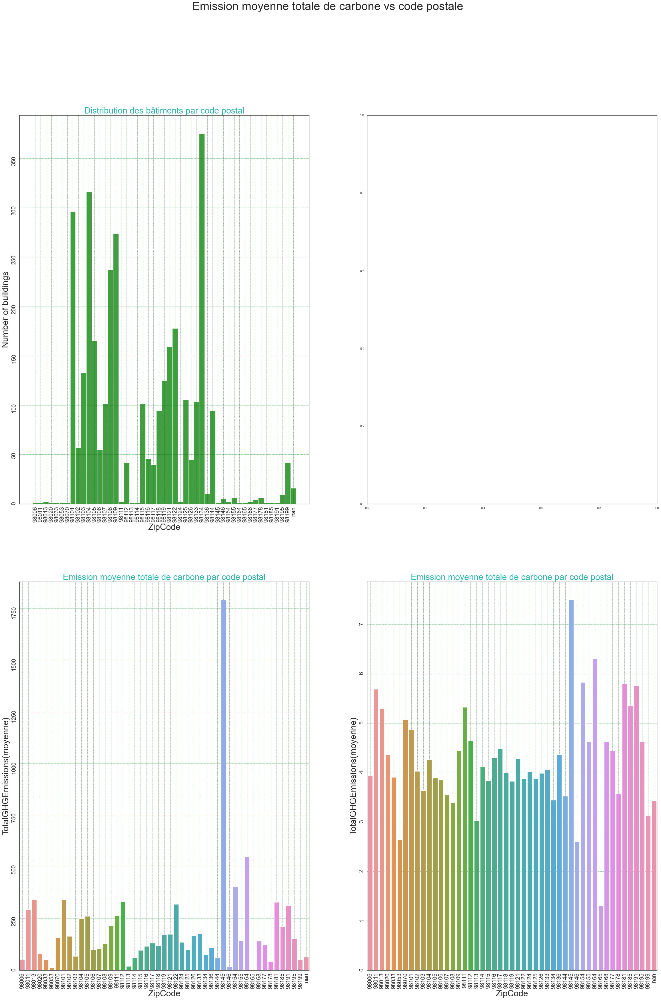

In [202]:
fig, axes=plt.subplots(nrows=2, ncols=2, sharex=False, sharey=False, figsize=(40,55))

sns.set(font_scale =1)
sns.set_style("white")

sns.histplot(data=d2, x='ZipCode_New', color='green', label='Total', edgecolor='white', ax=axes[0,0])
sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['TotalGHGEmissions'], ci=None, ax=axes[1,0],  edgecolor='white')
sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1,1],  edgecolor='white')                                                                                               
                                                                                                
axes[0,0].set_xlabel('ZipCode',size=30)
axes[0,0].set_ylabel('Number of buildings', size=30)
axes[0,0].set_title('Distribution des bâtiments par code postal', color='#2cb7b0', size=30)
axes[0,0].tick_params(labelrotation=90, labelsize=20)

axes[1,0].set_xlabel('ZipCode',size=30)
axes[1,0].set_ylabel('TotalGHGEmissions(moyenne)', size=30)
#axes[1,0].bar_label(axes[1,0].containers[0])
axes[1,0].set_title("Emission moyenne totale de carbone par code postal", color='#2cb7b0', size=30)
axes[1,0].tick_params(labelrotation=90, labelsize=20)

axes[1,1].set_xlabel('ZipCode',size=30)
axes[1,1].set_ylabel('TotalGHGEmissions(moyenne)', size=30)
#axes[1,1].bar_label(axes[1,1].containers[0])
axes[1,1].set_title("Emission moyenne totale de carbone par code postal", color='#2cb7b0', size=30)
axes[1,1].tick_params(labelrotation=90, labelsize=20)

                                                                                                
axes[0,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1,1].grid(color = 'green', linestyle = '--', linewidth = 0.5)                                                                                         

plt.suptitle("Emission moyenne totale de carbone vs code postale",  size=40)
plt.show()

In [203]:
d2['ZipCode_New'].isin(['nan']).sum()

16

In [ ]:
#Notez que les codes postal qui se démarquent le plus ne correspondent pas au ZipCodes centraux dont on parlait auparavant.
#C'est surtout 98145 qui émet le plus de carbone en moyenne totale.

#Notez aussi qu'on a des NaN (16 au total), que l'on devrait remplacer avant de passer au processus de machine learning. Du
#coup, comme les ZipCode on ne peut pas les inventer et même par quartier il y a plusieurs ZipCode, on préférera ne pas 
#utiliser cette variable à moins d'éliminer les 16 lignes qui n'ont pas de code postal renseigné.


#ATTENTION: Il est important de savoir que quand on applique le logarithme sur une distribution, et que l'on étudie la
#répartition de cette distribution par rapport à d'autre variables, on a un lissage, et souvent des différences. En fait si
#dans une classe on a par exemple une moyenne très grande dû à la présence d'un seul bâtiment très dépenseur alors que tous
#les autres le sont moins, l'effet et lissé. Et ainsi, une classe à moyenne très grande à cause de ca, pourra avec le log 
#avoir une moyenne moins importante que celle d'une classe plus homogène dans ses valeurs mais qui sans le log avait une 
#moyenne moins importante.

#------------------------------

#C.9 Comparaisons des 2 variables:

#C.9.1 'SourceEUI=_kBtu_sf' & 'TotalGHGEmissions' vs 'BuildingType'.

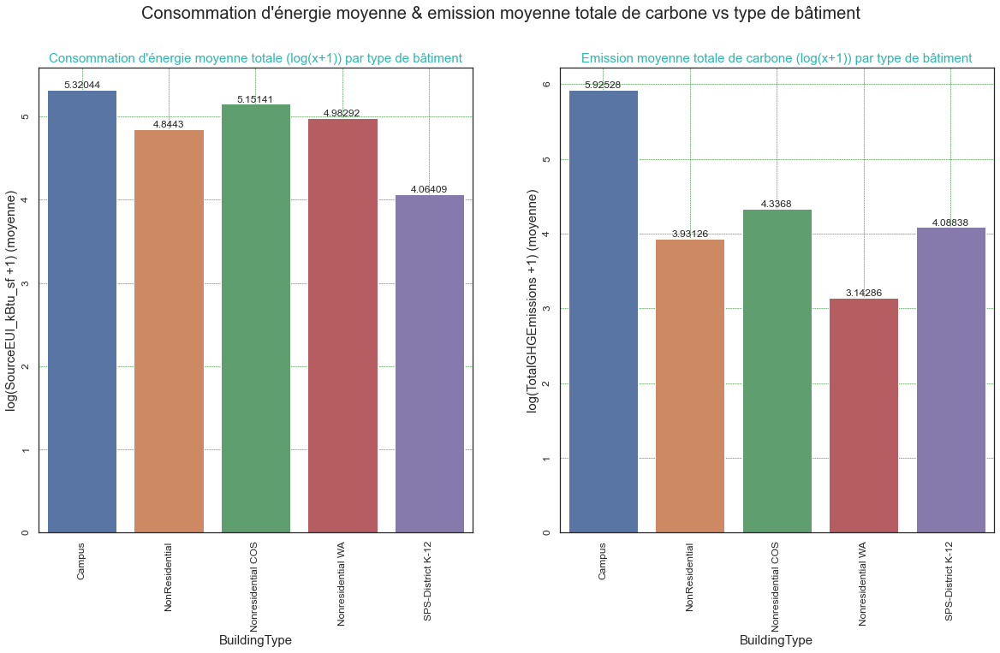

In [204]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,10))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(x=data2['BuildingType'],y=data2['SourceEUI_kBtu_sf_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(x=data2['BuildingType'],y=data2['TotalGHGEmissions_log'],data=data2,order=['Campus','NonResidential','Nonresidential COS','Nonresidential WA','SPS-District K-12'], ci=None, ax=axes[1],  edgecolor='white')


axes[0].set_xlabel('BuildingType',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par type de bâtiment", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('BuildingType',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par type de bâtiment", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)


axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs type de bâtiment",  size=20)
plt.show()


In [ ]:
#Notez que les 'Campus' ressortent comme les plus consommateurs d'énergie et ceux qui émettent le plus de carbone.

#C.9.2 'SourceEUI_kBtu_sf' & 'TotalGHGEmissions' vs 'YearBuilt'.

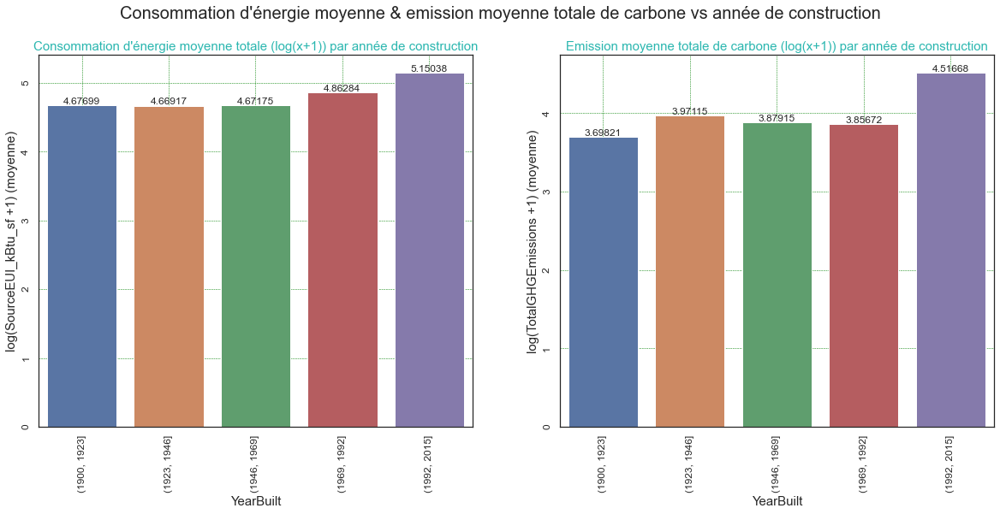

In [205]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(data=data2, x=pd.cut(data2['YearBuilt'], bins=[1900,1923,1946,1969,1992,2015]), y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1],  edgecolor='white')

axes[0].set_xlabel('YearBuilt',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par année de construction", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('YearBuilt',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par année de construction", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)

axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs année de construction",  size=20)
plt.show()

In [ ]:
#Notez que ce qui consomment le plus d’énergie et ceux qui émettent le plus de carbone, sont les bâtiments de moins de 23 
#ans (construits entre 1992 et 2015).

#C.9.3 'SourceEUI_kBtu_sf' & 'TotalGHGEmissions'  vs 'NumberofFloors'

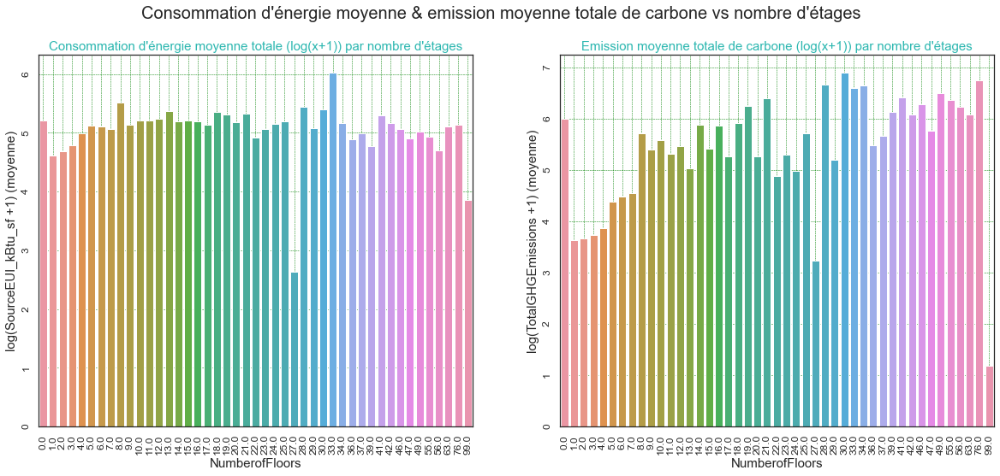

In [206]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(data=data2, x=data2['NumberofFloors'], y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1],  edgecolor='white')

axes[0].set_xlabel('NumberofFloors',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
#axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par nombre d'étages", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('NumberofFloors',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
#axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par nombre d'étages", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)

axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs nombre d'étages",  size=20)
plt.show()

In [ ]:
#les bâtiments avec 99 étages semblent se démarquer pour émettre le moins de carbone et consommer le moins d'énergie, mais
#ceci, n'est pas logique. On ne va pas la considérer, car elle n'apporte pas grand chose de plus.

#C.9.4 'SourceEUI_kBtu_sf' & 'TotalGHGEmissions' vs 'PropertyGFATotal'

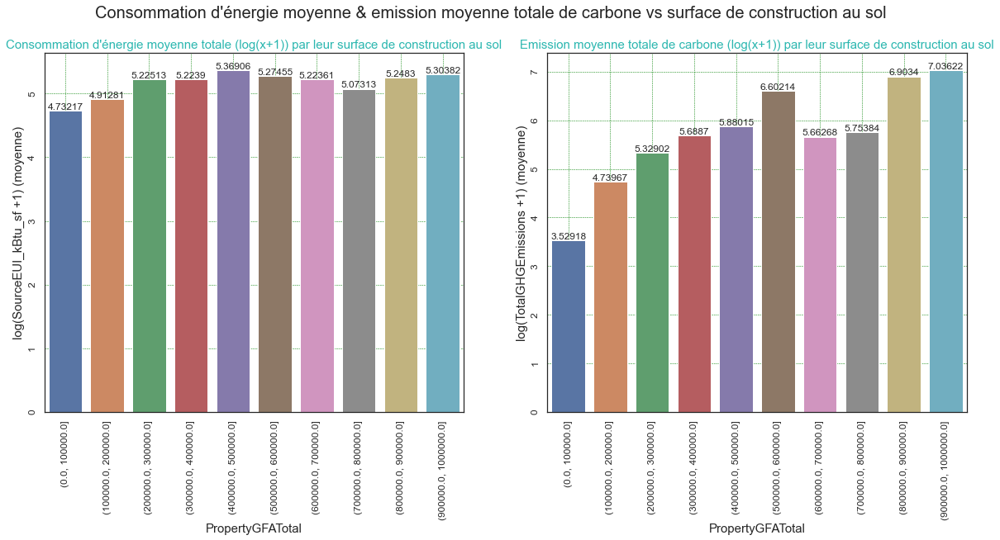

In [207]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0])
sns.barplot(data=data2, x=pd.cut(data2['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6]), y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1])

axes[0].set_xlabel('PropertyGFATotal',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par leur surface de construction au sol", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('PropertyGFATotal',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par leur surface de construction au sol", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)

axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs surface de construction au sol",  size=20)
plt.show()

In [ ]:
#Notez que les bâtiments ayant une surface de construction au sol entre 800 000 m^2 et 1 000 000 se démarquent des autres 
#étant parmi ceux qui consomment le plus d'énergie et ceux qui émettent le plus de carbone. De même on voit que jusqu'à 
#200 000 m^2 on consomme le moins d'énergie et on émet le moins de carbone.

#C.6.5 'SourceEUI_kBtu_sf' & 'TotalGHGEmissions'  vs 'Neighborhood'

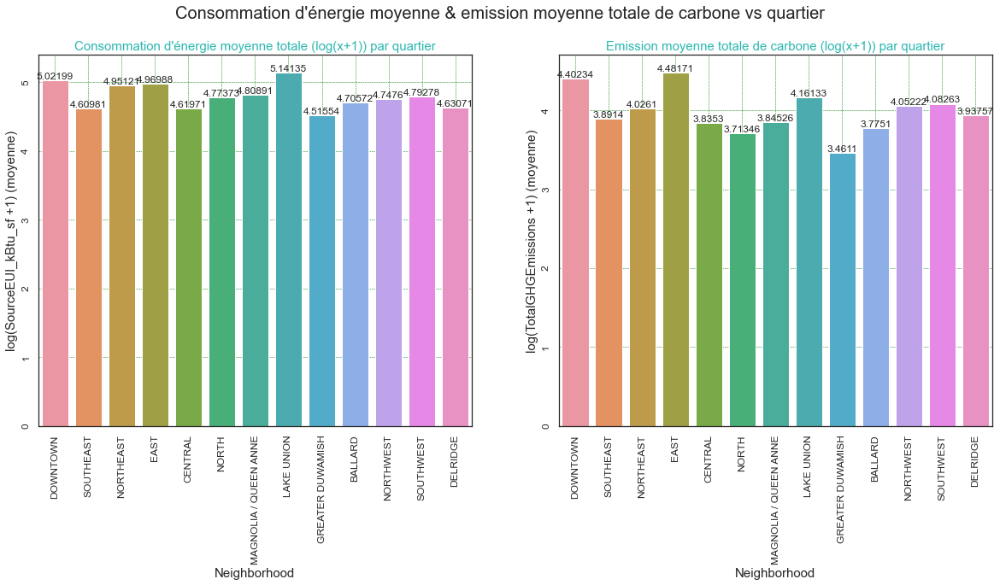

In [208]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(data=data2, x=data2['Neighborhood'],y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1],  edgecolor='white')

axes[0].set_xlabel('Neighborhood',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par quartier", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('Neighborhood',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par quartier", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)

axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs quartier",  size=20)
plt.show()

In [ ]:
#Notez que le 'Downtow', 'East' et le 'Lake Union' se démarquent pour être les quartiers qui consomment le plus d'énergie et qui
#émettent le plus de carbone.

#C.9.6 'SourceEUI_kBtu_sf' & 'TotalGHGEmissions' vs 'ZipCode'

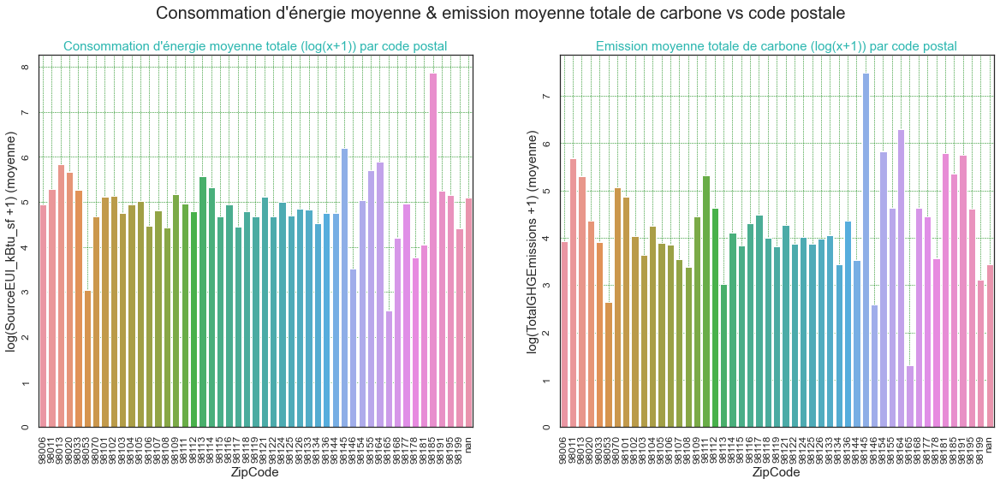

In [209]:
fig, axes=plt.subplots(nrows=1, ncols=2, sharex=False, sharey=False, figsize=(20,8))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(data=d2, x=d2['ZipCode_New'],y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1],  edgecolor='white')

axes[0].set_xlabel('ZipCode',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
#axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par code postal", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('ZipCode',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
#axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par code postal", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)


axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs code postale",  size=20)
plt.show()

In [ ]:
#Notez que le code postal 98185 se démarque pour être celui qui consomme le plus d'énergie, alors que c'est le 98145 celui
#qui se démarque pour être celui qui émet le plus de carbone.

#En regardant les graphiques précédents ce qui semble apporter le plus d'information par rapport et à la consommation
#d'énergie moyenne totale et à l'émission moyenne totale de carbone sont:
#'BuildingType', 'Neighborhood', 'PropertyGFATotal', 'YearBuilt', 'ZipCode'.
#C'est donc avec ces variables qu'on restera.

In [ ]:
#------------------------------

#C.10 Analyse de la variable 'ENERGYSTARScore'
#Note: J'ai décidé de traiter la variable 'ENERGYSTARScore' séparément pour bien faire ressortir si elle était ou pas utile.

In [210]:
data2.count()

DataYear                         3263
OSEBuildingID                    3263
TaxParcelIdentificationNumber    3262
PropertyName                     3263
BuildingType                     3263
YearBuilt                        3263
NumberofFloors                   3255
PropertyGFATotal                 3263
ENERGYSTARScore                  2175
SourceEUI_kBtu_sf                3263
TotalGHGEmissions                3263
Neighborhood                     3263
ZipCode_New                      3263
NumberofFloors_log               3255
PropertyGFATotal_log             3263
SourceEUI_kBtu_sf_log            3263
TotalGHGEmissions_log            3263
dtype: int64

In [211]:
data2['ENERGYSTARScore'].describe()

count    2175.000000
mean       64.781149
std        28.208742
min         1.000000
25%        47.500000
50%        72.000000
75%        88.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64

In [212]:
data2_2015['ENERGYSTARScore'].describe()

count    1092.000000
mean       64.374542
std        28.048469
min         1.000000
25%        47.000000
50%        72.000000
75%        88.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64

In [213]:
data2_2016['ENERGYSTARScore'].describe()

count    1083.000000
mean       65.191136
std        28.376486
min         1.000000
25%        48.000000
50%        73.000000
75%        89.000000
max       100.000000
Name: ENERGYSTARScore, dtype: float64

In [ ]:
#Voyons la forme de la distribution.

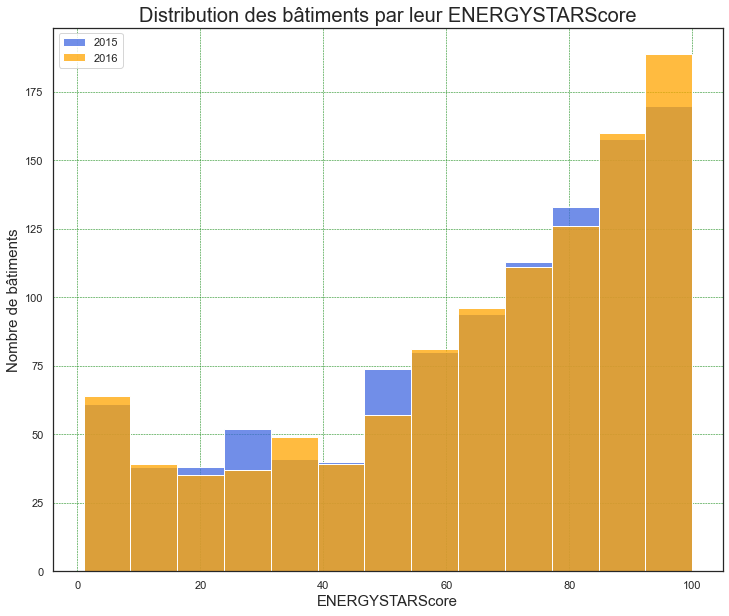

In [214]:
fig = plt.figure(figsize=(12,10))

sns.set(font_scale =1)
sns.set_style("white")

ax = sns.histplot(data=data2_2015, x='ENERGYSTARScore', color='royalblue', label='2015', edgecolor='white')
ax = sns.histplot(data=data2_2016, x='ENERGYSTARScore', color='orange', label='2016', edgecolor='white')
ax.set_xlabel('ENERGYSTARScore',size=15)
ax.set_ylabel('Nombre de bâtiments', size=15)
plt.title('Distribution des bâtiments par leur ENERGYSTARScore',  size=20)
plt.legend()
plt.grid(color = 'green', linestyle = '--', linewidth = 0.5)
plt.show()

In [ ]:
#Notez que le Energy score ne semble pas stable entre les 2 années, en fait il varie trop d'une année à l'autre. Ce n'est
#donc pas un indice fiable. De plus, il est difficile à calculer et a plus de données manquantes que le reste des 
#variables. Il faudrait alors les compléter et ceci rajoute du biais. A contrario pour le autres variables on peu enlever 
#les lignes à données manquantes puisqu'il n'y en a pas beaucoup.

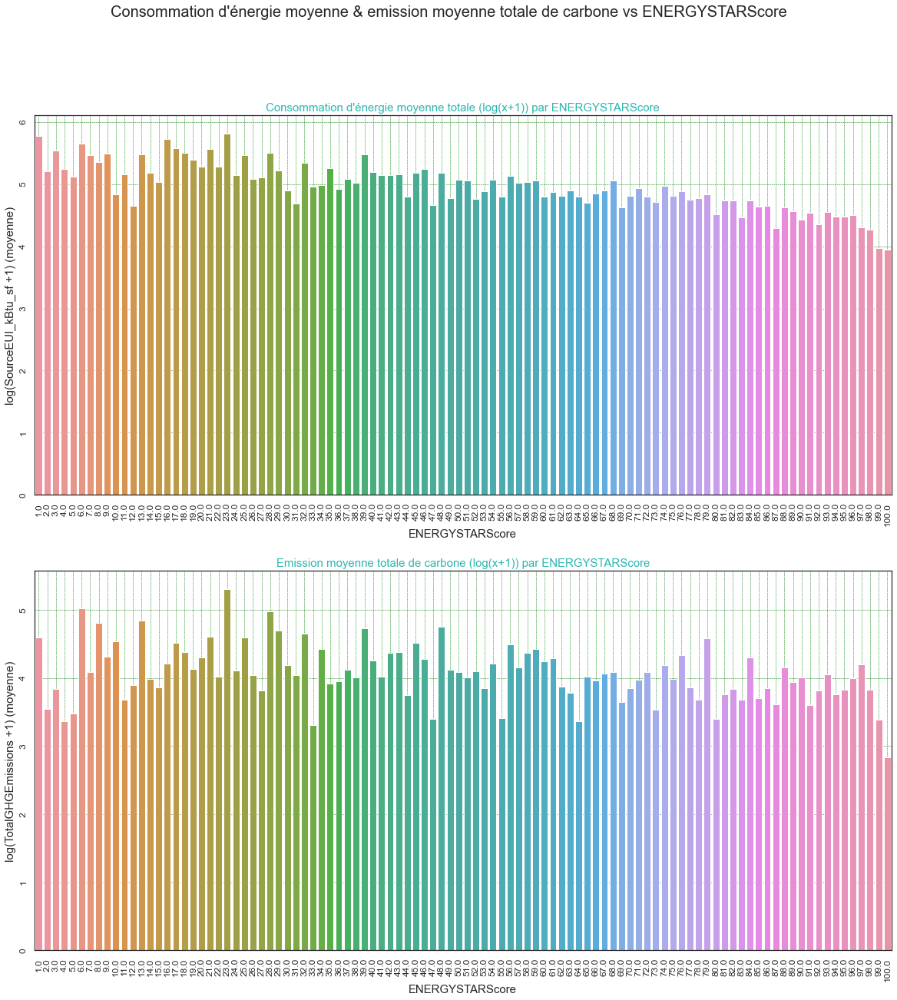

In [215]:
fig, axes=plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(20,20))

sns.set(font_scale =1)
sns.set_style("white")

sns.barplot(data=data2, x=data2['ENERGYSTARScore'], y=data2['SourceEUI_kBtu_sf_log'], ci=None, ax=axes[0],  edgecolor='white')
sns.barplot(data=data2, x=data2['ENERGYSTARScore'], y=data2['TotalGHGEmissions_log'], ci=None, ax=axes[1],  edgecolor='white')

axes[0].set_xlabel('ENERGYSTARScore',size=15)
axes[0].set_ylabel('log(SourceEUI_kBtu_sf +1) (moyenne)', size=15)
#axes[0].bar_label(axes[0].containers[0])
axes[0].set_title("Consommation d'énergie moyenne totale (log(x+1)) par ENERGYSTARScore", color='#2cb7b0', size=15)
axes[0].tick_params(labelrotation=90, labelsize=12)

axes[1].set_xlabel('ENERGYSTARScore',size=15)
axes[1].set_ylabel('log(TotalGHGEmissions +1) (moyenne)', size=15)
#axes[1].bar_label(axes[1].containers[0])
axes[1].set_title("Emission moyenne totale de carbone (log(x+1)) par ENERGYSTARScore", color='#2cb7b0', size=15)
axes[1].tick_params(labelrotation=90, labelsize=12)

axes[0].grid(color = 'green', linestyle = '--', linewidth = 0.5)
axes[1].grid(color = 'green', linestyle = '--', linewidth = 0.5)

plt.suptitle("Consommation d'énergie moyenne & emission moyenne totale de carbone vs ENERGYSTARScore",  size=20)
plt.show()

In [ ]:
#Notez qu'il n'y a pas vraiment de correspondance entre la consommation moyenne d'énérgie et le ENERGYSTARScore.
# Il y a plus une 'tendance' entre l'émission moyenne totale de carbone et le ENERGYSTARScore, mais qui ne se confirme pas 
#forcément pour les ENERGYSTARScore bas. Ce qui unis aux raisons précédentes d'instabilité dans le temps et difficulté de 
#calcul explique que le ENERGYSTARScore ne soit pas intéressant pour nous.

#--------------------------------------------------------------------------------------------------------------------------
#D. Génération de la base de données à utiliser par la suite:

    #- 'OSEBuildingID','TaxParcelIdentificationNumber','PropertyName'--> pour identifier les bâtiments si besoin, mais ces 
    #   variables ne seront pas prises en compte dans nos modèles.
    #- 'SourceEUI_kBtu_sf_log','TotalGHGEmissions_log'--> variables cibles.
    #- 'BuildingType','YearBuilt','PropertyGFATotal',,'Neighborhood', 'ZipCode'-->variables desciptives.
    
    #et aussi une base incluant le ENERGYSTARScore.

In [216]:
data2.dtypes

DataYear                           int64
OSEBuildingID                      int64
TaxParcelIdentificationNumber     object
PropertyName                      object
BuildingType                      object
YearBuilt                          int64
NumberofFloors                   float64
PropertyGFATotal                   int64
ENERGYSTARScore                  float64
SourceEUI_kBtu_sf                float64
TotalGHGEmissions                float64
Neighborhood                      object
ZipCode_New                       object
NumberofFloors_log               float64
PropertyGFATotal_log             float64
SourceEUI_kBtu_sf_log            float64
TotalGHGEmissions_log            float64
dtype: object

In [ ]:
#D.1 Sans "ENERGYSTARScore":

In [217]:
data2_final=data2.loc[:,['OSEBuildingID','TaxParcelIdentificationNumber','PropertyName','SourceEUI_kBtu_sf_log','TotalGHGEmissions_log','BuildingType','YearBuilt','PropertyGFATotal','Neighborhood','ZipCode_New']]

In [218]:
data2_final.count()

OSEBuildingID                    3263
TaxParcelIdentificationNumber    3262
PropertyName                     3263
SourceEUI_kBtu_sf_log            3263
TotalGHGEmissions_log            3263
BuildingType                     3263
YearBuilt                        3263
PropertyGFATotal                 3263
Neighborhood                     3263
ZipCode_New                      3263
dtype: int64

In [ ]:
#On élimine les lignes qui ont des 'NaN' pour les 'ZipCode_New'. (Il y en a que 16 alors ce n'est pas vraiment grave).

In [219]:
data2_final=data2_final[data2_final['ZipCode_New']!='nan']
data2_final.count()

OSEBuildingID                    3247
TaxParcelIdentificationNumber    3246
PropertyName                     3247
SourceEUI_kBtu_sf_log            3247
TotalGHGEmissions_log            3247
BuildingType                     3247
YearBuilt                        3247
PropertyGFATotal                 3247
Neighborhood                     3247
ZipCode_New                      3247
dtype: int64

In [ ]:
#On garde le dernier tableau en format CSV

In [220]:
data2_final.to_csv(r'C:\Users\'titite\Desktop\Data Science candidature\Projets\Projet 4\Data\Data_clean.csv', index = False)

In [ ]:
#Afin de tester si nos modèles réagissent mieux ou pas en considérant les bins pour les variables 'YearBuilt' et
#'PropertyGFATotal', comme on l'a fait dans nos graphiques précédents, on va aussi transformer les variables 'YearBuilt' et 
#'PropertyGFATotal' en classes, puis exporter en format CSV aussi ce deuxième tableau.

In [221]:
data3_final=data2_final
data3_final=pd.DataFrame(data3_final)
data3_final['YearBuilt_bins']=pd.cut(x=data3_final['YearBuilt'], bins=[1899,1923,1946,1969,1992,2015])

In [222]:
data3_final['PropertyGFATotal_bins']=pd.cut(x=data3_final['PropertyGFATotal'], bins=[0,0.1e6,0.2e6,0.3e6,0.4e6,0.5e6,0.6e6,0.7e6,0.8e6,0.9e6,1e6,1e7])
data3_final.head(5)

,OSEBuildingID,TaxParcelIdentificationNumber,PropertyName,SourceEUI_kBtu_sf_log,TotalGHGEmissions_log,BuildingType,YearBuilt,PropertyGFATotal,Neighborhood,ZipCode_New,YearBuilt_bins,PropertyGFATotal_bins
0,1,659000030,MAYFLOWER PARK HOTEL,5.161925,5.523179,NonResidential,1927,88434,DOWNTOWN,98101,"(1923, 1946]","(0.0, 100000.0]"
1,2,659000220,PARAMOUNT HOTEL,5.259057,5.577879,NonResidential,1996,103566,DOWNTOWN,98101,"(1992, 2015]","(100000.0, 200000.0]"
2,3,659000475,WESTIN HOTEL,5.495938,7.631664,NonResidential,1969,961990,DOWNTOWN,98101,"(1946, 1969]","(900000.0, 1000000.0]"
4,8,659000970,WARWICK SEATTLE HOTEL,5.437209,6.231858,NonResidential,1980,119890,DOWNTOWN,98121,"(1969, 1992]","(100000.0, 200000.0]"
5,9,660000560,WEST PRECINCT (SEATTLE POLICE),5.750984,5.722343,Nonresidential COS,1999,97288,DOWNTOWN,98101,"(1992, 2015]","(0.0, 100000.0]"


In [223]:
data3_final.drop({'PropertyGFATotal','YearBuilt'}, axis=1, inplace=True)

In [ ]:
#On garde le dernier tableau en format CSV

In [224]:
data3_final.to_csv(r'C:\Users\'titite\Desktop\Data Science candidature\Projets\Projet 4\Data\Data_clean_bins.csv', index = False)

In [ ]:
#----------------------------------------------------------------------

#D.2 Avec "ENERGYSTARScore":

In [225]:
data2_final_E=data2.loc[:,['OSEBuildingID','TaxParcelIdentificationNumber','PropertyName','SourceEUI_kBtu_sf_log','TotalGHGEmissions_log','BuildingType','YearBuilt','PropertyGFATotal','Neighborhood','ZipCode_New','ENERGYSTARScore']]

In [226]:
data2_final_E.count()

OSEBuildingID                    3263
TaxParcelIdentificationNumber    3262
PropertyName                     3263
SourceEUI_kBtu_sf_log            3263
TotalGHGEmissions_log            3263
BuildingType                     3263
YearBuilt                        3263
PropertyGFATotal                 3263
Neighborhood                     3263
ZipCode_New                      3263
ENERGYSTARScore                  2175
dtype: int64

In [ ]:
#On élimine les lignes qui ont des 'NaN' pour les 'ENERGYSTARScore'. (On ne peut pas remplacer ces NaN).

In [227]:
data2_final_E=data2_final_E.dropna(subset=['ENERGYSTARScore'])
data2_final_E.count()

OSEBuildingID                    2175
TaxParcelIdentificationNumber    2175
PropertyName                     2175
SourceEUI_kBtu_sf_log            2175
TotalGHGEmissions_log            2175
BuildingType                     2175
YearBuilt                        2175
PropertyGFATotal                 2175
Neighborhood                     2175
ZipCode_New                      2175
ENERGYSTARScore                  2175
dtype: int64

In [228]:
data2_final_E['ENERGYSTARScore'].unique()

array([ 65.,  51.,  18.,  67.,  25.,  46.,  48.,  32.,  39.,  56.,  14.,
        30.,  83.,  96.,  85.,  20.,  57.,  60.,  80.,  94.,  77.,   1.,
        91.,  88.,  93.,  95.,  68.,  79.,  99.,  86.,  84.,  81.,  50.,
        24.,  40.,  89.,  72.,  52.,  43., 100.,  71.,  75.,  97.,  28.,
        92.,  62.,  90.,  19.,  98.,  13.,  74.,  82.,  76.,  31.,  73.,
        61.,  55.,  45.,  63.,  49.,  87.,   7.,  23.,  34.,  59.,  36.,
        70.,  66.,  17.,  22.,  11.,  44.,   4.,  54.,   8.,  35.,  27.,
        78.,   6.,  16.,  69.,  29.,  47.,  33.,  38.,  58.,  64.,   3.,
        53.,  10.,  21.,  42.,  26.,  37.,   9.,  15.,  12.,   5.,   2.,
        41.])

In [229]:
data2_final_E['ZipCode_New'].unique()

array(['98101', '98121', '98104', '98118', '98105', '98112', '98125',
       '98109', '98199', '98115', '98107', '98144', '98103', '98119',
       '98122', '98126', '98133', '98106', '98108', '98117', '98134',
       '98136', '98116', '98177', '98102', '98155', '98178', '98146',
       '98033', '98191', '98154', '98164', '98195', '98185', '98168',
       '98053', '98114', '98165', '98020', '98145', 'nan'], dtype=object)

In [230]:
data2_final_E=data2_final_E[data2_final_E['ZipCode_New']!='nan']
data2_final_E.count()

OSEBuildingID                    2172
TaxParcelIdentificationNumber    2172
PropertyName                     2172
SourceEUI_kBtu_sf_log            2172
TotalGHGEmissions_log            2172
BuildingType                     2172
YearBuilt                        2172
PropertyGFATotal                 2172
Neighborhood                     2172
ZipCode_New                      2172
ENERGYSTARScore                  2172
dtype: int64

In [ ]:
#On garde le dernier tableau en format CSV

In [231]:
data2_final_E.to_csv(r'C:\Users\'titite\Desktop\Data Science candidature\Projets\Projet 4\Data\Data_clean_E.csv', index = False)